# Analysis of hand drawn maps

This script is for analysing hand drawn maps of the Willunga sub-basin based on manual water table mapping exercise and survey and to make the figures for the paper.

Rasters are made in ArcGis using the hand drawn contour data and converting it to a raster using "Topo2Raster" tool

Script is run in the `conda activate geo_env` enviroment

## Import packages

In [1]:
from __future__ import division

#import affine
#import contextily
import matplotlib.colors as mcolors
import matplotlib.cm as cm

import fiona
import geopandas as gpd
import math

import matplotlib as mpl
from   matplotlib.colors import LinearSegmentedColormap
import matplotlib.cm as cm
import matplotlib.pyplot as plt
from   matplotlib.patches import Patch
from   matplotlib.ticker import FormatStrFormatter
import os
import numpy as np
import pyproj
import pandas as pd

import rasterio 
from   rasterio.crs import CRS
from   rasterio.enums import Resampling
from   rasterio.features import rasterize
import rasterio.mask
from   rasterio.plot import show
from   rasterio.transform import from_bounds
from   rasterio import shutil as rio_shutil
from   rasterio.vrt import WarpedVRT
from   rasterio import Affine

from   requests import Request
import seaborn as sns
from   scipy.interpolate import interpn
from   scipy.interpolate import griddata
from   scipy import stats
import sys
import shapely
from   shapely.geometry import Point
from   shapely.geometry import mapping, Polygon
import string
from   owslib.wcs import WebCoverageService



%matplotlib inline

In [2]:
wt_cmap = 'rainbow'

In [3]:
filelocation = r'C:\Users\mar886\WaterTableProject\Willunga\hand_output_rasters\results_arrays'
figure_directory = r'C:\Users\mar886\WaterTableProject\Willunga\willunga_wt\figures\paper'

In [4]:
names_list = []
arrays_list = []

for file in os.listdir(filelocation):
    if file.endswith(".out"):
        names_list.append(file)
        ar = np.loadtxt(os.path.join(filelocation, file))
        arrays_list.append(ar)
    else:
        pass
    
print(names_list)
print(len(names_list))

['001.out', '002.out', '003.out', '004.out', '005.out', '008.out', '009.out', '012.out', '012b.out', '014.out', '016.out', '017.out', '021.out', '024.out', '025.out', '026.out', '028.out', '029.out', '030.out', '031.out', '032.out', '033.out', '034.out', '036.out', '037.out', '043.out', '044.out', '045.out', '047.out', '048.out', '049.out', '050.out', 'AAA3.out', 'AGC_001.out', 'AGC_011.out', 'AGC_014.out', 'AGC_015.out', 'AGC_016.out', 'AGC_018.out', 'BARD.out', 'BB01.out', 'C01.out', 'DEW_01.out', 'DEW_02.out', 'DEW_03.out', 'DEW_04.out', 'EMM01.out', 'E_0123.out', 'GH01.out', 'J5897.out', 'JAR.out', 'LW.out', 'NB.out', 'R01.out', 'R051.out', 'RS01.out', 'SJ01.out', 'TV_001.out', 'UWA_001.out', 'UWA_002.out', 'UWA_003.out', 'U_1949.out', 'XZ01.out']
63


In [5]:
survey_levels = [0,10,20,30,40,50,60,70,80,90,100,125,150,175,200,225]

### Plotting all maps

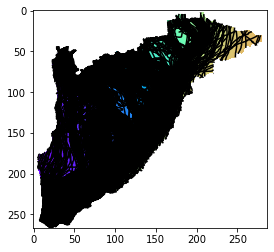

In [6]:
plt.figure()
for i in range(len(arrays_list)):
    #plt.figure()
    plt.imshow(arrays_list[i], cmap=wt_cmap, vmin=-10, vmax=350, alpha=0.1)
    cs = plt.contour(arrays_list[i], levels=survey_levels, colors="k") 

### Calulate statistics

In [7]:
wt_array_stack = np.dstack(arrays_list)
print(wt_array_stack.shape)
wt_array_stack = np.moveaxis(wt_array_stack, source=2, destination=0)
print(wt_array_stack.shape)

(267, 287, 63)
(63, 267, 287)


In [8]:
max_array = np.amax(wt_array_stack, axis=0)
min_array = np.amin(wt_array_stack, axis=0)
range_array = max_array - min_array
std_array = np.nanstd(wt_array_stack, axis=0)
mean_array = np.nanmean(wt_array_stack, axis=0)

C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\numpy\lib\nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\mar886\AppData\Local\Temp/ipykernel_18412/1839270943.py:5: RuntimeWarning: Mean of empty slice
  mean_array = np.nanmean(wt_array_stack, axis=0)


### Plot statistics

In [9]:
mean_array

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])

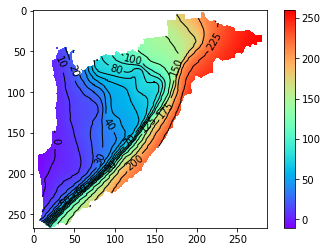

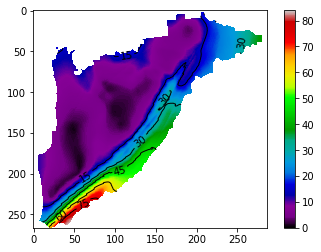

In [10]:
plt.figure()
m = plt.imshow(mean_array, cmap=wt_cmap)
cs = plt.contour(mean_array, levels=survey_levels, colors="k", linewidths=1)
plt.clabel(cs)
plt.colorbar(m)

plt.figure()
s = plt.imshow(std_array, cmap='nipy_spectral')
cs = plt.contour(std_array, colors="k", linewidths=1)
plt.clabel(cs)
plt.colorbar(s)

### Coefficient of variation

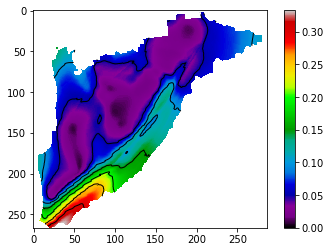

In [11]:
coeff_of_var = std_array/np.abs(mean_array+100)

# It needs to be scaled, if the values are too close to 0 they are just ridiculous...

plt.figure()
c = plt.imshow(coeff_of_var, cmap='nipy_spectral')
plt.contour(coeff_of_var, colors="k", linewidths=1)
plt.colorbar(c)

### Highlight variability on plain

- Doens't show much extra

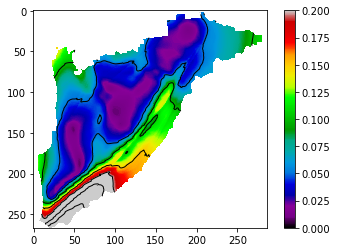

In [12]:
plt.figure()
c = plt.imshow(coeff_of_var, cmap='nipy_spectral', vmax=0.2)
plt.contour(coeff_of_var, colors="k", linewidths=1)
plt.colorbar(c)

### Highlight variability on the hills

- Doesn't really show much extra either

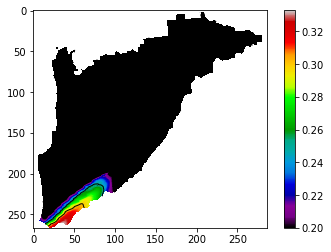

In [13]:
plt.figure()
c = plt.imshow(coeff_of_var, cmap='nipy_spectral', vmin=0.2)
plt.contour(coeff_of_var, colors="k", linewidths=1)
plt.colorbar(c)

### Plot variation in a few key parts

BUT I SHOULD DO THIS WITH THE ACTUAL SHAPE FILES NOT THE CONTOURS FROM THE RASTER - THEY ARE DIFFERENT

C:\Users\mar886\AppData\Local\Temp/ipykernel_18412/2619860221.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


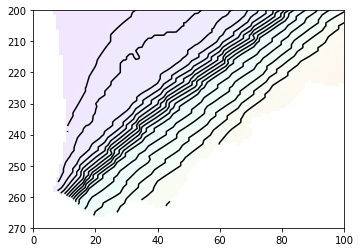

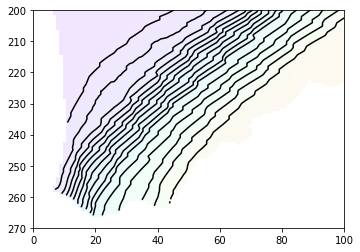

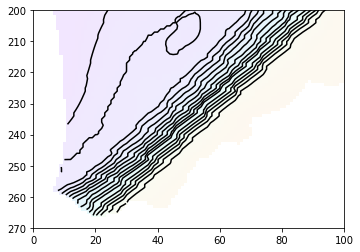

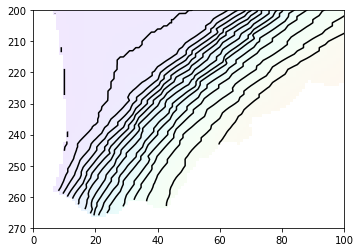

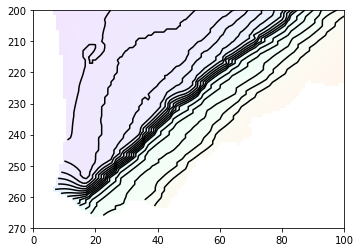

...

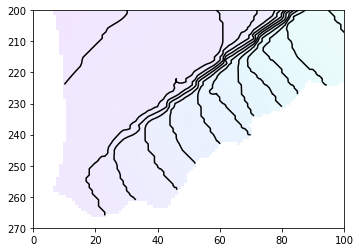

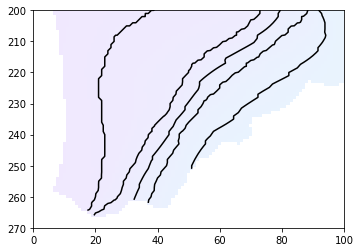

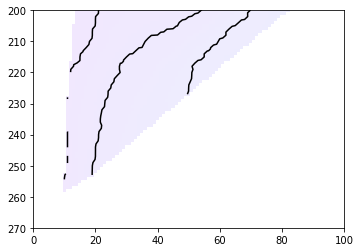

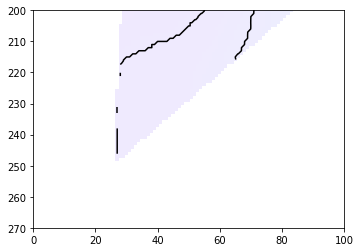

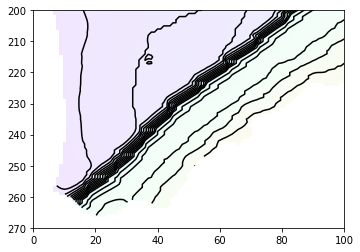

In [14]:
#plt.figure()
for i in range(len(arrays_list)):
    plt.figure()
    plt.imshow(arrays_list[i], cmap=wt_cmap, vmin=-10, vmax=350, alpha=0.1)
    #plt.ylim(200,250)
    cs = plt.contour(arrays_list[i], levels=survey_levels, colors="k") 
    
    plt.xlim(0,100)
    plt.ylim(200,270)
    axes = plt.gca()
    axes.invert_yaxis()

C:\Users\mar886\AppData\Local\Temp/ipykernel_18412/1026238948.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


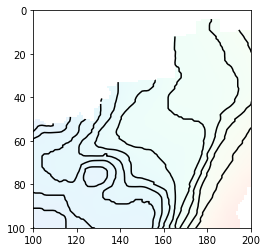

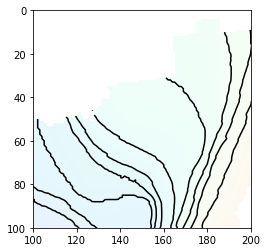

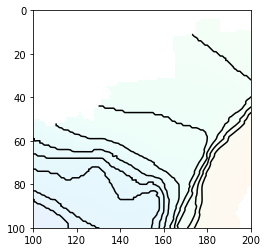

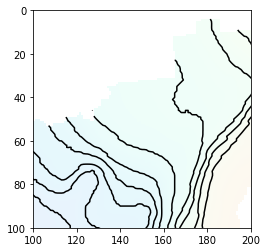

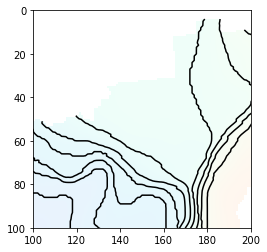

...

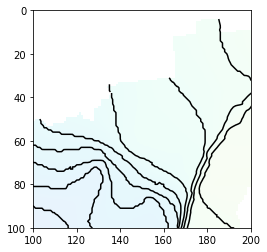

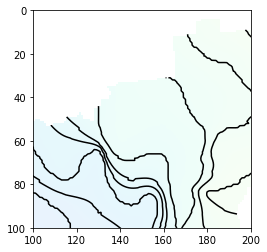

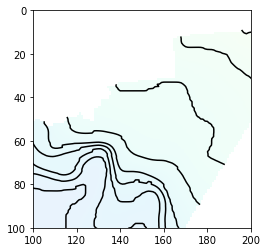

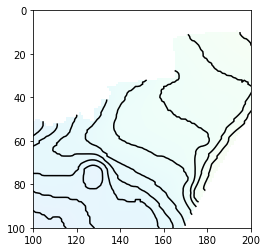

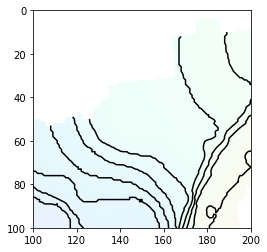

In [15]:
#plt.figure()
for i in range(len(arrays_list)):
    plt.figure()
    plt.imshow(arrays_list[i], cmap=wt_cmap, vmin=-10, vmax=350, alpha=0.1)
    #plt.ylim(200,250)
    cs = plt.contour(arrays_list[i], levels=survey_levels, colors="k") 
    
    plt.xlim(100,200)
    plt.ylim(0,100)
    axes = plt.gca()
    axes.invert_yaxis()

## Pull in well indices

In [16]:
f_well_ixs = os.path.join(r'C:\Users\mar886\WaterTableProject\Willunga\willunga_wt\output_data',
                         "df_well_ixs.csv")

df_well_ixs = pd.read_csv(f_well_ixs)

df_well_ixs = df_well_ixs.drop(columns=['DHNO.1'])
df_well_ixs.head()

,DHNO,rswl,well_ix,well_ix_x,well_ix_y,letter
0,26558,4.09,"(186, 20)",186,20,NaN
1,26565,4.33,"(155, 40)",155,40,NaN
2,26585,18.22,"(144, 56)",144,56,NaN
3,27050,5.54,"(195, 50)",195,50,NaN
4,27063,15.90,"(217, 35)",217,35,NaN


## Plots for paper

In [17]:
len(df_well_ixs)

71

In [18]:
letters = ['a','b','c','d','e','f','g','h','i']

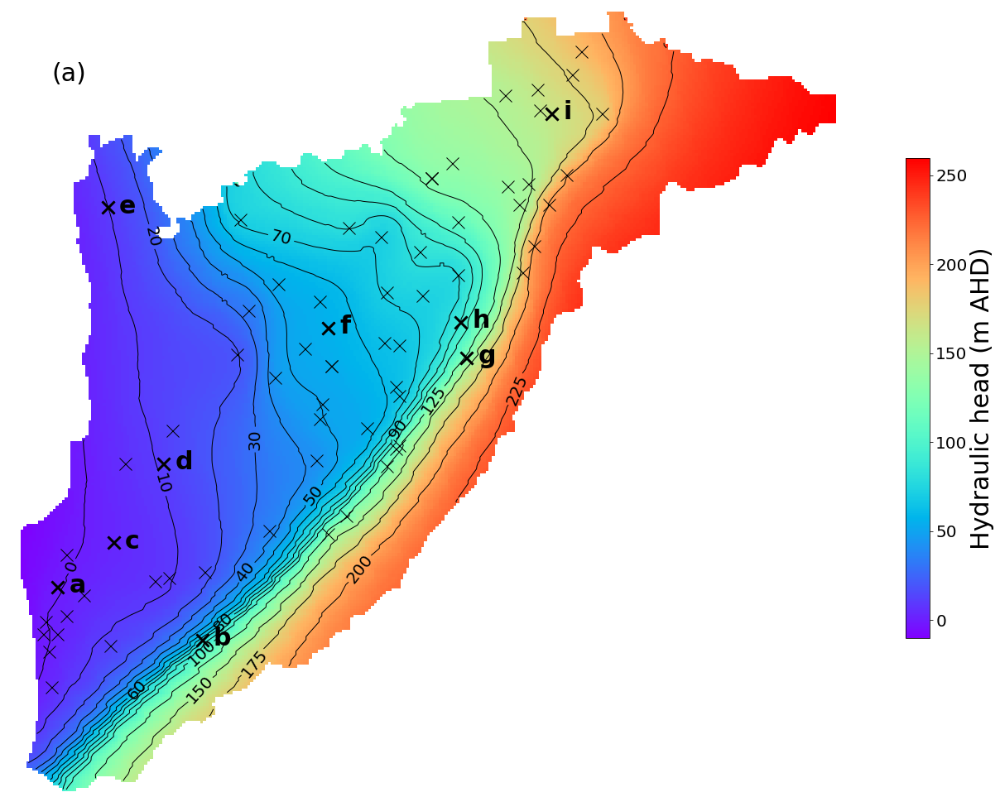

In [19]:
plt.figure(figsize=(20,20))

axes=plt.subplot(111, frameon=False)

m = plt.imshow(mean_array, cmap=wt_cmap)
cs = plt.contour(mean_array, levels=survey_levels, colors="k", linewidths=1)
plt.clabel(cs, inline=1, fontsize=20, fmt='%1i', colors="k")
cb = plt.colorbar(m, fraction=0.026, pad=0.06)

axes.get_xaxis().set_visible(False)
axes.get_yaxis().set_visible(False)

for t in cb.ax.get_yticklabels():
     t.set_fontsize(20)
        
cb.set_label("Hydraulic head (m AHD)", fontsize=30)

ms=15

for i in range(len(df_well_ixs)):
    y = df_well_ixs.iloc[i,3]
    x = df_well_ixs.iloc[i,4]
    letter = df_well_ixs.iloc[i,5]
    plt.plot(x,y,'x',c='k', markersize=ms, label='_nolegend_')
    if letter in letters:
        plt.text(x+4,y+2,letter, fontsize=30, fontweight='bold',c="k")
        plt.plot(x,y,'x',c='k', markersize=ms, markeredgewidth=3, label='_nolegend_')
        
plt.text(15,25, "(a)", fontsize=30)

nm = os.path.join(figure_directory, "mean_raster")
plt.savefig(nm, dpi=300)

In [20]:
levels_std=np.arange(0,90,10)
print(levels_std)

[ 0 10 20 30 40 50 60 70 80]


In [21]:
figure_directory

'C:\\Users\\mar886\\WaterTableProject\\Willunga\\willunga_wt\\figures\\paper'

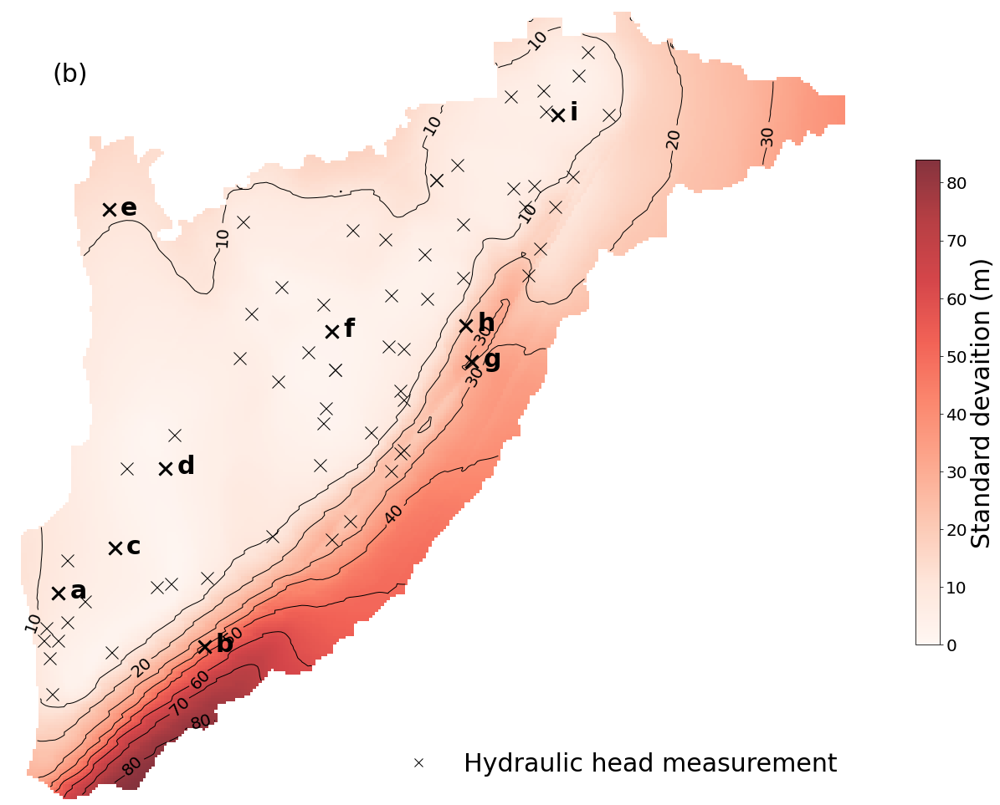

In [22]:
plt.figure(figsize=(20,20))

axes=plt.subplot(111, frameon=False)

m = plt.imshow(std_array, cmap='Reds', alpha=0.8)
cs = plt.contour(std_array, levels=levels_std, colors="k", linewidths=1)
plt.clabel(cs, inline=1, fontsize=20, fmt='%1i', colors="k")
cb = plt.colorbar(m, fraction=0.026, pad=0.06)

axes.get_xaxis().set_visible(False)
axes.get_yaxis().set_visible(False)

for t in cb.ax.get_yticklabels():
     t.set_fontsize(20)
        
cb.set_label("Standard devaition (m)", fontsize=30)

for i in range(len(df_well_ixs)):
    y = df_well_ixs.iloc[i,3]
    x = df_well_ixs.iloc[i,4]
    letter = df_well_ixs.iloc[i,5]
    plt.plot(x,y,'x',c='k', markersize=ms, label='_nolegend_')
    if letter in letters:
        plt.text(x+4,y+2,letter, fontsize=30, fontweight='bold',c="k")
        plt.plot(x,y,'x',c='k', markersize=ms, markeredgewidth=3, label='_nolegend_')
    
#axes.plot(x,y, "kx", alpha=1, markersize=10, label="Hydraulic head measurement")    
#plt.legend(frameon=False, fontsize=18, loc=4)

plt.text(15,25, "(b)", fontsize=30)

axes.plot(x,y, "kx", alpha=1, markersize=10, label="Hydraulic head measurement")    

plt.legend(frameon=False, fontsize=30, loc=4)

nm = os.path.join(figure_directory, "std_raster")
plt.savefig(nm, dpi=300)

# Coefficient of variation plot, same as std above

In [23]:
levels_coeff=np.arange(0,0.35,.05)
print(levels_std)

[ 0 10 20 30 40 50 60 70 80]


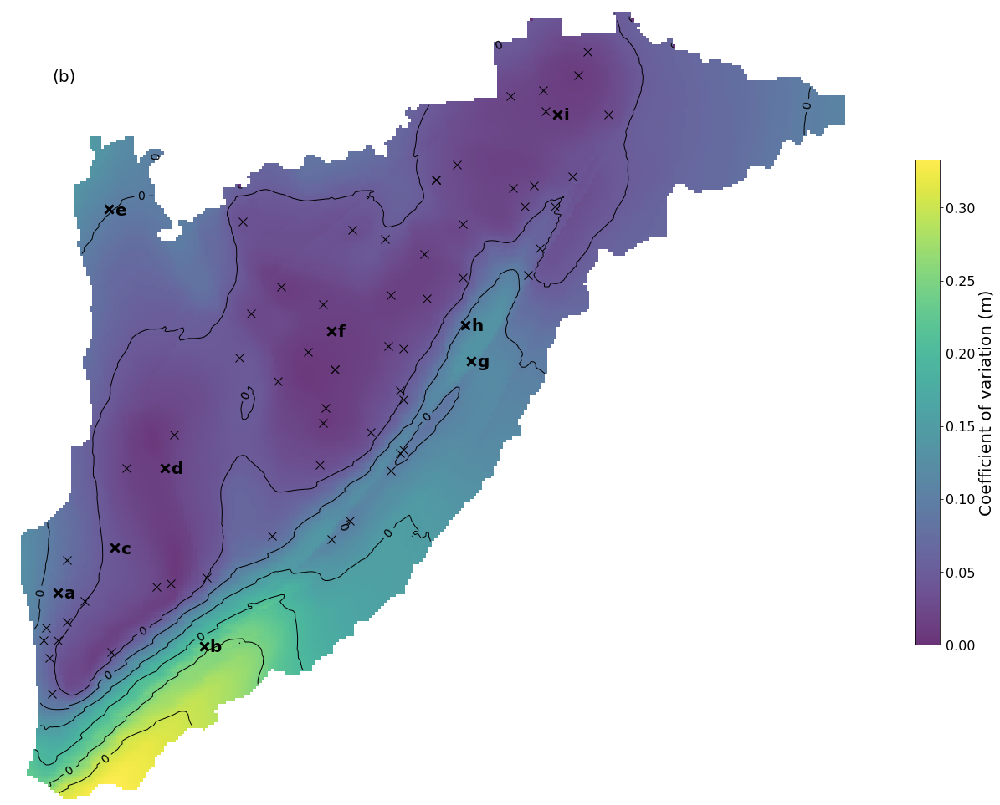

In [24]:
rstr_to_show = coeff_of_var

plt.figure(figsize=(20,20))

axes=plt.subplot(111, frameon=False)

m = plt.imshow(rstr_to_show, cmap='viridis', alpha=0.8)
cs = plt.contour(rstr_to_show, levels=levels_coeff, colors="k", linewidths=1)
plt.clabel(cs, inline=1, fontsize=14, fmt='%1i', colors="k")
cb = plt.colorbar(m, fraction=0.026, pad=0.06)

axes.get_xaxis().set_visible(False)
axes.get_yaxis().set_visible(False)

for t in cb.ax.get_yticklabels():
     t.set_fontsize(16)
        
cb.set_label("Coefficient of variation (m)", fontsize=20)

for i in range(len(df_well_ixs)):
    y = df_well_ixs.iloc[i,3]
    x = df_well_ixs.iloc[i,4]
    letter = df_well_ixs.iloc[i,5]
    plt.plot(x,y,'x',c='k', markersize=10, label='_nolegend_')
    if letter in letters:
        plt.text(x+2,y+2,letter, fontsize=20, fontweight='bold',c="k")
        plt.plot(x,y,'x',c='k', markersize=10, markeredgewidth=3,label='_nolegend_')
    
#axes.plot(x,y, "kx", alpha=1, markersize=10, label="Hydraulic head measurement")    
#plt.legend(frameon=False, fontsize=18, loc=4)

plt.text(15,25, "(b)", fontsize=20)

nm = os.path.join(figure_directory, "coef_of_var")
plt.savefig(nm, dpi=300)

# Pull in shapefiles

In [25]:
wt_contour_shp_fldr = r'C:\Users\mar886\WaterTableProject\Willunga\willunga_wt\output_data\wt_drawn_contours'

nm = 'ref_001_contours.shp'
contours_shp = gpd.read_file(os.path.join(wt_contour_shp_fldr,nm))

In [26]:
names_list[0][:-4]

'001'

In [27]:
contour_shp_name_list = []
contour_shps_list = []

for i in range(len(names_list)):
    nm = "ref_%s_contours.shp"%names_list[i][:-4]
    contour_shp_name_list.append(nm)
    contours_shp = gpd.read_file(os.path.join(wt_contour_shp_fldr,nm))
    contour_shps_list.append(contours_shp)

print(len(names_list))

print(len(contour_shps_list))

63
63


In [28]:
#Rename ref_030_contours.shp --> issue with contour column name
contour_shps_list[18]=contour_shps_list[18].rename(columns={"Contours_m":"Contour_m"})

#Rename ref_045_contours.shp --> issue with contour column name

contour_shps_list[27]=contour_shps_list[27].rename(columns={"Contours_m":"Contour_m"})

#contour_shps_list[17]

In [29]:
#Rename ref_047_contours.shp --> issue with contour column name

contour_shps_list[28]=contour_shps_list[28].rename(columns={"contour_m":"Contour_m"})

#Rename ref_048_contours.shp --> issue with contour column name

contour_shps_list[29]=contour_shps_list[29].rename(columns={"contour_m":"Contour_m"})

#Rename ref_050_contours.shp --> issue with contour column name

contour_shps_list[31]=contour_shps_list[31].rename(columns={"contours_m":"Contour_m"})

#Rename ref_AAA3_contours.shp --> issue with contour column name

contour_shps_list[32]=contour_shps_list[32].rename(columns={"Contours_m":"Contour_m"})

#Rename ref_AGC_011_contours.shp --> issue with contour column name

contour_shps_list[34]=contour_shps_list[34].rename(columns={"contour_m":"Contour_m"})

#Rename ref_BARD_contours.shp --> issue with contour column name

contour_shps_list[39]=contour_shps_list[39].rename(columns={"Contours_m":"Contour_m"})

#Rename ref_C01_contours.shp --> issue with contour column name

contour_shps_list[41]=contour_shps_list[41].rename(columns={"contour_m":"Contour_m"})

#Rename ref_GH01_contours.shp --> issue with contour column name

contour_shps_list[48]=contour_shps_list[48].rename(columns={"contours_m":"Contour_m"})

#Rename ref_RS01_contours.shp --> issue with contour column name

contour_shps_list[55]=contour_shps_list[55].rename(columns={"contours_m":"Contour_m"})

#Rename ref_SJ01_contours.shp --> issue with contour column name

contour_shps_list[56]=contour_shps_list[56].rename(columns={"Contours_m":"Contour_m"})

In [30]:
#Rename ref_UWA_003_contours.shp --> issue with contour column name

contour_shps_list[60]=contour_shps_list[60].rename(columns={"Contours_m":"Contour_m"})

## Pull in shapefile of study area

In [31]:
study_extent_path = os.path.join(r'C:\Users\mar886\WaterTableProject\Willunga\hand_output_rasters\study_extent', 'study_extent.shp')
study_area_shp = gpd.read_file(study_extent_path)

## Plot individual contours, how simiar/different were they from one another

In [32]:
print(i)
print(contour_shp_name_list[i])
print(contour_shps_list[i].columns)


62
ref_XZ01_contours.shp
Index(['Contour_m', 'geometry'], dtype='object')


In [33]:
vl=8

survey_levels_1 = survey_levels[1:-1]

for vl in range(len(survey_levels_1)):
    print("number: %i"%vl)

    plt.figure(figsize=(10,10))

    ax1=plt.subplot(111)
    study_area_shp.exterior.plot(ax=ax1, color="k", label="Study area")

    colour = cm.cool_r(np.linspace(0, 1, 40))
    contour_v = survey_levels_1[vl]


    for i in range(len(contour_shps_list)):
        #print(contour_shp_name_list[i])
        #print("i:%i"%i)
        c = 'k'#colour[i]
        contour_shps_list[i][contour_shps_list[i]["Contour_m"]==contour_v].plot(ax=ax1, color=c, label="Contours")

    nm = os.path.join(r'C:\Users\mar886\WaterTableProject\Willunga\willunga_wt\figures\Individual_contour_comparison',
                     "contour_value_%i"%contour_v)

    plt.savefig(nm, dpi=300)
    plt.close()
    

number: 0


C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anac

number: 1


C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anac

number: 2


C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anac

number: 3


C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anac

number: 4


C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anac

number: 5


C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anac

number: 6


C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anac

number: 7


C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anac

number: 8


C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anac

number: 9


C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anac

number: 10


C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anac

number: 11


C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anac

number: 12


C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anac

number: 13


C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anac

## Plot the same thing but as an single figure

In [34]:
len(contour_shps_list)

63

C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anac

C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anac

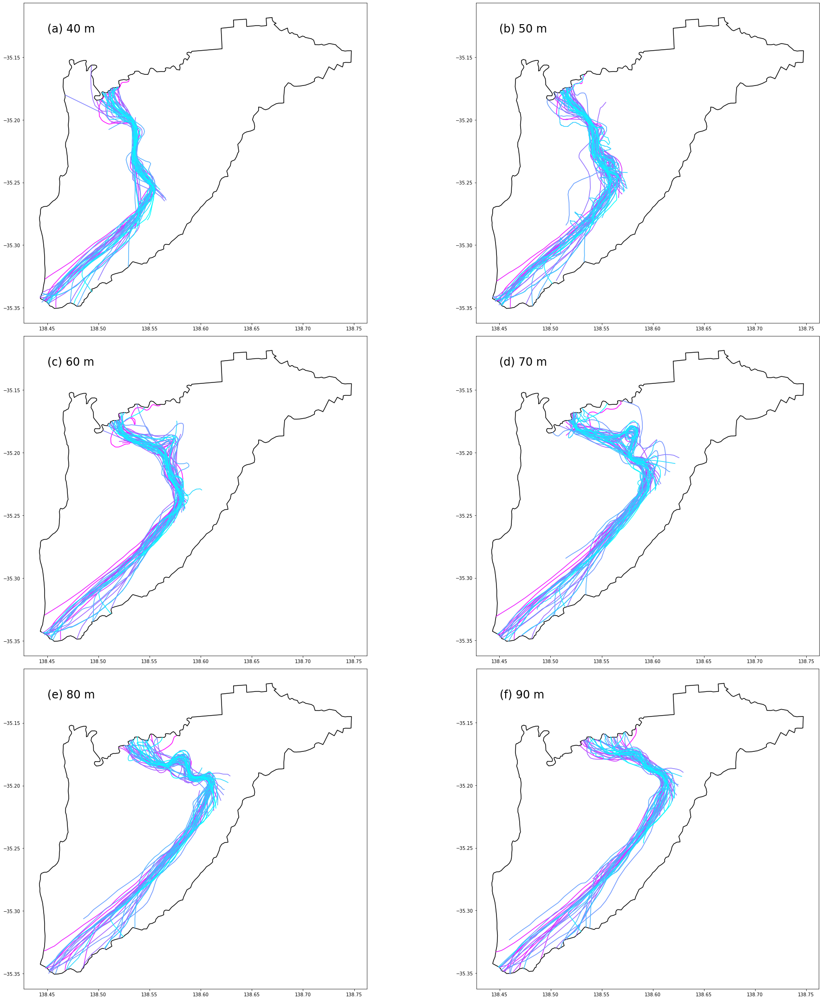

In [35]:
vl=8
survey_levels_1 = [40, 50, 60, 70, 80, 90]

captions = ["(a) 40 m", "(b) 50 m", "(c) 60 m", "(d) 70 m", "(e) 80 m", "(f) 90 m"]

fig = plt.figure(figsize=(30,30))

for vl in range(len(survey_levels_1)):

    ax1=fig.add_subplot(3,2,(vl+1))
    study_area_shp.exterior.plot(ax=ax1, color="k", label="Study area")

    colour = cm.cool_r(np.linspace(0, 1, len(contour_shps_list)))
    contour_v = survey_levels_1[vl]

    for i in range(len(contour_shps_list)):
        #print(contour_shp_name_list[i])
        #print("i:%i"%i)
        c = colour[i]
        contour_shps_list[i][contour_shps_list[i]["Contour_m"]==contour_v].plot(ax=ax1, color=c, label="Contours")
        
    plt.text(138.45,-35.13,captions[vl], fontsize=24)

plt.tight_layout()
nm = os.path.join(r'C:\Users\mar886\WaterTableProject\Willunga\willunga_wt\figures\Individual_contour_comparison',
                     "some_contours")

plt.savefig(nm, dpi=300)

# Plot just the 80m contour

C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\mar886\Anac

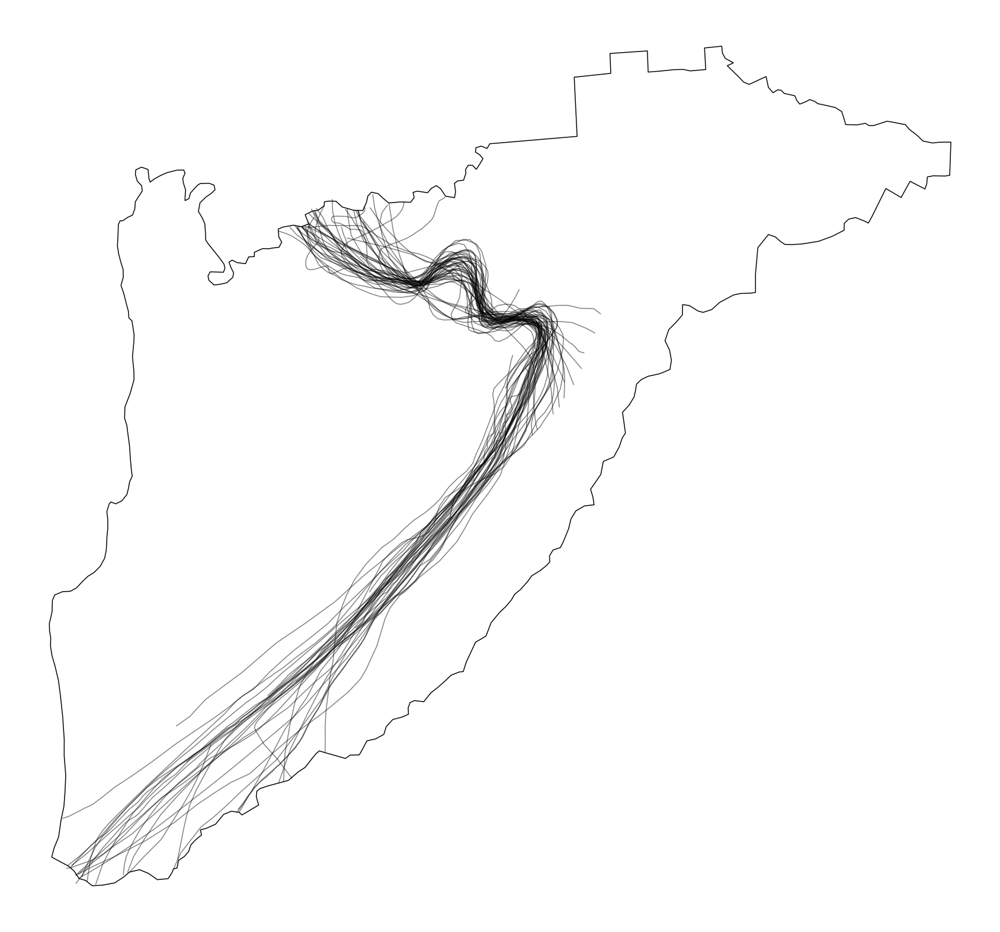

In [36]:
fig = plt.figure(figsize=(30,30), frameon=False)

ax1=fig.add_subplot(1,1,1)

study_area_shp.exterior.plot(ax=ax1, color="k", label="Study area")

contour_v = 80


for i in range(len(contour_shps_list)):
    #print(contour_shp_name_list[i])
    #print("i:%i"%i)
    c = "k"
    contour_shps_list[i][contour_shps_list[i]["Contour_m"]==contour_v].plot(ax=ax1, color=c, label="Contours", alpha=0.5)

ax=plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

ax.get_xaxis().set_ticks([])
ax.get_yaxis().set_ticks([])
    
nm = os.path.join(r'C:\Users\mar886\WaterTableProject\Willunga\willunga_wt\figures\paper',
                     "80m_contours")

plt.savefig(nm, dpi=300)

# Plot regions of the figure to show variation

This figure is not very effective - the indiviual contours look better

In [37]:
for i in range(len(contour_shps_list)):

    print(i)
    print(contour_shp_name_list[i])
    print(contour_shps_list[i].columns)

0
ref_001_contours.shp
Index(['SHAPE_Leng', 'Contour_m', 'geometry'], dtype='object')
1
ref_002_contours.shp
Index(['SHAPE_Leng', 'Contour_m', 'geometry'], dtype='object')
2
ref_003_contours.shp
Index(['Contour_m', 'SHAPE_Leng', 'geometry'], dtype='object')
3
ref_004_contours.shp
Index(['Contour_m', 'SHAPE_Leng', 'Contour_m_', 'geometry'], dtype='object')
4
ref_005_contours.shp
Index(['Contour_m', 'SHAPE_Leng', 'Contour_m_', 'geometry'], dtype='object')
5
ref_008_contours.shp
Index(['Contour_m', 'SHAPE_Leng', 'geometry'], dtype='object')
6
ref_009_contours.shp
Index(['Contour_m', 'SHAPE_Leng', 'geometry'], dtype='object')
7
ref_012_contours.shp
Index(['Contour_m', 'SHAPE_Leng', 'Contour_m_', 'geometry'], dtype='object')
8
ref_012b_contours.shp
Index(['Contour_m', 'SHAPE_Leng', 'geometry'], dtype='object')
9
ref_014_contours.shp
Index(['Contour_m', 'SHAPE_Leng', 'geometry'], dtype='object')
10
ref_016_contours.shp
Index(['Contour_m', 'SHAPE_Leng', 'Contour_m_', 'geometry'], dtype='objec

(-35.23, -35.13)

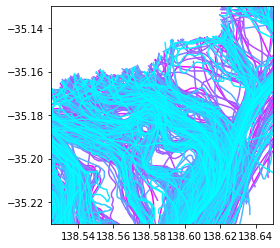

In [38]:
plt.figure()
ax1=plt.subplot(111)

colour = cm.cool_r(np.linspace(0, 1, len(contour_shps_list)))

for i in range(len(contour_shps_list)):
        #print(contour_shp_name_list[i])
        #print("i:%i"%i)
        c = colour[i]
        contour_shps_list[i].plot(ax=ax1, color=c, label="Contours")
        
plt.xlim([138.525, 138.65])
plt.ylim([-35.23, -35.13])
#ax1.invert_yaxis()

# TO DO: MAKE PLOT SHOWING SOME KEY TYPES - WHOLE MAPS

In [39]:
# Maps to include in a potential figure 
figslist = ["002" ,"012", "014", "026", "032", "033", "034", "R01"]

In [40]:
ix = 0
figs_ix = []
for i in range(len(names_list)):
    print(ix)
    nm = names_list[i][:-4]
    if nm in figslist:
        print(nm)
        figs_ix.append(ix)
    ix += 1
    
#print(figs_ix)


0
1
002
2
3
4
5
6
7
012
8
9
014
10
11
12
13
14
15
026
16
17
18
19
20
032
21
033
22
034
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
R01
54
55
56
57
58
59
60
61
62


In [41]:
from matplotlib import gridspec
gs = gridspec.GridSpec(2, 2, figure = fig,
                       wspace=0.1, hspace=0.1,
                       width_ratios=[1, 1], height_ratios=[1, 1]) 

In [42]:
gs[3]

GridSpec(2, 2)[1:2, 1:2]

In [43]:
print(names_list.index("001.out"))

0


In [44]:
#names_list

In [45]:
# Interesting maps
maps_intr = ["001", "R01", "026", "SJ01"]

print(names_list.index("001.out"))
print(names_list.index("R01.out"))
print(names_list.index("026.out"))
print(names_list.index("SJ01.out"))

#Others - UWA_01, 002, 032, AGC_015

0
53
15
56


In [46]:
interesting_ixs = [0,53,15,56]


<Figure size 2160x2160 with 0 Axes>

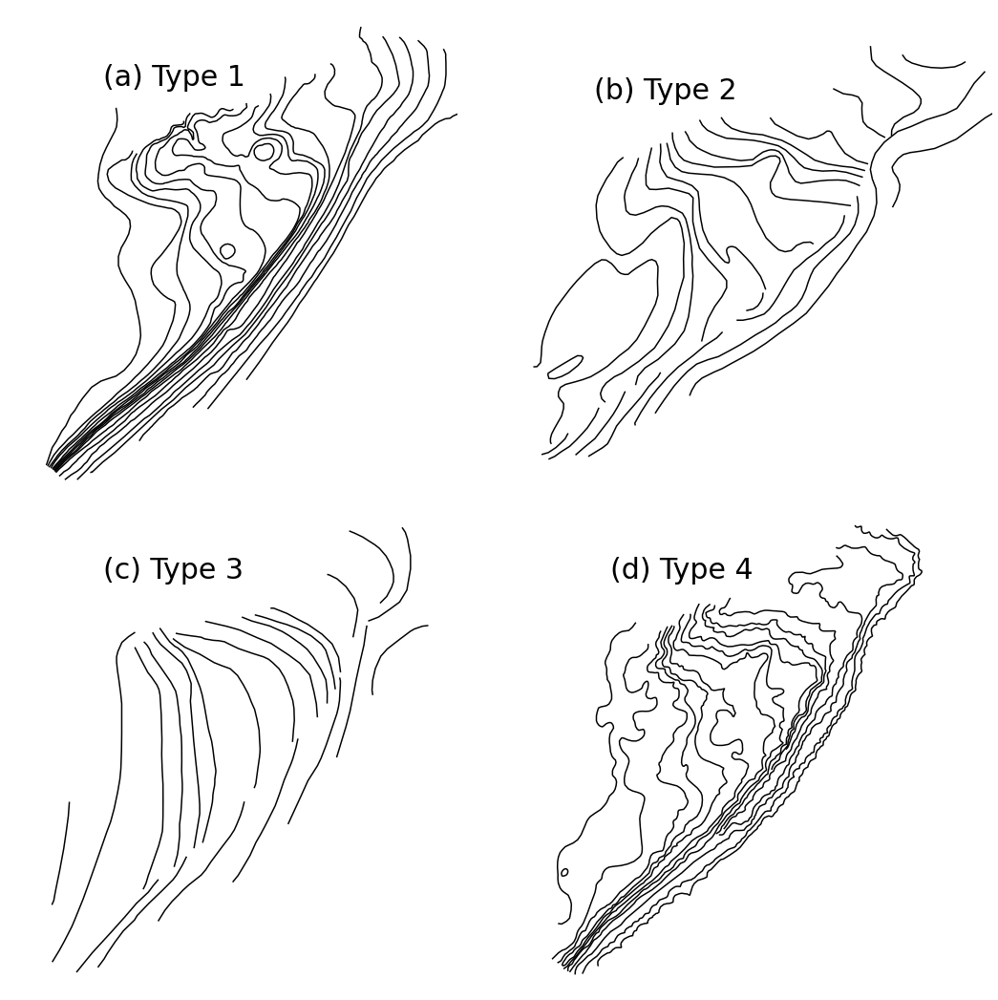

In [47]:
# Indexes of some interesting plots [1, 7, 9, 15, 19, 20, 21, 36]
fig = plt.figure(figsize=(30,30))
c = "k" # colour[i]
xlims = [138.42, 138.7]
ylims = [-35.36, -35.11]
visibility = False
letx = 138.48
lety = -35.15
letfs = 30

# Using a colorbar to make the colours
colour = cm.cool_r(np.linspace(0, 1, 40))

#fig, axes = plt.subplots(2,2, figsize=(20,20))



fig = plt.figure(figsize=(19,19), frameon=False)

gs = gridspec.GridSpec(2, 2, figure = fig,
                       wspace=0.001, hspace=0.001,
                       width_ratios=[1, 1], height_ratios=[1, 1]) 

# First plot - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -

i = interesting_ixs[0]#1#9
ax = plt.subplot(gs[0])        #axes[0][0]
contour_shps_list[i].plot(ax=ax, color=c, label="Contours")

ax.get_xaxis().set_visible(visibility)
ax.get_yaxis().set_visible(visibility)

plt.xlim(xlims)
plt.ylim(ylims)

plt.text(letx, lety, "(a) Type 1", fontsize=letfs)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

# Second plot - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -

i = interesting_ixs[1] #20
ax = plt.subplot(gs[1])   #axes[0][1]
contour_shps_list[i].plot(ax=ax, color=c, label="Contours")

ax.get_xaxis().set_visible(visibility)
ax.get_yaxis().set_visible(visibility)

plt.xlim(xlims)
plt.ylim(ylims)

plt.text(letx, lety, "(b) Type 2", fontsize=letfs)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

# Third plot - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -

i = interesting_ixs[2] #15
ax = plt.subplot(gs[2])   #axes[1][0]
contour_shps_list[i].plot(ax=ax, color=c, label="Contours")

ax.get_xaxis().set_visible(visibility)
ax.get_yaxis().set_visible(visibility)

plt.xlim(xlims)
plt.ylim(ylims)

plt.text(letx, lety, "(c) Type 3", fontsize=letfs)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)


# Fourth plot - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -

i = interesting_ixs[3] #36
ax = plt.subplot(gs[3])   #axes[1][1]
contour_shps_list[i].plot(ax=ax, color=c, label="Contours")

ax.get_xaxis().set_visible(visibility)
ax.get_yaxis().set_visible(visibility)

plt.xlim(xlims)
plt.ylim(ylims)

plt.text(letx, lety, "(d) Type 4", fontsize=letfs)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)


# Formatting on the whole figure = = = = = = = = = = = = = = = = = = = = =
#plt.tight_layout()
#fig.subplots_adjust(hspace=.1, wspace=0.0)

fignm = os.path.join(r'C:\Users\mar886\WaterTableProject\Willunga\willunga_wt\figures\paper', 'types')
plt.savefig(fignm, dpi=600)

# Get values at well indexes - CALIBRATE

In [48]:
a = df_well_ixs['letter'].unique()
print(type(a[0]))

<class 'float'>


In [49]:
# Data frame of values without letters
df_well_ixs_c = df_well_ixs[df_well_ixs['letter'].isna()]
df_well_ixs_c = df_well_ixs_c.copy()
df_well_ixs_c.index = df_well_ixs_c.DHNO

In [50]:
print(len(df_well_ixs_c))
print(len(df_well_ixs))

62
71


In [51]:
df_well_ixs_c.head()

,DHNO,rswl,well_ix,well_ix_x,well_ix_y,letter
DHNO,,,,,,
26558,26558,4.09,"(186, 20)",186,20,NaN
26565,26565,4.33,"(155, 40)",155,40,NaN
26585,26585,18.22,"(144, 56)",144,56,NaN
27050,27050,5.54,"(195, 50)",195,50,NaN
27063,27063,15.90,"(217, 35)",217,35,NaN


In [52]:
arrays_list[i][50,50]
print(i)

56


In [53]:
calibrated_h_list = []
ar_name_list = []

for ar_i in range(len(arrays_list)):
        
    wt_ar = arrays_list[ar_i]
    nm = names_list[ar_i][:-4]
    well_hds = []

    plt.figure(figsize=(30,30))
    plt.imshow(wt_ar, cmap='rainbow')
    plt.colorbar()

    for ix in range(len(df_well_ixs_c)):
        xi = df_well_ixs_c.iloc[ix,3]
        yi = df_well_ixs_c.iloc[ix,4]
        h = wt_ar[xi, yi]
        plt.plot(yi,xi,"kx", markersize=10)
        plt.text(yi,xi,"%2.1f"%h, fontsize=15)

        well_hds.append(h)

    #print(well_hds)
    #plt.savefig(os.path.join(r'C:\Users\mar886\WaterTableProject\Willunga\willunga_wt\figures\rasters_with_wellvalues',
     #                       nm), dpi=300)
    plt.close()
    calibrated_h_list.append(well_hds)
    df_well_ixs_c[nm] = well_hds
    
    ar_name_list.append(nm)

In [54]:
df_well_ixs_c.columns

df_well_ixs_c['n'] = df_well_ixs_c[ar_name_list].count(axis=1)
df_well_ixs_c['mean'] = df_well_ixs_c[ar_name_list].mean(axis=1)
#df_well_ixs_c['sq_mean'] = df_well_ixs_c[ar_name_list].mean(axis=1)**2
#df_well_ixs_c['norm_mean'] = df_well_ixs_c[ar_name_list].mean(axis=1)/df_well_ixs_c['rswl']
#df_well_ixs_c['sq_norm_mean'] = df_well_ixs_c[ar_name_list].mean(axis=1)**2/df_well_ixs_c['rswl']**2


df_well_ixs_c['25th'] = df_well_ixs_c[ar_name_list].quantile(q=0.25,axis=1)
df_well_ixs_c['75th'] = df_well_ixs_c[ar_name_list].quantile(q=0.75,axis=1)

datanm = os.path.join(r'C:\Users\mar886\WaterTableProject\Willunga\willunga_wt\output_data',
                      "df_well_ixs_c.csv")
                      
df_well_ixs_c.to_csv(datanm)

# Plot difference between mean estimated value and rswl at "calibration" wells

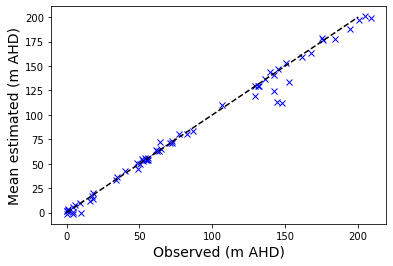

In [55]:
plt.plot(df_well_ixs_c['rswl'], df_well_ixs_c['mean'], "bx")
plt.xlabel("Observed (m AHD)", fontsize=14)
plt.ylabel("Mean estimated (m AHD)", fontsize=14)
plt.plot([0,200],[0,200], c="k", ls="--")

plt.savefig(os.path.join(r'C:\Users\mar886\WaterTableProject\Willunga\willunga_wt\figures\paper',
                         "calibrated_obs_vs_est"))

# Calculate residuals

In [56]:
df_well_ixs_c.head()

,DHNO,rswl,well_ix,well_ix_x,well_ix_y,letter,001,002,003,004,...,TV_001,UWA_001,UWA_002,UWA_003,U_1949,XZ01,n,mean,25th,75th
DHNO,,,,,,,,,,,,,,,,,,,,,
26558,26558,4.09,"(186, 20)",186,20,NaN,-20.203262,-18.057812,-7.563098,2.955072,...,-12.859505,-4.753154,4.810652,-1.033586,NaN,2.915760,54,-1.157317,-5.521735,4.638394
26565,26565,4.33,"(155, 40)",155,40,NaN,1.742489,0.965118,4.902679,5.247573,...,6.203080,7.237988,6.859198,5.867774,7.563270,5.884896,59,6.055026,4.999494,7.635187
26585,26585,18.22,"(144, 56)",144,56,NaN,14.311897,15.319687,17.065609,13.750219,...,14.805145,16.301102,14.499062,17.881145,12.944971,14.203263,63,13.722613,12.027284,15.145957
27050,27050,5.54,"(195, 50)",195,50,NaN,6.538256,2.622898,9.101677,8.543658,...,7.044753,4.647388,10.830378,8.051178,8.941176,9.044769,63,8.160018,7.991015,9.369665
27063,27063,15.90,"(217, 35)",217,35,NaN,10.516420,12.784949,11.679647,12.474450,...,11.397835,5.938598,13.846466,11.660877,10.242346,10.026504,62,12.297091,10.691167,13.359565


In [57]:
df_residuals = pd.DataFrame()
df_sq_residuals = pd.DataFrame()

for ar_i in range(len(ar_name_list)):
    
    nm = ar_name_list[ar_i]
    
    #print(nm)
    
    resid_column = []
    sq_resid_column = []
    
    for well_i in range(len(df_well_ixs_c)):
        rswl = df_well_ixs_c.loc[df_well_ixs_c.index[well_i], 'rswl']
        h_est = df_well_ixs_c.loc[df_well_ixs_c.index[well_i], nm]
        resid_column.append(h_est - rswl)
        sq_resid_column.append((h_est - rswl)**2)
        
    df_residuals[nm] = resid_column
    df_sq_residuals[nm] = sq_resid_column


In [58]:
df_residuals.head()

,001,002,003,004,005,008,009,012,012b,014,...,R01,R051,RS01,SJ01,TV_001,UWA_001,UWA_002,UWA_003,U_1949,XZ01
0,-24.293262,-22.147812,-11.653098,-1.134928,-13.727142,-5.352213,4.905111,-3.535181,NaN,-20.796440,...,3.015227,-1.958449,NaN,0.525174,-16.949505,-8.843154,0.720652,-5.123586,NaN,-1.174240
1,-2.587511,-3.364882,0.572679,0.917573,-4.831065,1.637878,4.542720,2.357495,NaN,-2.490521,...,3.720916,1.559466,2.251695,0.314110,1.873080,2.907988,2.529198,1.537774,3.233270,1.554896
2,-3.908103,-2.900313,-1.154391,-4.469781,-3.127524,-7.351429,-7.892585,-1.727881,-2.471982,-3.526679,...,-6.212296,-7.544464,-4.563859,-4.151810,-3.414855,-1.918898,-3.720938,-0.338855,-5.275029,-4.016737
3,0.998256,-2.917102,3.561677,3.003658,3.060751,-0.518589,4.004954,0.948711,3.879268,3.138637,...,2.739493,3.224072,2.702831,3.374801,1.504753,-0.892612,5.290378,2.511178,3.401176,3.504769
4,-5.383580,-3.115051,-4.220353,-3.425550,-2.113707,-2.055099,-3.967429,-14.321672,NaN,-4.517824,...,-3.829355,-5.108832,-0.036927,-4.587687,-4.502165,-9.961402,-2.053534,-4.239123,-5.657654,-5.873496


In [59]:
df_residuals.index = df_well_ixs_c.index
df_residuals.head()
df_sq_residuals.index = df_well_ixs_c.index

df_sq_residuals.head()

,001,002,003,004,005,008,009,012,012b,014,...,R01,R051,RS01,SJ01,TV_001,UWA_001,UWA_002,UWA_003,U_1949,XZ01
DHNO,,,,,,,,,,,,,,,,,,,,,
26558,590.162595,490.525565,135.794692,1.288061,188.434432,28.646189,24.060109,12.497507,NaN,432.491916,...,9.091591,3.835523,NaN,0.275808,287.285710,78.201369,0.519339,26.251134,NaN,1.378841
26565,6.695211,11.322433,0.327962,0.841941,23.339193,2.682645,20.636303,5.557784,NaN,6.202693,...,13.845214,2.431935,5.070129,0.098665,3.508429,8.456394,6.396841,2.364749,10.454032,2.417702
26585,15.273267,8.411816,1.332619,19.978939,9.781407,54.043504,62.292891,2.985573,6.110694,12.437463,...,38.592624,56.918935,20.828806,17.237529,11.661233,3.682171,13.845383,0.114822,27.825930,16.134174
27050,0.996514,8.509483,12.685543,9.021963,9.368196,0.268935,16.039659,0.900053,15.048718,9.851039,...,7.504824,10.394643,7.305297,11.389279,2.264280,0.796757,27.988095,6.306015,11.568001,12.283408
27063,28.982930,9.703541,17.811376,11.734392,4.467757,4.223432,15.740490,205.110295,NaN,20.410730,...,14.663957,26.100162,0.001364,21.046871,20.269492,99.229527,4.217002,17.970162,32.009051,34.497960


In [60]:
len(ar_name_list)

63

In [61]:
df_residuals[ar_name_list].mean(axis=1)

DHNO
26558    -5.247317
26565     1.725026
26585    -4.497387
27050     2.620018
27063    -3.602909
            ...   
196608   -9.660492
196609   -6.405909
200676   -2.187785
200677   -2.547785
200678    0.312215
Length: 62, dtype: float64

In [62]:
# Residuals - - -
df_residuals['n'] = df_residuals[ar_name_list].count(axis=1)
df_residuals['mean'] = df_residuals[ar_name_list].mean(axis=1)
df_residuals['median'] = df_residuals[ar_name_list].median(axis=1)
df_residuals['sq_mean'] = df_residuals[ar_name_list].mean(axis=1)**2
df_residuals['norm_mean'] = df_residuals[ar_name_list].mean(axis=1)/df_well_ixs_c['rswl']
df_residuals['sq_norm_mean'] = df_residuals[ar_name_list].mean(axis=1)**2/df_well_ixs_c['rswl']**2
df_residuals['rt_sq_mean'] = np.sqrt(df_residuals[ar_name_list].mean(axis=1)**2)


df_residuals['25th'] = df_residuals[ar_name_list].quantile(q=0.25,axis=1)
df_residuals['75th'] = df_residuals[ar_name_list].quantile(q=0.75,axis=1)

# Squared residuals - - - 
df_sq_residuals['n'] = df_sq_residuals[ar_name_list].count(axis=1)
df_sq_residuals['mean'] = df_sq_residuals[ar_name_list].mean(axis=1)
df_sq_residuals['sq_mean'] = df_sq_residuals[ar_name_list].mean(axis=1)**2
df_sq_residuals['norm_mean'] = df_sq_residuals[ar_name_list].mean(axis=1)/df_well_ixs_c['rswl']
df_sq_residuals['sq_norm_mean'] = df_sq_residuals[ar_name_list].mean(axis=1)**2/df_well_ixs_c['rswl']**2
df_sq_residuals['root_sq_norm_mean'] = np.sqrt(df_sq_residuals['sq_norm_mean'])

df_sq_residuals['25th'] = df_sq_residuals[ar_name_list].quantile(q=0.25,axis=1)
df_sq_residuals['75th'] = df_sq_residuals[ar_name_list].quantile(q=0.75,axis=1)

# Plot mean residuals

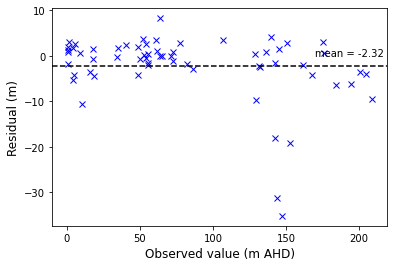

In [63]:
plt.plot(df_well_ixs_c['rswl'], df_residuals['mean'], "bx")

mean_r = df_residuals['mean'].mean()

plt.axhline(y=mean_r, ls="--", color="k")
plt.xlabel("Observed value (m AHD)", fontsize=12)
plt.ylabel("Residual (m)", fontsize=12)
plt.text(170, 0, "mean = %2.2f" %mean_r)

plt.savefig(os.path.join(r'C:\Users\mar886\WaterTableProject\Willunga\willunga_wt\figures\paper',
                         "residuals"), dpi=300)

## Histograms of residuals per bore

In [64]:
i = 0 # Index
    
df = df_residuals[ar_name_list].transpose()

for i in range(len(df_residuals)):
    plt.figure()
    df[df_residuals.index[i]].hist(label="Bore ID: %s"%df_residuals.index[i], color="0.5", bins=20)

    plt.axvline(df_residuals.loc[df_residuals.index[i], "mean"], ls="--", c="k", label="mean")
    plt.axvline(df_residuals.loc[df_residuals.index[i], "median"], ls="--", c="g", label="median")
    plt.axvline(df_residuals.loc[df_residuals.index[i], "25th"], ls="--", c="m", label="25th to 75th")
    plt.axvline(df_residuals.loc[df_residuals.index[i], "75th"], ls="--", c="m")

    plt.legend()

    fignm = os.path.join(r'C:\Users\mar886\WaterTableProject\Willunga\willunga_wt\figures\residuals_per_map',
                         df_residuals.index[i])
    
    plt.savefig(fignm, dpi=300)
    plt.close()

## Plot mean residuals but with the range for each point
## Plot as boxplots


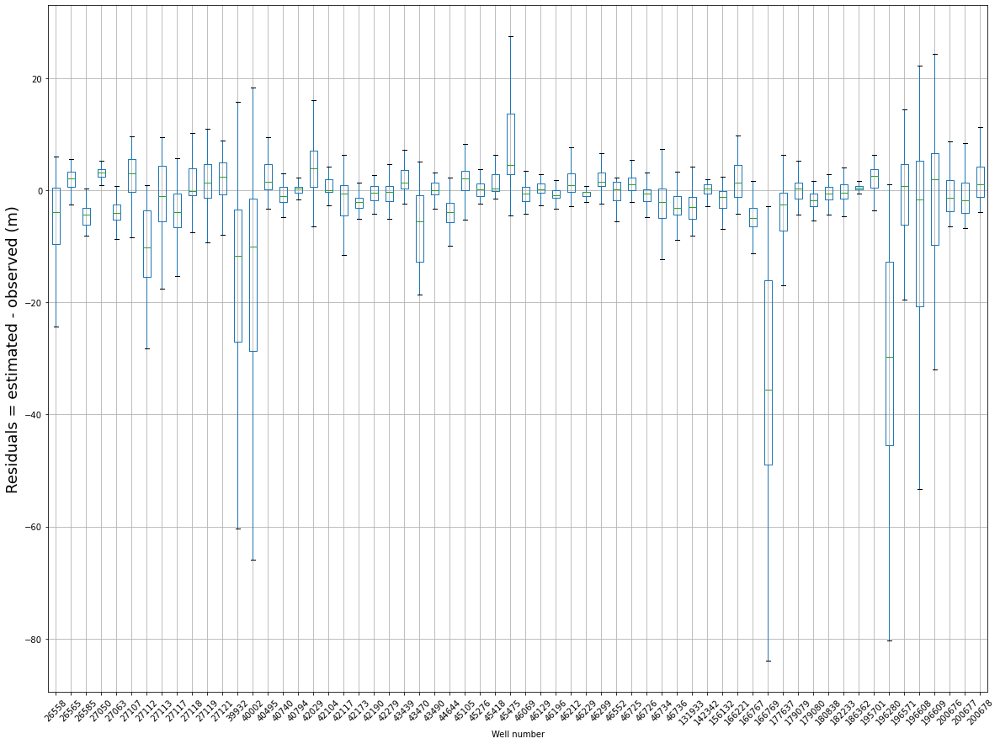

In [65]:
plt.figure(figsize=(20,15))
df_residuals[ar_name_list].transpose().boxplot(rot=45, showfliers=False)
plt.xlabel("Well number")
plt.ylabel("Residuals = estimated - observed (m)", fontsize=18)
plt.savefig(os.path.join(r'C:\Users\mar886\WaterTableProject\Willunga\willunga_wt\figures\paper',
                         "resid_well_bplot"), dpi=300)



# Here ix = rswl, could change to using df_residuals.loc[ix, 'rswl'] if not (or other way around)

for i in range(len(df_residuals)):
    ix = df_residuals.index[i]
    print(i,ix)
    print(df_residuals.loc[ix, 'rswl'])
    plt.plot([df_residuals.loc[ix, 'rswl'], df_residuals.loc[ix, 'rswl']], 
             [df_residuals.loc[ix, '25th'],df_residuals.loc[ix, '75th']],
             ls="-", c="dodgerblue", alpha=0.5, lw=3)

plt.plot(df_residuals['rswl'], df_residuals['mean'], "bx")

mean_r = df_residuals['median'].mean()
plt.axhline(y=mean_r, ls="--", color="k")

for i in range(len(df_residuals)):
    ix = df_residuals.index[i]
    #print(i,ix)
    #print(df_residuals.loc[ix, 'rswl'])
    plt.plot([df_residuals.loc[ix, 'rswl'], df_residuals.loc[ix, 'rswl']], 
             [df_residuals.loc[ix, '25th'],df_residuals.loc[ix, '75th']],
             ls="-", c="dodgerblue", alpha=0.5, lw=3)

plt.xlabel("Observed value (m AHD)", fontsize=12)
plt.ylabel("Residual (m)", fontsize=12)
#plt.text(170, 0, "mean = %2.2f" %mean_r)

plt.savefig(os.path.join(r'C:\Users\mar886\WaterTableProject\Willunga\willunga_wt\figures\paper',
                         "residuals_range"), dpi=300)

# Add rswl column to residuals for plotting

In [66]:
if "rswl" in df_residuals.columns:
    pass
else:
    df_residuals = df_residuals.join(df_well_ixs_c['rswl'], on=df_residuals.index)



# Sort by order of rswl - YOU CANNOT SORT IF YOU HAVE ALREADY MADE IT THE INDEX!!
# It looks like you can if I used code: sort_index - but what I have done below works instead (an order thing)

In [67]:
a = df_residuals
a.index
df_residuals = df_residuals.sort_values(by="rswl")

df_residuals_r = df_residuals.copy()
df_residuals_r.index = df_residuals_r.rswl

In [68]:
df_residuals_r.head()

,001,002,003,004,005,008,009,012,012b,014,...,n,mean,median,sq_mean,norm_mean,sq_norm_mean,rt_sq_mean,25th,75th,rswl
rswl,,,,,,,,,,,,,,,,,,,,,
0.45,-9.036944,-11.029639,-2.932006,3.824889,-0.296792,-0.438003,-1.187815,-0.450935,NaN,-8.550685,...,55,0.836416,-0.185601,0.699591,1.858701,3.454770,0.836416,-0.934307,3.949498,0.45
0.50,-9.283926,-13.530401,-1.609569,5.113712,-1.552745,-1.303133,1.586114,-0.367076,NaN,-8.540041,...,55,1.237993,1.386490,1.532628,2.475987,6.130511,1.237993,-1.264522,4.663116,0.50
0.55,-17.619902,-16.635562,-10.130538,0.593201,-4.290741,-0.219174,NaN,NaN,NaN,-14.533470,...,49,-1.839882,-0.987306,3.385167,-3.345241,11.190635,1.839882,-5.457499,4.372346,0.55
0.98,-8.315455,-14.455607,0.496156,4.726823,-0.152304,-0.951767,7.463899,-0.225069,NaN,-7.071140,...,55,1.852306,3.092719,3.431036,1.890108,3.572508,1.852306,-0.258039,5.548849,0.98
1.12,0.755614,2.304207,-0.172239,1.561395,0.749876,6.062506,NaN,NaN,NaN,-3.174708,...,47,3.002236,2.449497,9.013422,2.680568,7.185445,3.002236,-0.771126,5.037558,1.12


## Plot boxplot of residuals per well in order of rswl

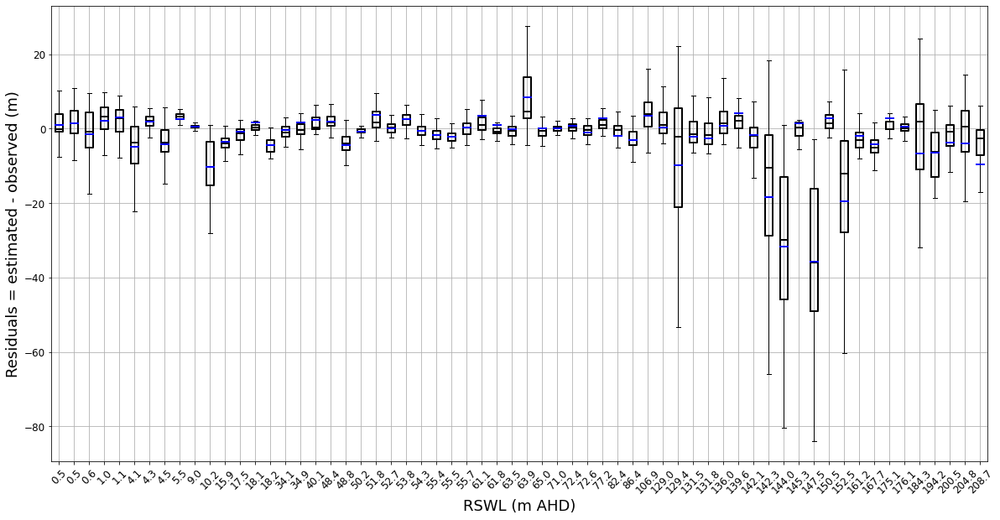

In [69]:
boxprops = dict(linestyle='-', linewidth=2, color="k")
medianprops = dict(linestyle='-', linewidth=2, color="k")
meanpointprops = dict(marker='.', markeredgecolor= "r", markerfacecolor = "r")
meanlineprops = dict(linestyle='-', linewidth=2, color='b')

colours = dict(boxes='k', whiskers='k', medians='k', caps='k')

plt.figure(figsize=(20,10))
df_residuals_r[ar_name_list[1:]].transpose().boxplot(rot=45, showfliers=False, showmeans=True, 
                                                     boxprops=boxprops, medianprops=medianprops,
                                                     meanline=True,meanprops=meanlineprops,  #meanpointprops,
                                                     color = colours,
                                                     fontsize=12, )
#plt.gca().xaxis.set_major_formatter(FormatStrFormatter('%2.1f'))

# Changing the number of decimal points in the xlabels
ax = plt.gca()
labels = [item.get_text() for item in plt.gca().get_xticklabels()]
ax.set_xticklabels([str(round(float(label), 1)) for label in labels])


# Plot formatting
plt.xlabel("RSWL (m AHD)", fontsize=18)
plt.ylabel("Residuals = estimated - observed (m)", fontsize=18)

# Save the figure
plt.savefig(os.path.join(r'C:\Users\mar886\WaterTableProject\Willunga\willunga_wt\figures\paper',
                         "resid_well_bplot_rswl"), dpi=300)



## Plot mean squared residuals

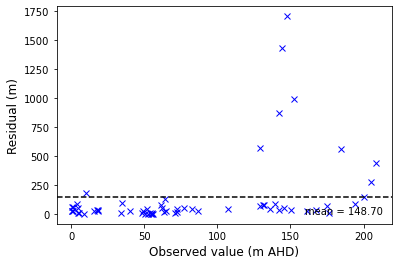

In [70]:
plt.plot(df_well_ixs_c['rswl'], df_sq_residuals['mean'], "bx")

mean_r = df_sq_residuals['mean'].mean()

plt.axhline(y=mean_r, ls="--", color="k")
plt.xlabel("Observed value (m AHD)", fontsize=12)
plt.ylabel("Residual (m)", fontsize=12)
plt.text(160, 0, "mean = %2.2f" %mean_r)

plt.savefig(os.path.join(r'C:\Users\mar886\WaterTableProject\Willunga\willunga_wt\figures\paper',
                         "residuals2"), dpi=300)

## Plot root mean squared residuals

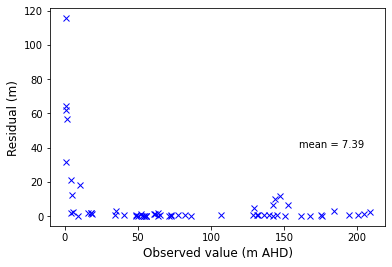

In [71]:
plt.plot(df_well_ixs_c['rswl'], df_sq_residuals['root_sq_norm_mean'], "bx")

mean_r = df_sq_residuals['root_sq_norm_mean'].mean()

#plt.axhline(y=mean_r, ls="--", color="k")
plt.xlabel("Observed value (m AHD)", fontsize=12)
plt.ylabel("Residual (m)", fontsize=12)
plt.text(160, 40, "mean = %2.2f" %mean_r)

plt.savefig(os.path.join(r'C:\Users\mar886\WaterTableProject\Willunga\willunga_wt\figures\paper',
                         "residuals_rmse"), dpi=300)

## Residuals boxplots - per map

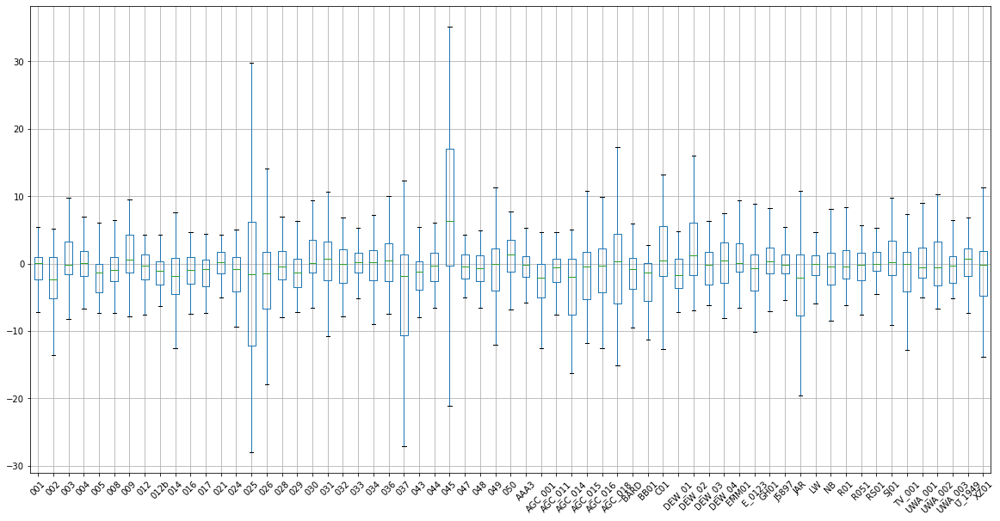

In [72]:
plt.figure(figsize=(20,10))
df_residuals[ar_name_list].boxplot(rot=45, showfliers=False)
plt.savefig(os.path.join(r'C:\Users\mar886\WaterTableProject\Willunga\willunga_wt\figures\paper',
                         "resid_map_bplot"), dpi=300)

## Histogram - average error per map

In [73]:
df_residuals.head()

,001,002,003,004,005,008,009,012,012b,014,...,n,mean,median,sq_mean,norm_mean,sq_norm_mean,rt_sq_mean,25th,75th,rswl
DHNO,,,,,,,,,,,,,,,,,,,,,
27118,-9.036944,-11.029639,-2.932006,3.824889,-0.296792,-0.438003,-1.187815,-0.450935,NaN,-8.550685,...,55,0.836416,-0.185601,0.699591,1.858701,3.454770,0.836416,-0.934307,3.949498,0.45
27119,-9.283926,-13.530401,-1.609569,5.113712,-1.552745,-1.303133,1.586114,-0.367076,NaN,-8.540041,...,55,1.237993,1.386490,1.532628,2.475987,6.130511,1.237993,-1.264522,4.663116,0.50
27113,-17.619902,-16.635562,-10.130538,0.593201,-4.290741,-0.219174,NaN,NaN,NaN,-14.533470,...,49,-1.839882,-0.987306,3.385167,-3.345241,11.190635,1.839882,-5.457499,4.372346,0.55
27107,-8.315455,-14.455607,0.496156,4.726823,-0.152304,-0.951767,7.463899,-0.225069,NaN,-7.071140,...,55,1.852306,3.092719,3.431036,1.890108,3.572508,1.852306,-0.258039,5.548849,0.98
27121,0.755614,2.304207,-0.172239,1.561395,0.749876,6.062506,NaN,NaN,NaN,-3.174708,...,47,3.002236,2.449497,9.013422,2.680568,7.185445,3.002236,-0.771126,5.037558,1.12


In [74]:
rmse_per_map = []
rmse_per_map_nms = []

for i in range(len(ar_name_list)):
    a = df_residuals[ar_name_list[i]]
    rmse_per_map.append(np.sqrt((a**2).sum()/a.count()).mean())
    rmse_per_map_nms.append(ar_name_list[i])

In [75]:
len(rmse_per_map)

63

In [76]:
print("Average calibration RMSE per well and per map: %2.2f"%np.mean(rmse_per_map))
print("Median calibration RMSE per well and per map: %2.2f"%np.median(rmse_per_map))
print("Maximum calibration RMSE per well and per map: %2.2f"%np.max(rmse_per_map))

Average calibration RMSE per well and per map: 10.48
Median calibration RMSE per well and per map: 10.58
Maximum calibration RMSE per well and per map: 24.04


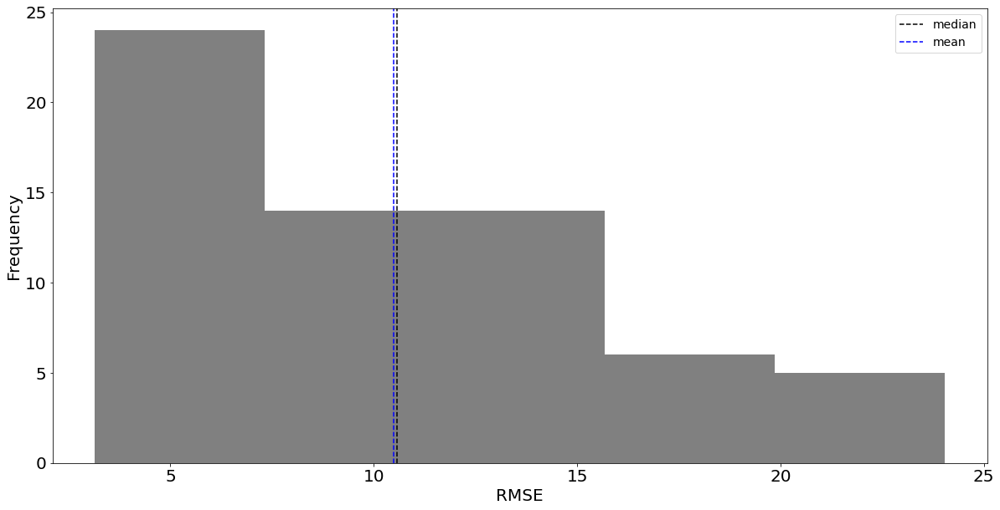

In [77]:
plt.figure(figsize=(20,10))
plt.hist(rmse_per_map, density=False, bins=5, color="0.5")
plt.axvline(np.median(rmse_per_map), ls='--', color="k", label="median")
plt.axvline(np.mean(rmse_per_map), ls='--', color="b", label="mean")
plt.gca().tick_params(axis='both', which='major', labelsize=20)

plt.legend(fontsize=14)

plt.xlabel("RMSE", fontsize=20)
plt.ylabel("Frequency", fontsize=20)

# Could change bins more regular
plt.savefig(os.path.join(r'C:\Users\mar886\WaterTableProject\Willunga\willunga_wt\figures\paper',
                         "rmse_per_map_hist"), dpi=300)

# Re-do standard deviation figure with the mean cailbration residual values 

In [78]:
df_residuals.head()
#df_well_ixs_c.head()

,001,002,003,004,005,008,009,012,012b,014,...,n,mean,median,sq_mean,norm_mean,sq_norm_mean,rt_sq_mean,25th,75th,rswl
DHNO,,,,,,,,,,,,,,,,,,,,,
27118,-9.036944,-11.029639,-2.932006,3.824889,-0.296792,-0.438003,-1.187815,-0.450935,NaN,-8.550685,...,55,0.836416,-0.185601,0.699591,1.858701,3.454770,0.836416,-0.934307,3.949498,0.45
27119,-9.283926,-13.530401,-1.609569,5.113712,-1.552745,-1.303133,1.586114,-0.367076,NaN,-8.540041,...,55,1.237993,1.386490,1.532628,2.475987,6.130511,1.237993,-1.264522,4.663116,0.50
27113,-17.619902,-16.635562,-10.130538,0.593201,-4.290741,-0.219174,NaN,NaN,NaN,-14.533470,...,49,-1.839882,-0.987306,3.385167,-3.345241,11.190635,1.839882,-5.457499,4.372346,0.55
27107,-8.315455,-14.455607,0.496156,4.726823,-0.152304,-0.951767,7.463899,-0.225069,NaN,-7.071140,...,55,1.852306,3.092719,3.431036,1.890108,3.572508,1.852306,-0.258039,5.548849,0.98
27121,0.755614,2.304207,-0.172239,1.561395,0.749876,6.062506,NaN,NaN,NaN,-3.174708,...,47,3.002236,2.449497,9.013422,2.680568,7.185445,3.002236,-0.771126,5.037558,1.12


In [79]:
# Rename mean from residuals so I know its residual mean when I add it to the other dataframe
df_residuals = df_residuals.rename(columns={"mean": "res_mean", "rt_sq_mean": "res_rt_sq_mn"})
df_residuals.head()

,001,002,003,004,005,008,009,012,012b,014,...,n,res_mean,median,sq_mean,norm_mean,sq_norm_mean,res_rt_sq_mn,25th,75th,rswl
DHNO,,,,,,,,,,,,,,,,,,,,,
27118,-9.036944,-11.029639,-2.932006,3.824889,-0.296792,-0.438003,-1.187815,-0.450935,NaN,-8.550685,...,55,0.836416,-0.185601,0.699591,1.858701,3.454770,0.836416,-0.934307,3.949498,0.45
27119,-9.283926,-13.530401,-1.609569,5.113712,-1.552745,-1.303133,1.586114,-0.367076,NaN,-8.540041,...,55,1.237993,1.386490,1.532628,2.475987,6.130511,1.237993,-1.264522,4.663116,0.50
27113,-17.619902,-16.635562,-10.130538,0.593201,-4.290741,-0.219174,NaN,NaN,NaN,-14.533470,...,49,-1.839882,-0.987306,3.385167,-3.345241,11.190635,1.839882,-5.457499,4.372346,0.55
27107,-8.315455,-14.455607,0.496156,4.726823,-0.152304,-0.951767,7.463899,-0.225069,NaN,-7.071140,...,55,1.852306,3.092719,3.431036,1.890108,3.572508,1.852306,-0.258039,5.548849,0.98
27121,0.755614,2.304207,-0.172239,1.561395,0.749876,6.062506,NaN,NaN,NaN,-3.174708,...,47,3.002236,2.449497,9.013422,2.680568,7.185445,3.002236,-0.771126,5.037558,1.12


In [80]:
if "res_mean" in df_well_ixs_c.columns:
    pass
else:
    df_well_ixs_c = df_well_ixs_c.join(df_residuals['res_mean'], on=df_residuals.index)


In [81]:
if "res_rt_sq_mn" in df_well_ixs_c.columns:
    pass
else:
    df_well_ixs_c = df_well_ixs_c.join(df_residuals['res_rt_sq_mn'], on=df_residuals.index)


In [82]:
df_well_ixs_c.head()

,DHNO,rswl,well_ix,well_ix_x,well_ix_y,letter,001,002,003,004,...,UWA_002,UWA_003,U_1949,XZ01,n,mean,25th,75th,res_mean,res_rt_sq_mn
DHNO,,,,,,,,,,,,,,,,,,,,,
26558,26558,4.09,"(186, 20)",186,20,NaN,-20.203262,-18.057812,-7.563098,2.955072,...,4.810652,-1.033586,NaN,2.915760,54,-1.157317,-5.521735,4.638394,0.836416,0.836416
26565,26565,4.33,"(155, 40)",155,40,NaN,1.742489,0.965118,4.902679,5.247573,...,6.859198,5.867774,7.563270,5.884896,59,6.055026,4.999494,7.635187,1.237993,1.237993
26585,26585,18.22,"(144, 56)",144,56,NaN,14.311897,15.319687,17.065609,13.750219,...,14.499062,17.881145,12.944971,14.203263,63,13.722613,12.027284,15.145957,-1.839882,1.839882
27050,27050,5.54,"(195, 50)",195,50,NaN,6.538256,2.622898,9.101677,8.543658,...,10.830378,8.051178,8.941176,9.044769,63,8.160018,7.991015,9.369665,1.852306,1.852306
27063,27063,15.90,"(217, 35)",217,35,NaN,10.516420,12.784949,11.679647,12.474450,...,13.846466,11.660877,10.242346,10.026504,62,12.297091,10.691167,13.359565,3.002236,3.002236


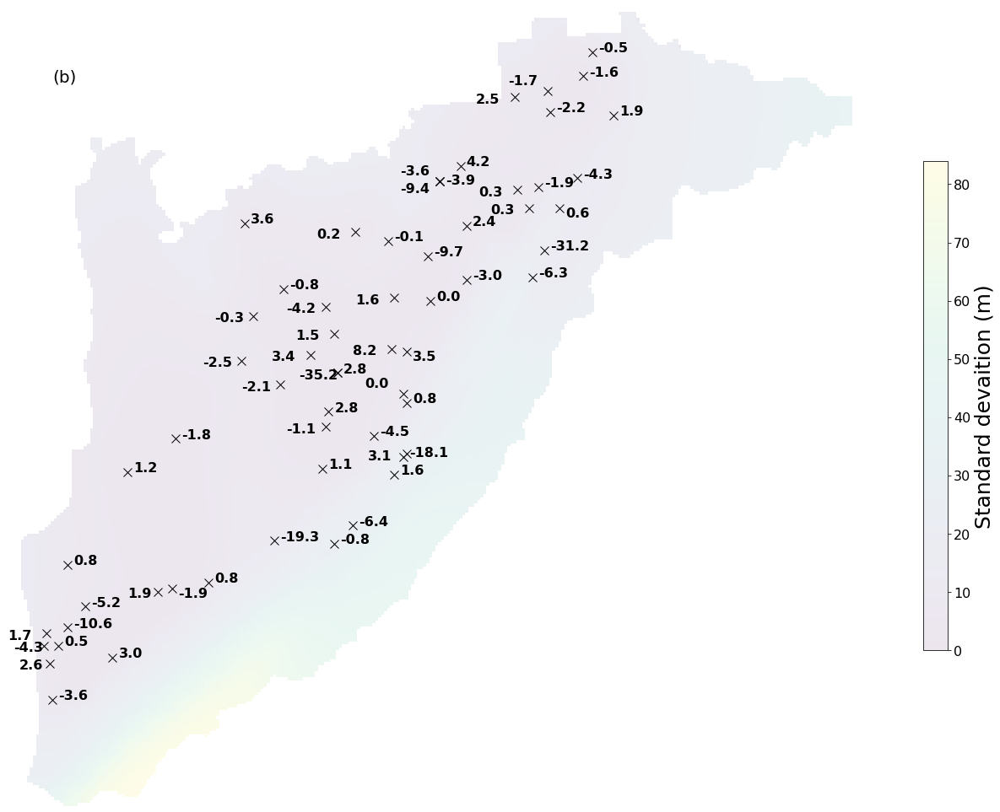

In [83]:
plt.figure(figsize=(20,20))

axes=plt.subplot(111, frameon=False)

m = plt.imshow(std_array, cmap='viridis', alpha=0.1)
#cs = plt.contour(std_array, colors="k", linewidths=1)
plt.clabel(cs, inline=1, fontsize=14, fmt='%1i', colors="k")
cb = plt.colorbar(m, fraction=0.026, pad=0.06)

axes.get_xaxis().set_visible(False)
axes.get_yaxis().set_visible(False)

for t in cb.ax.get_yticklabels():
     t.set_fontsize(16)
        
cb.set_label("Standard devaition (m)", fontsize=25)


ii = 0
for i in range(len(df_well_ixs_c.index)):
    ix = df_well_ixs_c.index[i]
    y = df_well_ixs_c.loc[ix,"well_ix_x"]
    x = df_well_ixs_c.loc[ix,"well_ix_y"]
    letter = df_well_ixs_c.loc[ix,"letter"]
    value_r = df_well_ixs_c.loc[ix,"res_mean"]
    plt.plot(x,y,'x',c='k', markersize=10, label='_nolegend_')
    if ii in [39, 53, 56]:
        # Bottom right
        #plt.text(x+2,y+3,"%i:%2.1f"%(ii,value_r), fontsize=16, fontweight='bold',c="k")
        plt.text(x+2,y+3,"%2.1f"%(value_r), fontsize=16, fontweight='bold',c="k")

        # Left 
    elif ii in [6, 15, 22, 23, 26, 27, 28, 31, 35, 16, 40, 43, 49, 50, 54, 55]:
        plt.text(x-13,y+2,"%2.1f"%(value_r), fontsize=16, fontweight='bold',c="k")
        
            # Left close
    elif ii in [3, 7, 8]:
        plt.text(x-10,y+2,"%2.1f"%(value_r), fontsize=16, fontweight='bold',c="k")
        
        # Left down 
    elif ii in [61]:
        plt.text(x-13,y+4,"%2.1f"%(value_r), fontsize=16, fontweight='bold',c="k")
        
        # Right
    elif ii in [60]:
        plt.text(x+2, y+1,"%2.1f"%(value_r), fontsize=16, fontweight='bold',c="k")
        
        # Left up 
    elif ii in [22, 33, 46, 59]:
        plt.text(x-13,y-2,"%2.1f"%(value_r), fontsize=16, fontweight='bold',c="k")
        
    else:
        # Right up
        #plt.text(x,y-3,"%i:%2.1f"%(ii,value_r), fontsize=16, fontweight='bold',c="k")
        plt.text(x+2,y+0,"%2.1f"%(value_r), fontsize=16, fontweight='bold',c="k")
    ii +=1
    
#axes.plot(x,y, "kx", alpha=1, markersize=10, label="Hydraulic head measurement")    
#plt.legend(frameon=False, fontsize=18, loc=4)

plt.text(15,25, "(b)", fontsize=20)

nm = os.path.join(figure_directory, "std_c")
#plt.savefig(nm, dpi=300)

# Spatial plot where the residuals are coloured 

In [84]:

upr = df_well_ixs_c["res_mean"].max()
print(upr)
lwr = df_well_ixs_c["res_mean"].min()
print(lwr)
print(max([abs(upr),abs(lwr)]))

rangecol = max([abs(upr),abs(lwr)])*2 #upr - lwr

# Create a new upper and lower - because I want to use the absolute values so it's symmetrical

upr = max([abs(upr),abs(lwr)])
lwr = -max([abs(upr),abs(lwr)])

print(rangecol)
colour = cm.seismic(np.linspace(0, 1, int(rangecol+1)*100)) # coolwarm_r
print(int(rangecol+1)*100)

8.242927028111051
-35.2222428339178
35.2222428339178
70.4444856678356
7100


In [85]:
value_r = 40.5

int((value_r - lwr)*100)

7572

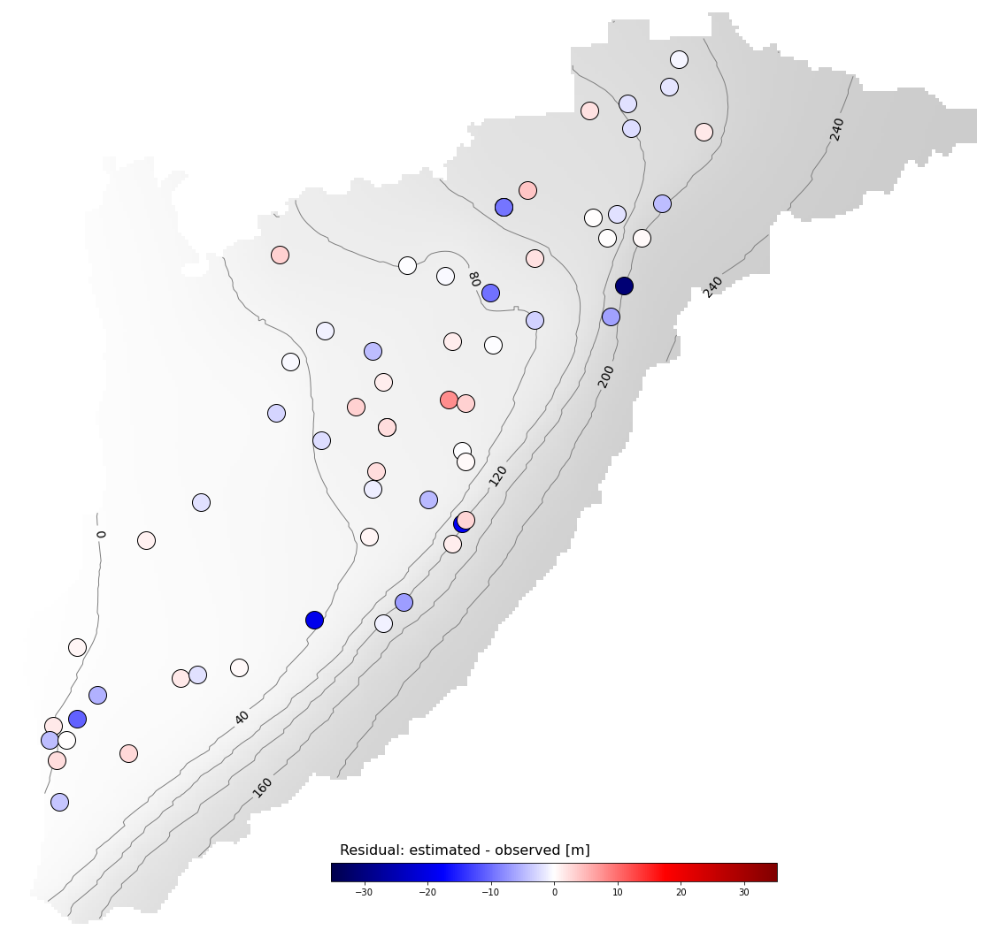

In [86]:
fig = plt.figure(figsize=(20,20))

axes=plt.subplot(111, frameon=False)

m = plt.imshow(mean_array, cmap='gist_gray_r', alpha=0.2)
cs = plt.contour(mean_array, colors="0.5", linewidths=1)
plt.clabel(cs, inline=1, fontsize=14, fmt='%1i', colors="k")
#cb = plt.colorbar(m, fraction=0.026, pad=0.06)

axes.get_xaxis().set_visible(False)
axes.get_yaxis().set_visible(False)

for t in cb.ax.get_yticklabels():
     t.set_fontsize(16)
        
cb.set_label("Standard devaition (m)", fontsize=25)


ii = 0
for i in range(len(df_well_ixs_c.index)):
    ix = df_well_ixs_c.index[i]
    y = df_well_ixs_c.loc[ix,"well_ix_x"]
    x = df_well_ixs_c.loc[ix,"well_ix_y"]
    letter = df_well_ixs_c.loc[ix,"letter"]
    value_r = df_well_ixs_c.loc[ix,"res_mean"]
    
    # Make the colour according to the value of the residual
    c = "k"
    c = colour[int((value_r - lwr)*100)]
    
    # Plotting the markers
    plt.plot(x,y,'o',c=c, markersize=20, markeredgecolor="k", label='_nolegend_')
    #plt.text(x+2,y+3,"%2.1f"%(value_r), fontsize=16, fontweight='bold',c="k")

    
# Colourbar for the residuals
plt.subplots_adjust(top = 0.93, hspace=0.3, wspace=0.1) # , bottom=0.01, 
cmap = mpl.cm.ScalarMappable(
      norm = mcolors.Normalize(lwr, upr), 
      cmap = plt.get_cmap('seismic'))

cbaxes1 = fig.add_axes([0.38, 0.2, 0.35, 0.015]) 
cmap.set_array([])
cb = fig.colorbar(cmap,  cax=cbaxes1, orientation="horizontal")
cb.set_label("Residual: estimated - observed [m]", labelpad=-60, x=0.3, y=10, fontsize=16)
    
#axes.plot(x,y, "kx", alpha=1, markersize=10, label="Hydraulic head measurement")    
#plt.legend(frameon=False, fontsize=18, loc=4)

#plt.text(15,25, "(b)", fontsize=20)

nm = os.path.join(figure_directory, "map_residuals")
plt.savefig(nm, dpi=300)

# PREDICTION DATA -----------------------------------------------

# Make a dataframe with the prediction data only

In [87]:
df_well_ixs_p = df_well_ixs[~df_well_ixs['letter'].isna()].copy()
df_well_ixs_p.index = df_well_ixs_p.DHNO
df_well_ixs_p.head(10)

,DHNO,rswl,well_ix,well_ix_x,well_ix_y,letter
DHNO,,,,,,
27125,27125,16.11,"(197, 17)",197,17,a
39875,39875,35.77,"(215, 66)",215,66,b
42108,42108,166.65,"(36, 185)",36,185,i
46232,46232,70.07,"(107, 154)",107,154,h
180822,180822,55.58,"(109, 109)",109,109,f
new1,new1,NaN,"(182, 36)",182,36,c
new2,new2,NaN,"(119, 156)",119,156,g
new3,new3,NaN,"(155, 53)",155,53,d
new4,new4,NaN,"(68, 34)",68,34,e


# Make a dataframe with prediction only where we have observed value

In [88]:
df_well_ixs_p1 = df_well_ixs_p[~df_well_ixs_p['rswl'].isna()].copy()
df_well_ixs_p1.index = df_well_ixs_p1.DHNO
df_well_ixs_p1.head()

,DHNO,rswl,well_ix,well_ix_x,well_ix_y,letter
DHNO,,,,,,
27125,27125,16.11,"(197, 17)",197,17,a
39875,39875,35.77,"(215, 66)",215,66,b
42108,42108,166.65,"(36, 185)",36,185,i
46232,46232,70.07,"(107, 154)",107,154,h
180822,180822,55.58,"(109, 109)",109,109,f


# Make a dataframe with prediction only where we don't have an observed value

In [89]:
df_well_ixs_p2 = df_well_ixs_p[df_well_ixs_p['rswl'].isna()].copy()
df_well_ixs_p2.index = df_well_ixs_p2.DHNO
df_well_ixs_p2.head()

,DHNO,rswl,well_ix,well_ix_x,well_ix_y,letter
DHNO,,,,,,
new1,new1,NaN,"(182, 36)",182,36,c
new2,new2,NaN,"(119, 156)",119,156,g
new3,new3,NaN,"(155, 53)",155,53,d
new4,new4,NaN,"(68, 34)",68,34,e


# Get all the values from the maps

In [90]:
len(df_well_ixs_p1)

5

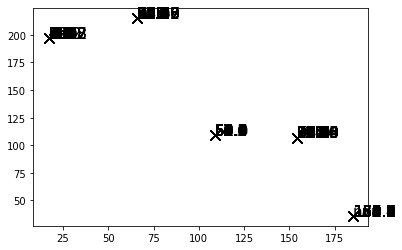

In [91]:
# For p1

calibrated_h_list_p = []

for ar_i in range(len(arrays_list)):
        
    wt_ar = arrays_list[ar_i]
    nm = names_list[ar_i][:-4]
    well_hds = []


    for i in range(len(df_well_ixs_p1)):
        ix = df_well_ixs_p1.index[i]
        xi = df_well_ixs_p1.loc[ix,'well_ix_x']
        yi = df_well_ixs_p1.loc[ix,'well_ix_y']
        h = wt_ar[xi, yi]
        plt.plot(yi,xi,"kx", markersize=10)
        plt.text(yi,xi,"%2.1f"%h, fontsize=15)

        well_hds.append(h)

    #print(well_hds)

    calibrated_h_list_p.append(well_hds)
    df_well_ixs_p1[nm] = well_hds
    


In [92]:
# For p2

calibrated_h_list_p2 = []

for ar_i in range(len(arrays_list)):
        
    wt_ar = arrays_list[ar_i]
    nm = names_list[ar_i][:-4]
    well_hds = []

    for i in range(len(df_well_ixs_p2)):
        ix = df_well_ixs_p2.index[i]
        xi = df_well_ixs_p2.loc[ix,'well_ix_x']
        yi = df_well_ixs_p2.loc[ix,'well_ix_y']
        h = wt_ar[xi, yi]
        well_hds.append(h)

    #print(well_hds)
    
    calibrated_h_list_p2.append(well_hds)
    df_well_ixs_p2[nm] = well_hds

# Calculate the residuals for the predicted values

In [93]:
df_residuals_p = pd.DataFrame()
df_sq_residuals_p = pd.DataFrame()

for ar_i in range(len(ar_name_list)):
    
    nm = ar_name_list[ar_i]
    
    #print(nm)
    
    resid_column = []
    sq_resid_column = []
    
    for well_i in range(len(df_well_ixs_p1)):
        rswl = df_well_ixs_p1.loc[df_well_ixs_p1.index[well_i], 'rswl']
        h_est = df_well_ixs_p1.loc[df_well_ixs_p1.index[well_i], nm]
        resid_column.append(h_est - rswl)
        sq_resid_column.append((h_est - rswl)**2)
        
    df_residuals_p[nm] = resid_column
    df_sq_residuals_p[nm] = sq_resid_column

In [94]:
# Residuals - - -
df_residuals_p['n'] = df_residuals_p[ar_name_list].count(axis=1)
df_residuals_p['res_mean'] = df_residuals_p[ar_name_list].mean(axis=1)
df_residuals_p['sq_mean'] = df_residuals_p[ar_name_list].mean(axis=1)**2
df_residuals_p['res_rt_sq_mn'] = np.sqrt(df_residuals_p[ar_name_list].mean(axis=1)**2)


df_residuals_p['25th'] = df_residuals_p[ar_name_list].quantile(q=0.25,axis=1)
df_residuals_p['75th'] = df_residuals_p[ar_name_list].quantile(q=0.75,axis=1)

# Plot mean residuals - predictions

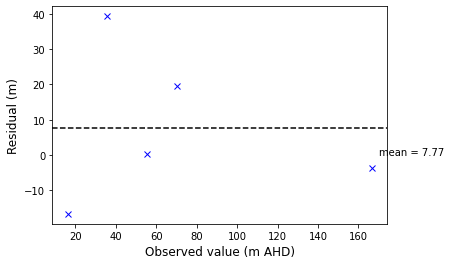

In [95]:
plt.plot(df_well_ixs_p1['rswl'], df_residuals_p['res_mean'], "bx")

mean_r = df_residuals_p['res_mean'].mean()

plt.axhline(y=mean_r, ls="--", color="k")
plt.xlabel("Observed value (m AHD)", fontsize=12)
plt.ylabel("Residual (m)", fontsize=12)
plt.text(170, 0, "mean = %2.2f" %mean_r)

plt.savefig(os.path.join(r'C:\Users\mar886\WaterTableProject\Willunga\willunga_wt\figures\paper',
                         "residuals_p"), dpi=300)

# Residuals boxplot per map - predictions

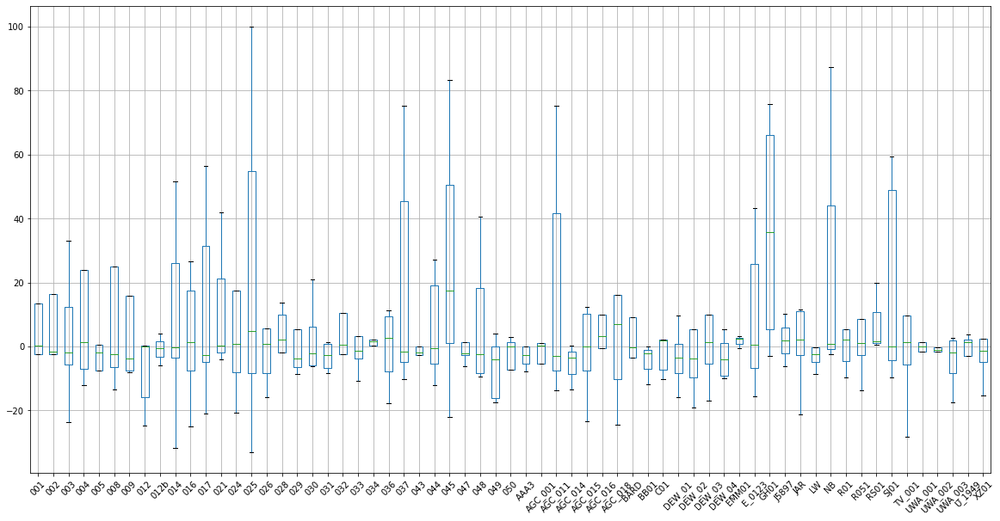

In [96]:
plt.figure(figsize=(20,10))
df_residuals_p[ar_name_list].boxplot(rot=45, showfliers=False)
plt.savefig(os.path.join(r'C:\Users\mar886\WaterTableProject\Willunga\willunga_wt\figures\paper',
                         "resid_map_bplot_p"), dpi=300)

## Histogram - average error per map - predictions


In [97]:
df_residuals_p.index = df_well_ixs_p1.index
print(df_residuals_p.index)

Index(['27125', '39875', '42108', '46232', '180822'], dtype='object', name='DHNO')


In [98]:
# Add rswl data to prediction residuals
if 'rswl' in df_residuals_p.columns:
    pass
else:
    df_residuals_p = df_residuals_p.join(df_well_ixs_p1['rswl'], on=df_residuals_p.index)


In [99]:
df_residuals_p.head(10)

,001,002,003,004,005,008,009,012,012b,014,...,UWA_003,U_1949,XZ01,n,res_mean,sq_mean,res_rt_sq_mn,25th,75th,rswl
DHNO,,,,,,,,,,,,,,,,,,,,,
27125,-34.929733,-35.274833,-23.662199,-12.017036,-22.942319,-13.334894,-7.346605,-15.948539,NaN,-31.793878,...,-17.526570,NaN,-15.356676,54,-16.710555,279.242647,16.710555,-22.089987,-9.708345,16.11
39875,65.481030,81.840870,32.923474,84.088612,58.316838,113.703999,NaN,-24.675819,NaN,51.713414,...,NaN,-15.628910,50.800938,49,39.311591,1545.401202,39.311591,-1.653156,65.481030,35.77
42108,-2.357184,-2.496313,-5.571265,-6.865790,-7.434988,-6.394583,-8.062949,0.371210,-5.849417,-3.399420,...,-5.232184,1.666772,-4.939383,62,-3.568459,12.733900,3.568459,-6.355433,-1.344862,166.65
46232,13.318496,16.347694,12.481819,23.866447,0.517112,24.958412,62.879646,0.248092,3.917137,25.959343,...,2.698799,3.800163,2.342376,63,19.420632,377.160959,19.420632,5.326557,25.905376,70.07
180822,0.217279,-1.718046,-1.771856,1.329607,-2.005545,-2.434584,0.081324,-0.126776,-0.469206,-0.312162,...,1.580282,1.131544,-1.316683,63,0.384501,0.147841,0.384501,-1.436516,1.413732,55.58


In [100]:
rmse_per_map_p = []
rmse_per_map_p_nms = []

for i in range(len(ar_name_list)): # ar_name_list[1:]
    a = df_residuals_p[ar_name_list[i]]
    rmse_per_map_p.append(np.sqrt((a**2).sum()/a.count()).mean())
    rmse_per_map_p_nms.append(ar_name_list[i])
    

In [101]:
print("Average prediction RMSE per well and per map: %2.2f"%np.mean(rmse_per_map_p))
print("Median prediction RMSE per well and per map: %2.2f"%np.median(rmse_per_map_p))
print("Maximum prediction RMSE per well and per map: %2.2f"%np.max(rmse_per_map_p))

Average prediction RMSE per well and per map: 22.98
Median prediction RMSE per well and per map: 18.40
Maximum prediction RMSE per well and per map: 63.63


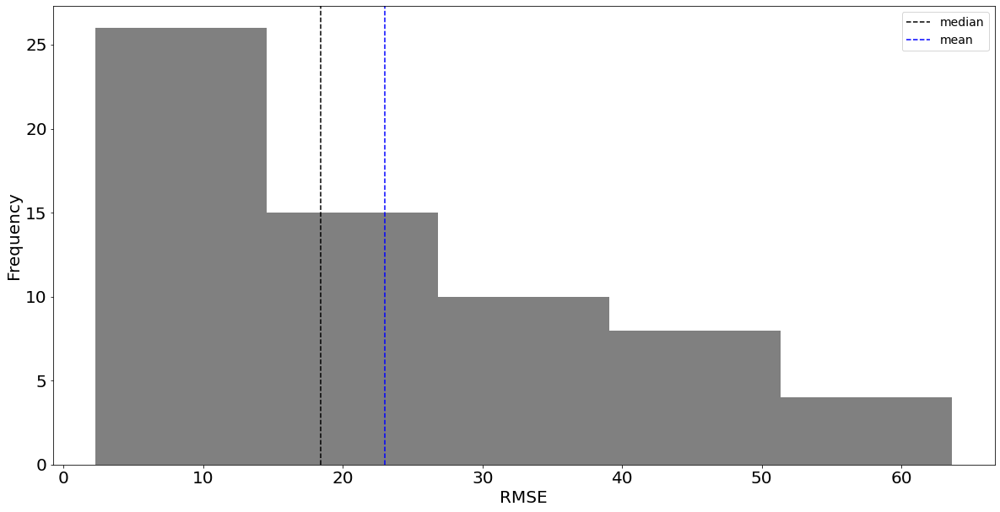

In [102]:
plt.figure(figsize=(20,10))
plt.hist(rmse_per_map_p, density=False, bins=5, color="0.5")
plt.axvline(np.median(rmse_per_map_p), ls='--', color="k", label="median")
plt.axvline(np.mean(rmse_per_map_p), ls='--', color="b", label="mean")
plt.gca().tick_params(axis='both', which='major', labelsize=20)

plt.legend(fontsize=14)

plt.xlabel("RMSE", fontsize=20)
plt.ylabel("Frequency", fontsize=20)

# Could change bins more regular
plt.savefig(os.path.join(r'C:\Users\mar886\WaterTableProject\Willunga\willunga_wt\figures\paper',
                         "rmse_per_map_hist_p"), dpi=300)

## Sort residuals by rswl

In [103]:
df_residuals_p = df_residuals_p.sort_values(by="rswl")

df_residuals_p_r = df_residuals_p.copy()
df_residuals_p_r.index = df_residuals_p_r.rswl
df_residuals_p_r.head()

,001,002,003,004,005,008,009,012,012b,014,...,UWA_003,U_1949,XZ01,n,res_mean,sq_mean,res_rt_sq_mn,25th,75th,rswl
rswl,,,,,,,,,,,,,,,,,,,,,
16.11,-34.929733,-35.274833,-23.662199,-12.017036,-22.942319,-13.334894,-7.346605,-15.948539,NaN,-31.793878,...,-17.526570,NaN,-15.356676,54,-16.710555,279.242647,16.710555,-22.089987,-9.708345,16.11
35.77,65.481030,81.840870,32.923474,84.088612,58.316838,113.703999,NaN,-24.675819,NaN,51.713414,...,NaN,-15.628910,50.800938,49,39.311591,1545.401202,39.311591,-1.653156,65.481030,35.77
55.58,0.217279,-1.718046,-1.771856,1.329607,-2.005545,-2.434584,0.081324,-0.126776,-0.469206,-0.312162,...,1.580282,1.131544,-1.316683,63,0.384501,0.147841,0.384501,-1.436516,1.413732,55.58
70.07,13.318496,16.347694,12.481819,23.866447,0.517112,24.958412,62.879646,0.248092,3.917137,25.959343,...,2.698799,3.800163,2.342376,63,19.420632,377.160959,19.420632,5.326557,25.905376,70.07
166.65,-2.357184,-2.496313,-5.571265,-6.865790,-7.434988,-6.394583,-8.062949,0.371210,-5.849417,-3.399420,...,-5.232184,1.666772,-4.939383,62,-3.568459,12.733900,3.568459,-6.355433,-1.344862,166.65


# Residuals boxplots - per well

In [104]:
df_well_ixs_p1

,DHNO,rswl,well_ix,well_ix_x,well_ix_y,letter,001,002,003,004,...,R01,R051,RS01,SJ01,TV_001,UWA_001,UWA_002,UWA_003,U_1949,XZ01
DHNO,,,,,,,,,,,,,,,,,,,,,
27125,27125,16.11,"(197, 17)",197,17,a,-18.819733,-19.164833,-7.552199,4.092964,...,6.493284,2.373010,NaN,6.522579,-12.192786,-4.780723,5.592253,-1.416570,NaN,0.753324
39875,39875,35.77,"(215, 66)",215,66,b,101.251030,117.610870,68.693474,119.858612,...,87.174255,87.110779,NaN,95.288338,116.912025,65.049408,34.116844,NaN,20.141090,86.570938
42108,42108,166.65,"(36, 185)",36,185,i,164.292816,164.153687,161.078735,159.784210,...,162.141174,164.024048,168.187225,166.725616,160.953903,164.984131,165.618454,161.417816,168.316772,161.710617
46232,46232,70.07,"(107, 154)",107,154,h,83.388496,86.417694,82.551819,93.936447,...,75.431305,78.599937,89.873474,118.982658,79.725548,70.062088,83.973251,72.768799,73.870163,72.412376
180822,180822,55.58,"(109, 109)",109,109,f,55.797279,53.861954,53.808144,56.909607,...,57.749840,56.577469,55.987152,51.317474,56.790771,56.935711,55.227306,57.160282,56.711544,54.263317


In [105]:
for i in df_well_ixs_p1.index:
    print(type(df_well_ixs_p1.loc[i, "letter"]))

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


In [106]:
df_well_ixs_p1.loc[df_residuals_p.index[0], "letter"]

'a'

In [107]:
#df_residuals_p

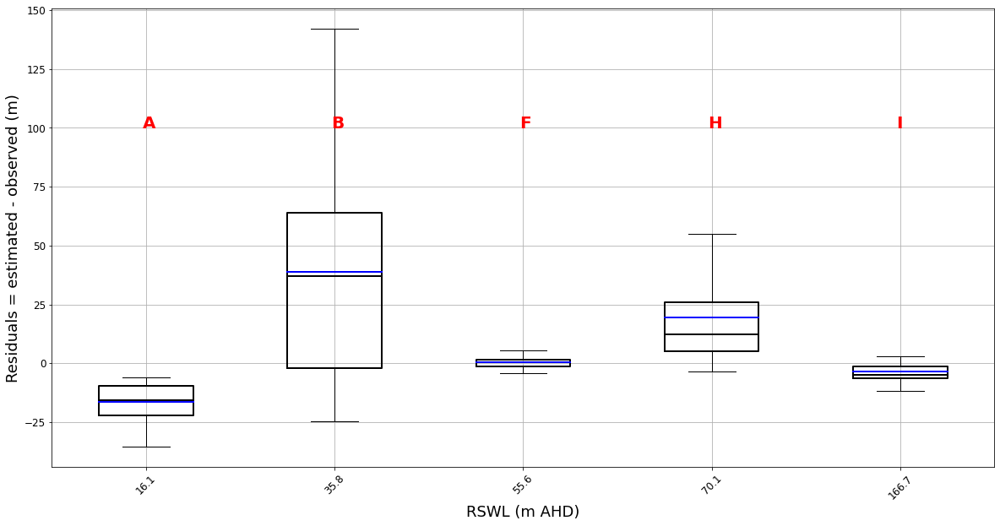

In [108]:
boxprops = dict(linestyle='-', linewidth=2, color="k")
medianprops = dict(linestyle='-', linewidth=2, color="k")
meanpointprops = dict(marker='.', markeredgecolor= "r", markerfacecolor = "r")
meanlineprops = dict(linestyle='-', linewidth=2, color='b')

colours = dict(boxes='k', whiskers='k', medians='k', caps='k')

plt.figure(figsize=(20,10))
df_residuals_p_r[ar_name_list[1:]].transpose().boxplot(rot=45, showfliers=False, showmeans=True, 
                                                     boxprops=boxprops, medianprops=medianprops,
                                                     meanline=True,meanprops=meanlineprops,  #meanpointprops,
                                                     color = colours,
                                                     fontsize=12, )
#plt.gca().xaxis.set_major_formatter(FormatStrFormatter('%2.1f'))

# Changing the number of decimal points in the xlabels
ax = plt.gca()
labels = [item.get_text() for item in plt.gca().get_xticklabels()]
ax.set_xticklabels([str(round(float(label), 1)) for label in labels])


# Plot formatting
plt.xlabel("RSWL (m AHD)", fontsize=18)
plt.ylabel("Residuals = estimated - observed (m)", fontsize=18)

# Plot the letter above - can use df_residuals_p because it is also been sorted in order of rswl

for i in range(len(df_residuals_p.index)):
    xval = i+0.98
    yval = 100
    txt = df_well_ixs_p1.loc[df_residuals_p.index[i], "letter"].upper()
    plt.text(xval, yval, txt, fontsize=20, fontweight="bold", c="r")
    
# Save the figure
plt.savefig(os.path.join(r'C:\Users\mar886\WaterTableProject\Willunga\willunga_wt\figures\paper',
                         "resid_well_bplot_rswl_p"), dpi=300)


# DO A BOXPLOT WITH ALL OF THE DATA TOGETHER - CALIB AND PREDICT

In [109]:
#df_residuals_r = df_residuals_r.rename(columns={"mean": "res_mean", "rt_sq_mean":"res_rt_sq_mn"})

In [110]:
print(df_well_ixs_p1.index)
print(df_residuals_p.index)

Index(['27125', '39875', '42108', '46232', '180822'], dtype='object', name='DHNO')
Index(['27125', '39875', '180822', '46232', '42108'], dtype='object', name='DHNO')


In [111]:
df_residuals_p.head() # Already sorted

df_well_ixs_p1 = df_well_ixs_p1.sort_values(by="rswl")

#df_well_ixs_p1.head()
#print(df_residuals_p.index)

print(df_well_ixs_p1.columns)
print(df_residuals_p.columns)

Index(['DHNO', 'rswl', 'well_ix', 'well_ix_x', 'well_ix_y', 'letter', '001',
       '002', '003', '004', '005', '008', '009', '012', '012b', '014', '016',
       '017', '021', '024', '025', '026', '028', '029', '030', '031', '032',
       '033', '034', '036', '037', '043', '044', '045', '047', '048', '049',
       '050', 'AAA3', 'AGC_001', 'AGC_011', 'AGC_014', 'AGC_015', 'AGC_016',
       'AGC_018', 'BARD', 'BB01', 'C01', 'DEW_01', 'DEW_02', 'DEW_03',
       'DEW_04', 'EMM01', 'E_0123', 'GH01', 'J5897', 'JAR', 'LW', 'NB', 'R01',
       'R051', 'RS01', 'SJ01', 'TV_001', 'UWA_001', 'UWA_002', 'UWA_003',
       'U_1949', 'XZ01'],
      dtype='object')
Index(['001', '002', '003', '004', '005', '008', '009', '012', '012b', '014',
       '016', '017', '021', '024', '025', '026', '028', '029', '030', '031',
       '032', '033', '034', '036', '037', '043', '044', '045', '047', '048',
       '049', '050', 'AAA3', 'AGC_001', 'AGC_011', 'AGC_014', 'AGC_015',
       'AGC_016', 'AGC_018', 'BARD', 

In [112]:
if "res_mean" in df_well_ixs_p1.columns:
    pass
else:
    df_well_ixs_p1 = df_well_ixs_p1.join(df_residuals_p['res_mean'], on=df_residuals_p.index)
    
if "res_rt_sq_mn" in df_well_ixs_p1.columns:
    pass
else:
    df_well_ixs_p1 = df_well_ixs_p1.join(df_residuals_p['res_rt_sq_mn'], on=df_residuals_p.index)

df_well_ixs_p1.head(2)

,DHNO,rswl,well_ix,well_ix_x,well_ix_y,letter,001,002,003,004,...,RS01,SJ01,TV_001,UWA_001,UWA_002,UWA_003,U_1949,XZ01,res_mean,res_rt_sq_mn
DHNO,,,,,,,,,,,,,,,,,,,,,
27125,27125,16.11,"(197, 17)",197,17,a,-18.819733,-19.164833,-7.552199,4.092964,...,NaN,6.522579,-12.192786,-4.780723,5.592253,-1.41657,NaN,0.753324,-16.710555,16.710555
39875,39875,35.77,"(215, 66)",215,66,b,101.251030,117.610870,68.693474,119.858612,...,NaN,95.288338,116.912025,65.049408,34.116844,NaN,20.14109,86.570938,39.311591,39.311591


# Re-do spatial residuals figure - with prediction and calibration

## Add the mean residuals to the well ixs dataframe

In [113]:
cols_for_df = ar_name_list + ["rswl", "well_ix_x", "well_ix_y", "res_mean", "res_rt_sq_mn", "letter"]

df_well_ixs_both = df_well_ixs_c[cols_for_df].append(df_well_ixs_p1[cols_for_df])
df_well_ixs_both.tail()

,001,002,003,004,005,008,009,012,012b,014,...,UWA_002,UWA_003,U_1949,XZ01,rswl,well_ix_x,well_ix_y,res_mean,res_rt_sq_mn,letter
DHNO,,,,,,,,,,,,,,,,,,,,,
27125,-18.819733,-19.164833,-7.552199,4.092964,-6.832319,2.775106,8.763395,0.161461,NaN,-15.683878,...,5.592253,-1.416570,NaN,0.753324,16.11,197,17,-16.710555,16.710555,a
39875,101.251030,117.610870,68.693474,119.858612,94.086838,149.473999,NaN,11.094181,NaN,87.483414,...,34.116844,NaN,20.141090,86.570938,35.77,215,66,39.311591,39.311591,b
180822,55.797279,53.861954,53.808144,56.909607,53.574455,53.145416,55.661324,55.453224,55.110794,55.267838,...,55.227306,57.160282,56.711544,54.263317,55.58,109,109,0.384501,0.384501,f
46232,83.388496,86.417694,82.551819,93.936447,70.587112,95.028412,132.949646,70.318092,73.987137,96.029343,...,83.973251,72.768799,73.870163,72.412376,70.07,107,154,19.420632,19.420632,h
42108,164.292816,164.153687,161.078735,159.784210,159.215012,160.255417,158.587051,167.021210,160.800583,163.250580,...,165.618454,161.417816,168.316772,161.710617,166.65,36,185,-3.568459,3.568459,i


## Define a function to truncate a colourmap - because i want to use greys but without the white part

In [114]:


import matplotlib.colors as colors
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap
    
cmap = plt.get_cmap('gist_gray_r')
new_cmap = truncate_colormap(cmap, 0.3, 1)


# Define my colour scale

In [115]:
upr = df_well_ixs_both["res_mean"].max()
print(upr)
lwr = df_well_ixs_both["res_mean"].min()
print(lwr)
print(max([abs(upr),abs(lwr)]))

rangecol = max([abs(upr),abs(lwr)])*2 #upr - lwr

# Create a new upper and lower - because I want to use the absolute values so it's symmetrical

upr = max([abs(upr),abs(lwr)])
lwr = -max([abs(upr),abs(lwr)])

print(rangecol)
colour = cm.seismic_r(np.linspace(0, 1, int(rangecol+1)*100)) # coolwarm_r
print(int(rangecol+1)*100)

39.311591197422565
-35.2222428339178
39.311591197422565
78.62318239484513
7900


# Plot residuals

In [116]:
x

144

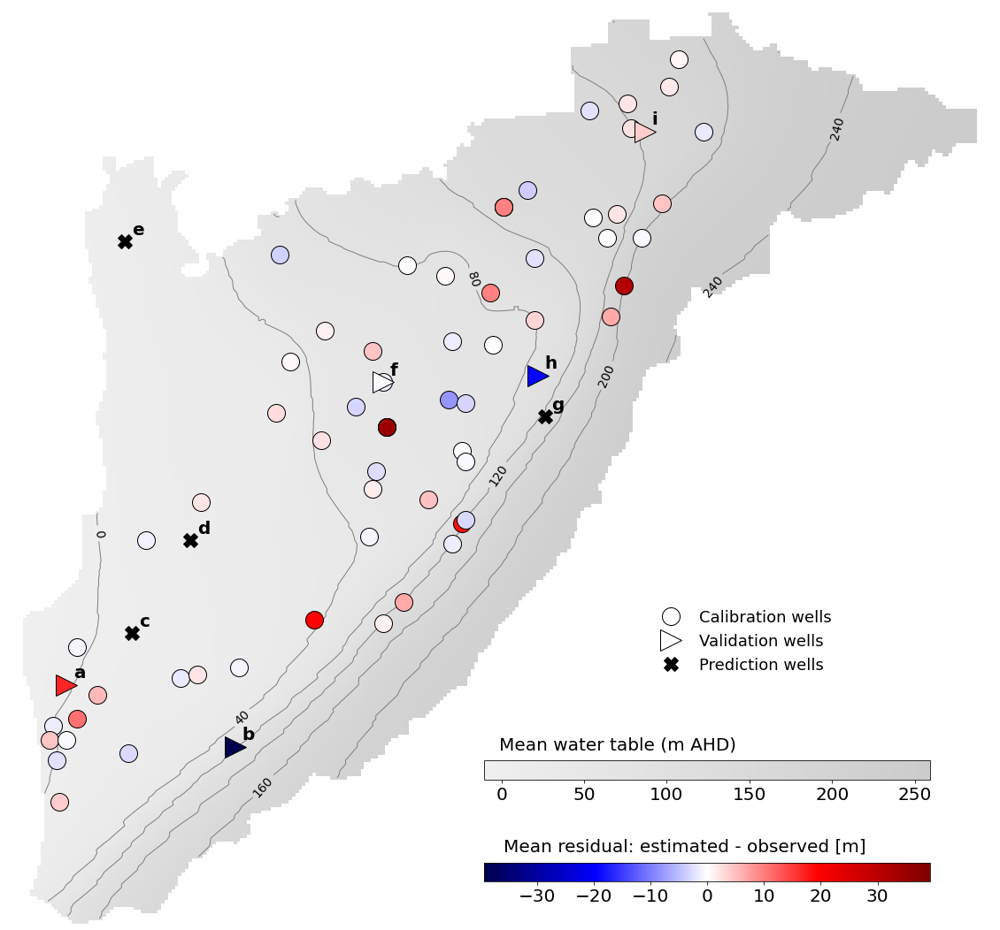

In [117]:
df = df_well_ixs_both

fig = plt.figure(figsize=(20,20))

axes=plt.subplot(111, frameon=False)

m = plt.imshow(mean_array, cmap=new_cmap, alpha=0.2)
cs = plt.contour(mean_array, colors="0.5", linewidths=1)
plt.clabel(cs, inline=1, fontsize=14, fmt='%1i', colors="k")


axes.get_xaxis().set_visible(False)
axes.get_yaxis().set_visible(False)


# ---------- Plotting points

ii = 0
for i in range(len(df.index)):
    ix = df.index[i]
    y = df.loc[ix,"well_ix_x"]
    x = df.loc[ix,"well_ix_y"]
    letter = df.loc[ix,"letter"]
    value_r = df.loc[ix,"res_mean"]
    
    # Make the colour according to the value of the residual
    c = "k"
    c = colour[int((value_r - lwr)*100)]
    
    if type(letter)==float:
    # Plotting the markers
        plt.plot(x,y,'o',c=c, markersize=20, markeredgecolor="k", label='_nolegend_')
    #plt.text(x+2,y+3,"%2.1f"%(value_r), fontsize=16, fontweight='bold',c="k")
    else:
        plt.plot(x,y,'>',c=c, markersize=24, markeredgecolor="k", label='_nolegend_')
        plt.text(x+2,y-2, letter, fontsize=20, fontweight="bold")
        
        
# Add in other letters - no real data just measurement points
for i in range(len(df_well_ixs_p2.index)):
    ix = df_well_ixs_p2.index[i]
    y = df_well_ixs_p2.loc[ix,"well_ix_x"]
    x = df_well_ixs_p2.loc[ix,"well_ix_y"]
    letter = df_well_ixs_p2.loc[ix,"letter"]
    
    plt.plot(x,y,'X',c="k", markersize=16, markeredgecolor="k", label='_nolegend_')
    plt.text(x+2,y-2, letter, fontsize=20, fontweight="bold")

# ------------------------------------
# Replot this one because it's important and behind another point
df1 = df_well_ixs_both[df_well_ixs_both.index=='179080']

ix = df1.index[0]
y = df1.loc[ix,"well_ix_x"]
x = df1.loc[ix,"well_ix_y"]
letter = df1.loc[ix,"letter"]
value_r = df1.loc[ix,"res_mean"]

# Make the colour according to the value of the residual
c = "k"
c = colour[int((value_r - lwr)*100)]

# Plotting the markers
plt.plot(x,y,'o',c=c, markersize=20, markeredgecolor="k", label='_nolegend_')


cbfs = 20
# --------- Colourbar for the water table map

cbaxes = fig.add_axes([0.5, 0.28, 0.35, 0.015]) 

cb = fig.colorbar(m,  cax=cbaxes, orientation="horizontal")

for t in cb.ax.get_yticklabels():
     t.set_fontsize(20)
        
cb.set_label("Mean water table (m AHD)", labelpad=-75, x=0.3, y=10, fontsize=cbfs)
cb.ax.tick_params(labelsize=cbfs)  

        
# --------- Colourbar for the residuals
plt.subplots_adjust(top = 0.93, hspace=0.3, wspace=0.1) # , bottom=0.01, 
cmap = mpl.cm.ScalarMappable(
      norm = mcolors.Normalize(lwr, upr), 
      cmap = plt.get_cmap('seismic'))

cbaxes1 = fig.add_axes([0.5, 0.2, 0.35, 0.015]) 
cmap.set_array([])
cb = fig.colorbar(cmap,  cax=cbaxes1, orientation="horizontal")

cb.set_label("Mean residual: estimated - observed [m]", labelpad=-75, x=0.45, y=10, fontsize=cbfs)
cb.ax.tick_params(labelsize=cbfs)  





# ------- Making a legend
x = -100
y = -100
plt.plot(x,y,'o',c='w', markersize=20, markeredgecolor="k", label='Calibration wells')
plt.plot(x,y, '>', c='w', markersize=24, markeredgecolor="k", label='Validation wells')
plt.plot(x,y,'X', c="k", markersize=16, markeredgecolor="k", label='Prediction wells')

plt.legend(frameon=False, fontsize=18, loc=2, bbox_to_anchor=(0.35, 15))

# -------

#plt.text(15,25, "(b)", fontsize=20)

nm = os.path.join(figure_directory, "map_residuals_c_p")
#plt.savefig(nm, dpi=300)

# Same map but with the values plotted for my reference

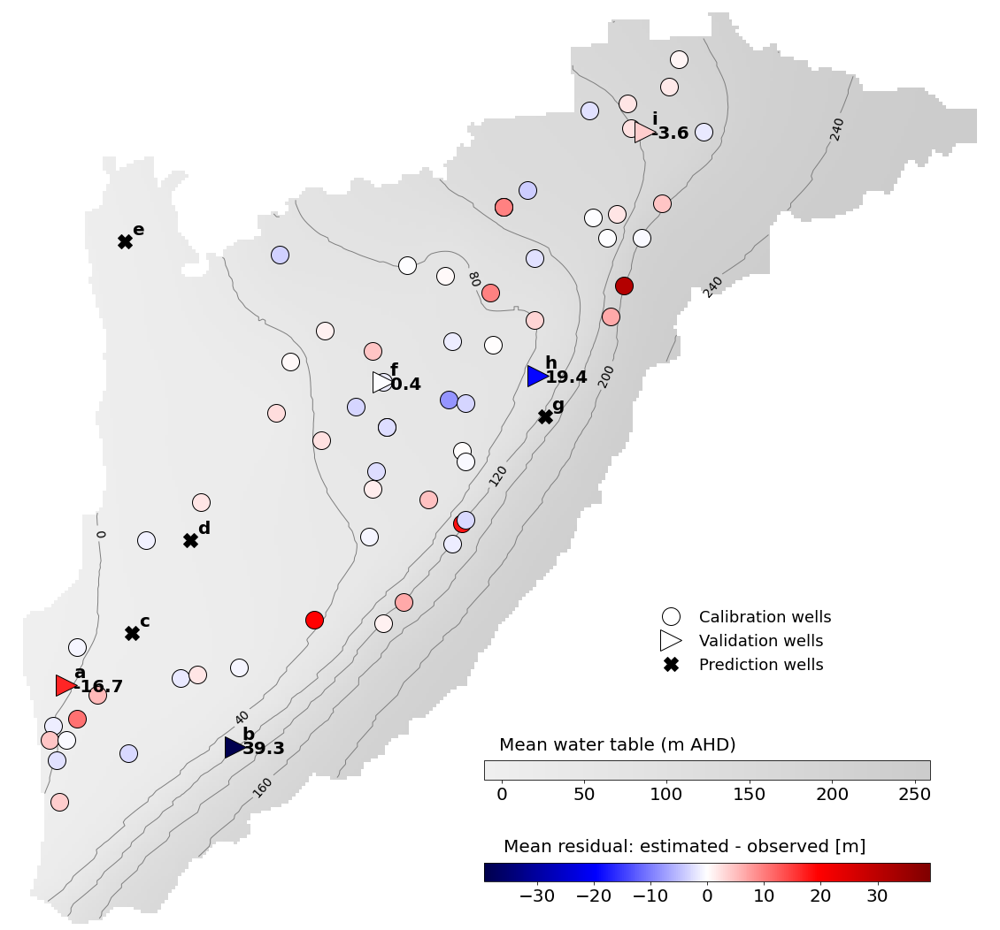

In [118]:
df = df_well_ixs_both

fig = plt.figure(figsize=(20,20))

axes=plt.subplot(111, frameon=False)

m = plt.imshow(mean_array, cmap=new_cmap, alpha=0.2)
cs = plt.contour(mean_array, colors="0.5", linewidths=1)
plt.clabel(cs, inline=1, fontsize=14, fmt='%1i', colors="k")


axes.get_xaxis().set_visible(False)
axes.get_yaxis().set_visible(False)


# ---------- Plotting points

ii = 0
for i in range(len(df.index)):
    ix = df.index[i]
    y = df.loc[ix,"well_ix_x"]
    x = df.loc[ix,"well_ix_y"]
    letter = df.loc[ix,"letter"]
    value_r = df.loc[ix,"res_mean"]
    
    # Make the colour according to the value of the residual
    c = "k"
    c = colour[int((value_r - lwr)*100)]
    
    if type(letter)==float:
    # Plotting the markers
        plt.plot(x,y,'o',c=c, markersize=20, markeredgecolor="k", label='_nolegend_')
    #plt.text(x+2,y+3,"%2.1f"%(value_r), fontsize=16, fontweight='bold',c="k")
    else:
        plt.plot(x,y,'>',c=c, markersize=24, markeredgecolor="k", label='_nolegend_')
        plt.text(x+2,y-2, letter, fontsize=20, fontweight="bold")
        plt.text(x+2,y+2, "%2.1f"%value_r, fontsize=20, fontweight="bold")

        
# Add in other letters - no real data just measurement points
for i in range(len(df_well_ixs_p2.index)):
    ix = df_well_ixs_p2.index[i]
    y = df_well_ixs_p2.loc[ix,"well_ix_x"]
    x = df_well_ixs_p2.loc[ix,"well_ix_y"]
    letter = df_well_ixs_p2.loc[ix,"letter"]
    
    plt.plot(x,y,'X',c="k", markersize=16, markeredgecolor="k", label='_nolegend_')
    plt.text(x+2,y-2, letter, fontsize=20, fontweight="bold")


cbfs = 20
# --------- Colourbar for the water table map

cbaxes = fig.add_axes([0.5, 0.28, 0.35, 0.015]) 

cb = fig.colorbar(m,  cax=cbaxes, orientation="horizontal")

for t in cb.ax.get_yticklabels():
     t.set_fontsize(20)
        
cb.set_label("Mean water table (m AHD)", labelpad=-75, x=0.3, y=10, fontsize=cbfs)
cb.ax.tick_params(labelsize=cbfs)  

        
# --------- Colourbar for the residuals
plt.subplots_adjust(top = 0.93, hspace=0.3, wspace=0.1) # , bottom=0.01, 
cmap = mpl.cm.ScalarMappable(
      norm = mcolors.Normalize(lwr, upr), 
      cmap = plt.get_cmap('seismic'))

cbaxes1 = fig.add_axes([0.5, 0.2, 0.35, 0.015]) 
cmap.set_array([])
cb = fig.colorbar(cmap,  cax=cbaxes1, orientation="horizontal")

cb.set_label("Mean residual: estimated - observed [m]", labelpad=-75, x=0.45, y=10, fontsize=cbfs)
cb.ax.tick_params(labelsize=cbfs)  





# ------- Making a legend
x = -100
y = -100
plt.plot(x,y,'o',c='w', markersize=20, markeredgecolor="k", label='Calibration wells')
plt.plot(x,y, '>', c='w', markersize=24, markeredgecolor="k", label='Validation wells')
plt.plot(x,y,'X', c="k", markersize=16, markeredgecolor="k", label='Prediction wells')

plt.legend(frameon=False, fontsize=18, loc=2, bbox_to_anchor=(0.35, 15))

# -------

#plt.text(15,25, "(b)", fontsize=20)

nm = os.path.join(figure_directory, "map_residuals_c_p_valvals")
#plt.savefig(nm, dpi=300)

# Same plot just with the calibration values 

Separating them for clarity of viewing

In [119]:
ix

'new4'

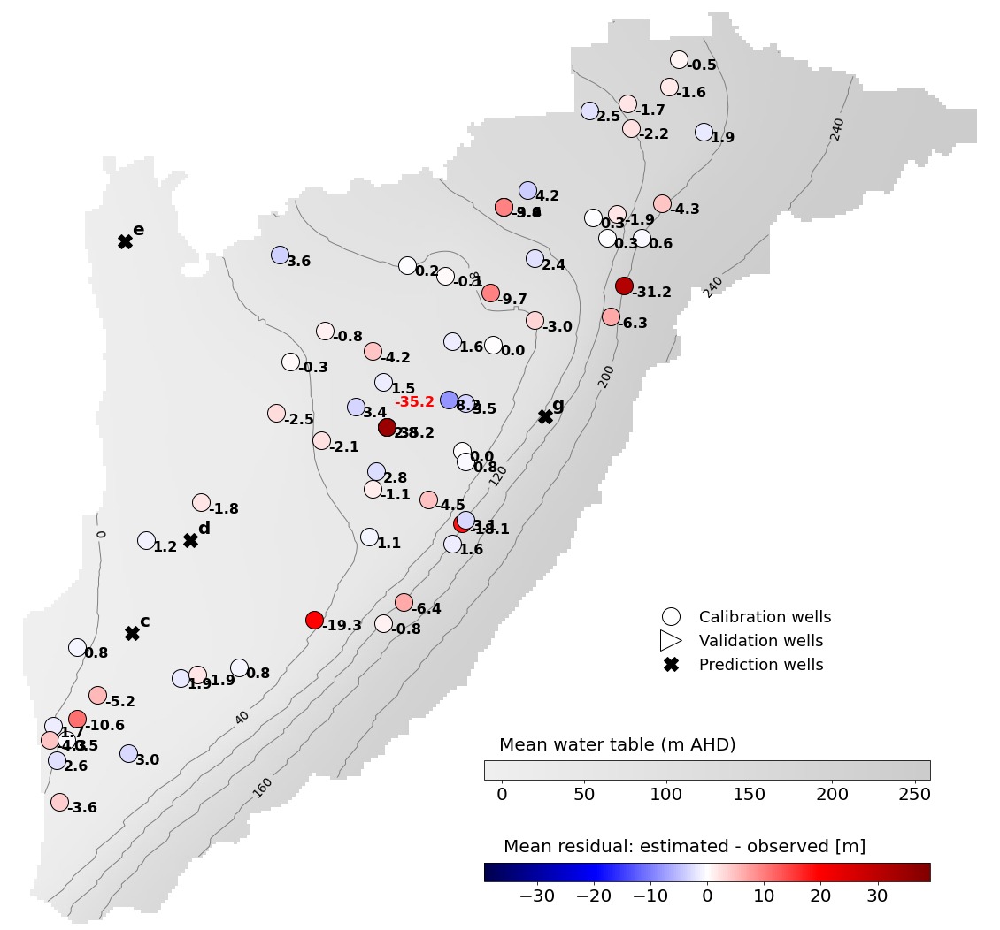

In [120]:
df = df_well_ixs_both

fig = plt.figure(figsize=(20,20))

axes=plt.subplot(111, frameon=False)

m = plt.imshow(mean_array, cmap=new_cmap, alpha=0.2)
cs = plt.contour(mean_array, colors="0.5", linewidths=1)
plt.clabel(cs, inline=1, fontsize=14, fmt='%1i', colors="k")


axes.get_xaxis().set_visible(False)
axes.get_yaxis().set_visible(False)


# ---------- Plotting points

ii = 0
for i in range(len(df.index)):
    ix = df.index[i]
    y = df.loc[ix,"well_ix_x"]
    x = df.loc[ix,"well_ix_y"]
    letter = df.loc[ix,"letter"]
    value_r = df.loc[ix,"res_mean"]
    
    # Make the colour according to the value of the residual
    c = "k"
    c = colour[int((value_r - lwr)*100)]
    
    if type(letter)==float:
    # Plotting the markers
        plt.plot(x,y,'o',c=c, markersize=20, markeredgecolor="k", label='_nolegend_')
        plt.text(x+2,y+3,"%2.1f"%(value_r), fontsize=16, fontweight='bold',c="k")
        #lt.text(x+2,y-3,"%s"%(ix), fontsize=16, fontweight='bold',c="k")

    else:
        pass
        #plt.plot(x,y,'>',c=c, markersize=24, markeredgecolor="k", label='_nolegend_')
        #plt.text(x+2,y-2, letter, fontsize=20, fontweight="bold")
        #plt.text(x+2,y+2, "%2.1f"%value_r, fontsize=20, fontweight="bold")

        
# Add in other letters - no real data just measurement points
for i in range(len(df_well_ixs_p2.index)):
    ix = df_well_ixs_p2.index[i]
    y = df_well_ixs_p2.loc[ix,"well_ix_x"]
    x = df_well_ixs_p2.loc[ix,"well_ix_y"]
    letter = df_well_ixs_p2.loc[ix,"letter"]
    
    plt.plot(x,y,'X',c="k", markersize=16, markeredgecolor="k", label='_nolegend_')
    plt.text(x+2,y-2, letter, fontsize=20, fontweight="bold")

# ------------------------------------
# Replot this one because it's important and behind another point
df1 = df_well_ixs_both[df_well_ixs_both.index=='179080']

ix = df1.index[0]
y = df1.loc[ix,"well_ix_x"]
x = df1.loc[ix,"well_ix_y"]
letter = df1.loc[ix,"letter"]
value_r = df1.loc[ix,"res_mean"]

# Make the colour according to the value of the residual
c = "k"
c = colour[int((value_r - lwr)*100)]

# Plotting the markers
plt.plot(x,y,'o',c=c, markersize=20, markeredgecolor="k", label='_nolegend_')
plt.text(x+2,y-6,"%2.1f"%(value_r), fontsize=16, fontweight='bold',c="r")


cbfs = 20
# --------- Colourbar for the water table map

cbaxes = fig.add_axes([0.5, 0.28, 0.35, 0.015]) 

cb = fig.colorbar(m,  cax=cbaxes, orientation="horizontal")

for t in cb.ax.get_yticklabels():
     t.set_fontsize(20)
        
cb.set_label("Mean water table (m AHD)", labelpad=-75, x=0.3, y=10, fontsize=cbfs)
cb.ax.tick_params(labelsize=cbfs)  

        
# --------- Colourbar for the residuals
plt.subplots_adjust(top = 0.93, hspace=0.3, wspace=0.1) # , bottom=0.01, 
cmap = mpl.cm.ScalarMappable(
      norm = mcolors.Normalize(lwr, upr), 
      cmap = plt.get_cmap('seismic'))

cbaxes1 = fig.add_axes([0.5, 0.2, 0.35, 0.015]) 
cmap.set_array([])
cb = fig.colorbar(cmap,  cax=cbaxes1, orientation="horizontal")

cb.set_label("Mean residual: estimated - observed [m]", labelpad=-75, x=0.45, y=10, fontsize=cbfs)
cb.ax.tick_params(labelsize=cbfs)  





# ------- Making a legend
x = -100
y = -100
plt.plot(x,y,'o',c='w', markersize=20, markeredgecolor="k", label='Calibration wells')
plt.plot(x,y, '>', c='w', markersize=24, markeredgecolor="k", label='Validation wells')
plt.plot(x,y,'X', c="k", markersize=16, markeredgecolor="k", label='Prediction wells')

plt.legend(frameon=False, fontsize=18, loc=2, bbox_to_anchor=(0.35, 15))

# -------

#plt.text(15,25, "(b)", fontsize=20)

#nm = os.path.join(figure_directory, "map_residuals_c_p_calvals")
#plt.savefig(nm, dpi=300)

# Same plot just with the indexes

In [121]:
df_well_ixs_both.index

Index(['26558', '26565', '26585', '27050', '27063', '27107', '27112', '27113',
       '27117', '27118', '27119', '27121', '39932', '40002', '40495', '40740',
       '40794', '42029', '42104', '42117', '42173', '42190', '42279', '43439',
       '43470', '43490', '44644', '45105', '45276', '45418', '45475', '46069',
       '46129', '46196', '46212', '46229', '46299', '46552', '46725', '46726',
       '46734', '46736', '131933', '142342', '156132', '166221', '166767',
       '166769', '177637', '179079', '179080', '180838', '182233', '186362',
       '195701', '196280', '196571', '196608', '196609', '200676', '200677',
       '200678', '27125', '39875', '180822', '46232', '42108'],
      dtype='object', name='DHNO')

In [122]:
df_well_ixs_both[df_well_ixs_both.index=='179080']

,001,002,003,004,005,008,009,012,012b,014,...,UWA_002,UWA_003,U_1949,XZ01,rswl,well_ix_x,well_ix_y,res_mean,res_rt_sq_mn,letter
DHNO,,,,,,,,,,,,,,,,,,,,,
179080,54.534416,51.192474,52.759109,53.709824,52.975067,52.539921,53.179184,52.144707,53.870132,51.63361,...,53.281548,55.32629,56.396339,54.847427,55.44,122,110,-35.222243,35.222243,NaN


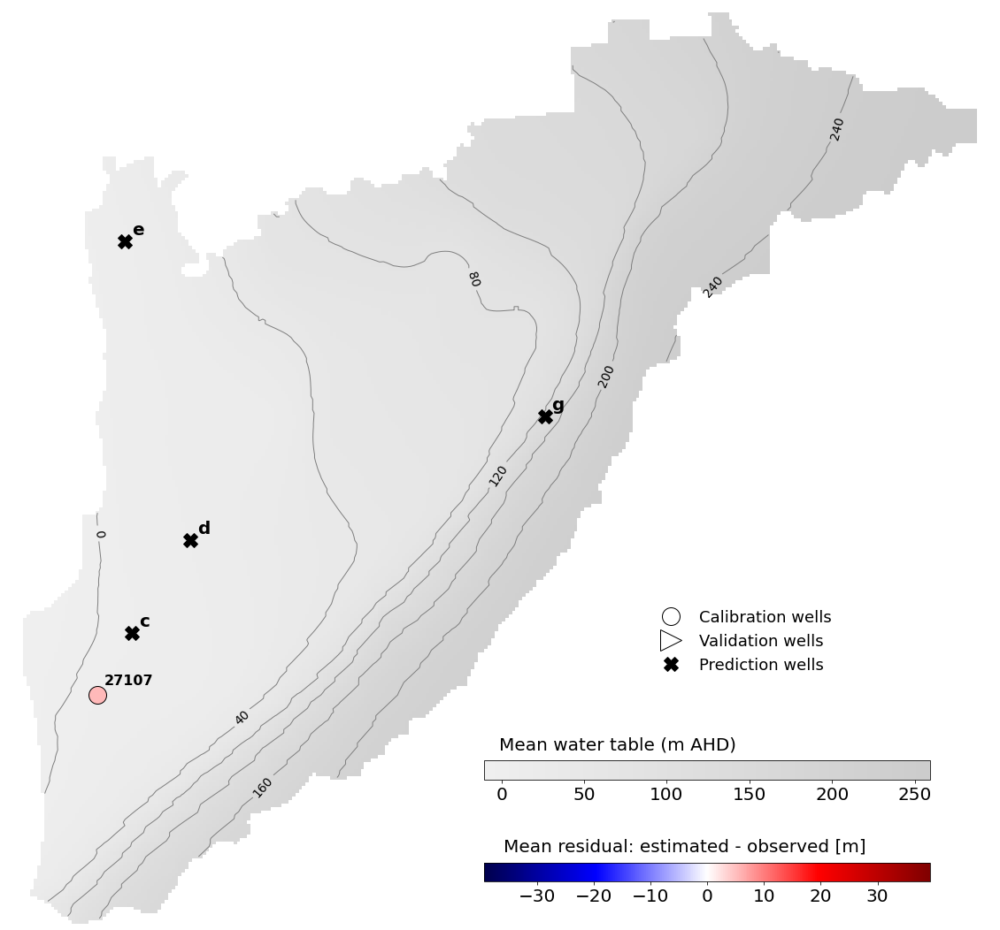

In [123]:
df = df_well_ixs_both[df_well_ixs_both.index=='27107'] # df_well_ixs_both

fig = plt.figure(figsize=(20,20))

axes=plt.subplot(111, frameon=False)

m = plt.imshow(mean_array, cmap=new_cmap, alpha=0.2)
cs = plt.contour(mean_array, colors="0.5", linewidths=1)
plt.clabel(cs, inline=1, fontsize=14, fmt='%1i', colors="k")


axes.get_xaxis().set_visible(False)
axes.get_yaxis().set_visible(False)


# ---------- Plotting points

ii = 0
for i in range(len(df.index)):
    ix = df.index[i]
    y = df.loc[ix,"well_ix_x"]
    x = df.loc[ix,"well_ix_y"]
    letter = df.loc[ix,"letter"]
    value_r = df.loc[ix,"res_mean"]
    
    # Make the colour according to the value of the residual
    c = "k"
    c = colour[int((value_r - lwr)*100)]
    
    if type(letter)==float:
    # Plotting the markers
        plt.plot(x,y,'o',c=c, markersize=20, markeredgecolor="k", label='_nolegend_')
        #plt.text(x+2,y+3,"%2.1f"%(value_r), fontsize=16, fontweight='bold',c="k")
        plt.text(x+2,y-3,"%s"%(ix), fontsize=16, fontweight='bold',c="k")

    else:
        pass
        #plt.plot(x,y,'>',c=c, markersize=24, markeredgecolor="k", label='_nolegend_')
        #plt.text(x+2,y-2, letter, fontsize=20, fontweight="bold")
        #plt.text(x+2,y+2, "%2.1f"%value_r, fontsize=20, fontweight="bold")

        
# Add in other letters - no real data just measurement points
for i in range(len(df_well_ixs_p2.index)):
    ix = df_well_ixs_p2.index[i]
    y = df_well_ixs_p2.loc[ix,"well_ix_x"]
    x = df_well_ixs_p2.loc[ix,"well_ix_y"]
    letter = df_well_ixs_p2.loc[ix,"letter"]
    
    plt.plot(x,y,'X',c="k", markersize=16, markeredgecolor="k", label='_nolegend_')
    plt.text(x+2,y-2, letter, fontsize=20, fontweight="bold")


cbfs = 20
# --------- Colourbar for the water table map

cbaxes = fig.add_axes([0.5, 0.28, 0.35, 0.015]) 

cb = fig.colorbar(m,  cax=cbaxes, orientation="horizontal")

for t in cb.ax.get_yticklabels():
     t.set_fontsize(20)
        
cb.set_label("Mean water table (m AHD)", labelpad=-75, x=0.3, y=10, fontsize=cbfs)
cb.ax.tick_params(labelsize=cbfs)  

        
# --------- Colourbar for the residuals
plt.subplots_adjust(top = 0.93, hspace=0.3, wspace=0.1) # , bottom=0.01, 
cmap = mpl.cm.ScalarMappable(
      norm = mcolors.Normalize(lwr, upr), 
      cmap = plt.get_cmap('seismic'))

cbaxes1 = fig.add_axes([0.5, 0.2, 0.35, 0.015]) 
cmap.set_array([])
cb = fig.colorbar(cmap,  cax=cbaxes1, orientation="horizontal")

cb.set_label("Mean residual: estimated - observed [m]", labelpad=-75, x=0.45, y=10, fontsize=cbfs)
cb.ax.tick_params(labelsize=cbfs)  





# ------- Making a legend
x = -100
y = -100
plt.plot(x,y,'o',c='w', markersize=20, markeredgecolor="k", label='Calibration wells')
plt.plot(x,y, '>', c='w', markersize=24, markeredgecolor="k", label='Validation wells')
plt.plot(x,y,'X', c="k", markersize=16, markeredgecolor="k", label='Prediction wells')

plt.legend(frameon=False, fontsize=18, loc=2, bbox_to_anchor=(0.35, 15))

# -------

#plt.text(15,25, "(b)", fontsize=20)

nm = os.path.join(figure_directory, "map_residuals_c_p_ixvals")
#plt.savefig(nm, dpi=300)

# Saving the residuals data for analysis

In [124]:
df_well_ixs_both.to_csv(os.path.join(r'C:\Users\mar886\WaterTableProject\Willunga\willunga_wt\output_data\residuals_data',
                                      "residuals.csv"))

# SURVEY DATA

## Pull in survey data for water level estimates


In [125]:
survey_wls_path = os.path.join(r'C:\Users\mar886\WaterTableProject\Willunga\willunga_wt\input_data', 'survey_wt_results.csv')
survey_df = pd.read_csv(survey_wls_path)

In [126]:
#survey_df.dtypes
survey_df.head(3)

,Order,REF_R,REF,ID,A,B,C,D,E,F,...,"When viewing the data and your final map, are there any locations that you think there are existing pumping wells? (If yes, please use the grid reference numbers, for example A1)","What do you think is the dominant flow direction or directions? (Please state as a flow direction towards, for example SE would mean flow is from NW towards the SE)",What is your highest level of education?,What do you identify as being your primary area of expertise?,How many years of experience do you have in this field and related areas?,Have you done water table mapping before?,Have you worked on the hydrogeology of the Willunga region before?,What is your usual platform for water table mapping? (Select as many as apply),What is your usual preferred technique(s) for water table mapping? (Select as many as apply),For the stream reach in grid cell F4 (upstream of point e) would you estimate it is a gaining or losing stream?
0,1,R001,1,1,5.0,100.0,7.0,3.0,54.0,63.0,...,"64 C2, 48 B3,","In C&D: NE to SW, turning to E to W in AB",PhD,Hydrogeology,> 10,Yes,Yes,ArcGIS/QGIS;Python or R code;Groundwater model...,Nonlinear geostatistics - such as Bayesian app...,NaN
1,2,R002,2,2,1.0,100.0,7.0,12.0,55.0,58.0,...,"F3, E5, B7, A8",SW,PhD,Hydrogeology,> 10,Yes,No,Surfer;,Splines,Gaining
2,3,R003,3,3,3.0,50.0,6.0,12.0,8.0,54.0,...,Not sure,Sw and w,PhD,Hydrogeology,NaN,Yes,Yes,ArcGIS/QGIS;,Linear geostatistics - such as kriging;Manual/...,Unsure


## Add rmse to survey df

In [127]:
survey_df["RMSE_c"] = np.nan #np.zeros(len(survey_df))
survey_df["RMSE_p"] = np.nan # np.zeros(len(survey_df))

survey_df.index = survey_df.REF_R

In [128]:
survey_df.index 
survey_df.head()

,Order,REF_R,REF,ID,A,B,C,D,E,F,...,What is your highest level of education?,What do you identify as being your primary area of expertise?,How many years of experience do you have in this field and related areas?,Have you done water table mapping before?,Have you worked on the hydrogeology of the Willunga region before?,What is your usual platform for water table mapping? (Select as many as apply),What is your usual preferred technique(s) for water table mapping? (Select as many as apply),For the stream reach in grid cell F4 (upstream of point e) would you estimate it is a gaining or losing stream?,RMSE_c,RMSE_p
REF_R,,,,,,,,,,,,,,,,,,,,,
R001,1,R001,1,1,5.0,100.0,7.0,3.0,54.0,63.0,...,PhD,Hydrogeology,> 10,Yes,Yes,ArcGIS/QGIS;Python or R code;Groundwater model...,Nonlinear geostatistics - such as Bayesian app...,NaN,NaN,NaN
R002,2,R002,2,2,1.0,100.0,7.0,12.0,55.0,58.0,...,PhD,Hydrogeology,> 10,Yes,No,Surfer;,Splines,Gaining,NaN,NaN
R003,3,R003,3,3,3.0,50.0,6.0,12.0,8.0,54.0,...,PhD,Hydrogeology,NaN,Yes,Yes,ArcGIS/QGIS;,Linear geostatistics - such as kriging;Manual/...,Unsure,NaN,NaN
R004,4,R004,4,4,7.0,100.0,5.0,10.0,10.0,55.0,...,PhD,Hydrogeology,> 10,Yes,No,ArcGIS/QGIS;Manual/by hand;,Manual/by hand;Inverse distance weighting;Line...,Losing,NaN,NaN
R005,5,R005,5,5,2.0,5.0,4.0,10.0,4.0,54.0,...,PhD,Engineering,410,Yes,No,Python or R code;Surfer;,Linear geostatistics - such as kriging;Numeric...,Losing,NaN,NaN


In [129]:
"R%s"%rmse_per_map_nms[i]

'R004'

In [130]:
for i in range(len(rmse_per_map)):
    #print(rmse_per_map_nms[i])
    #print(rmse_per_map[i])
    ref = "R%s"%rmse_per_map_nms[i]
    survey_df.loc[ref, "RMSE_c"] = rmse_per_map[i]
    
for i in range(len(rmse_per_map_p)):
    #print(rmse_per_map_nms[i])
    #print(rmse_per_map[i])
    ref = "R%s"%rmse_per_map_p_nms[i]
    survey_df.loc[ref, "RMSE_p"] = rmse_per_map_p[i]

## Get rmse per years of experience

In [131]:
survey_df['How many years of experience do you have in this field and related areas?'].unique()

array(['> 10', nan, '410', '0 - 3'], dtype=object)

In [132]:
survey_df_0 = survey_df[survey_df['How many years of experience do you have in this field and related areas?']=='0 - 3']
survey_df_4 = survey_df[survey_df['How many years of experience do you have in this field and related areas?']=='410']
survey_df_10 = survey_df[survey_df['How many years of experience do you have in this field and related areas?']=='> 10']

In [133]:
print("Number for 0-3: %i"%len(survey_df_0))
print("Number for 4-10: %i"%len(survey_df_4))
print("Number for >10: %i"%len(survey_df_10))

Number for 0-3: 12
Number for 4-10: 13
Number for >10: 32


In [134]:
survey_df_0['RMSE_c']

REF_R
R008         4.296915
R009         4.856185
R013              NaN
R031        16.372130
R036        10.181097
R037        14.900376
R044        14.480120
R050        14.162983
RAAA3       11.752930
RAGC_015    19.963649
RTV_001     11.419545
RUWA_002    24.037292
Name: RMSE_c, dtype: float64

In [135]:
print("Calibration rmse mean for 0-3: %2.2f"%survey_df_0['RMSE_c'].mean())
print("Calibration rmse mean for 4-10: %2.2f"%survey_df_4['RMSE_c'].mean())
print("Calibration rmse mean for >10: %2.2f"%survey_df_10['RMSE_c'].mean())

print("Prediction rmse mean for 0-3: %2.2f"%survey_df_0['RMSE_p'].mean())
print("Prediction rmse mean for 4-10: %2.2f"%survey_df_4['RMSE_p'].mean())
print("Prediction rmse mean for >10: %2.2f"%survey_df_10['RMSE_p'].mean())

Calibration rmse mean for 0-3: 13.31
Calibration rmse mean for 4-10: 9.84
Calibration rmse mean for >10: 8.81
Prediction rmse mean for 0-3: 21.71
Prediction rmse mean for 4-10: 19.84
Prediction rmse mean for >10: 24.83


## Get rmse per have you worked in the region before

In [136]:
survey_df['Have you worked on the hydrogeology of the Willunga region before?'].unique()

array(['Yes', 'No', nan], dtype=object)

In [137]:
survey_df_yeswill = survey_df[survey_df['Have you worked on the hydrogeology of the Willunga region before?']=="Yes"]
survey_df_nowill = survey_df[survey_df['Have you worked on the hydrogeology of the Willunga region before?']=="No"]

In [138]:
print("Number for yes worked in willunga: %i" %len(survey_df_yeswill))
print("Number for no worked in willunga: %i" %len(survey_df_nowill))

Number for yes worked in willunga: 10
Number for no worked in willunga: 48


In [139]:
print("Calibration rmse mean for yes worked in willunga: %2.2f"%survey_df_yeswill['RMSE_c'].mean())
print("Calibration rmse mean for no worked in willunga: %2.2f"%survey_df_nowill['RMSE_c'].mean())

print("Prediction rmse mean for yes worked in willunga: %2.2f"%survey_df_yeswill['RMSE_p'].mean())
print("Prediction rmse mean for no worked in willunga: %2.2f"%survey_df_nowill['RMSE_p'].mean())

Calibration rmse mean for yes worked in willunga: 9.61
Calibration rmse mean for no worked in willunga: 10.16
Prediction rmse mean for yes worked in willunga: 25.87
Prediction rmse mean for no worked in willunga: 22.28


## Get best and worst calibration/prediction error

In [140]:

print("Lowest calibration error: %2.2f" %survey_df["RMSE_c"].min())
print("Highest calibration error: %2.2f" %survey_df["RMSE_c"].max())

print("Lowest prediction error: %2.2f" %survey_df["RMSE_p"].min())
print("Highest prediction error: %2.2f" %survey_df["RMSE_p"].max())

Lowest calibration error: 3.15
Highest calibration error: 24.04
Lowest prediction error: 2.30
Highest prediction error: 63.63


## Difference in rmse based on if you have done wt mapping before

In [141]:
survey_df['Have you done water table mapping before?'].unique()

array(['Yes', 'No', nan], dtype=object)

In [142]:
survey_df_yeswtmapping = survey_df[survey_df['Have you done water table mapping before?']=="Yes"]   
survey_df_nowtmapping = survey_df[survey_df['Have you done water table mapping before?']=="No"]   


print("Number for yes wt mapped before: %i" %len(survey_df_yeswtmapping))
print("Number for no wt mapped before: %i" %len(survey_df_nowtmapping))

print("Calibration rmse mean for yes wt mapped before: %2.2f"%survey_df_yeswtmapping['RMSE_c'].mean())
print("Calibration rmse mean for no wt mapped before: %2.2f"%survey_df_nowtmapping['RMSE_c'].mean())

print("Prediction rmse mean for yes wt mapped before: %2.2f"%survey_df_yeswtmapping['RMSE_p'].mean())
print("Prediction rmse mean for no wt mapped before: %2.2f"%survey_df_nowtmapping['RMSE_p'].mean())

Number for yes wt mapped before: 41
Number for no wt mapped before: 17
Calibration rmse mean for yes wt mapped before: 9.16
Calibration rmse mean for no wt mapped before: 12.53
Prediction rmse mean for yes wt mapped before: 23.09
Prediction rmse mean for no wt mapped before: 21.92


# Making a box plot with survey results and predicted results

In [143]:
#df_well_ixs_p1.columns

In [144]:
#df_well_ixs_p2.columns

In [145]:
cols_for_df = ar_name_list + ["DHNO", "rswl", "well_ix_x", "well_ix_y", "letter"]

In [146]:
df_well_ixs_p1p2 = df_well_ixs_p1[cols_for_df].append(df_well_ixs_p2[cols_for_df])
df_well_ixs_p1p2 = df_well_ixs_p1p2.sort_values(by="letter")
df_well_ixs_p1p2.index = df_well_ixs_p1p2.letter
df_well_ixs_p1p2.head(10)

,001,002,003,004,005,008,009,012,012b,014,...,UWA_001,UWA_002,UWA_003,U_1949,XZ01,DHNO,rswl,well_ix_x,well_ix_y,letter
letter,,,,,,,,,,,,,,,,,,,,,
a,-18.819733,-19.164833,-7.552199,4.092964,-6.832319,2.775106,8.763395,0.161461,NaN,-15.683878,...,-4.780723,5.592253,-1.416570,NaN,0.753324,27125,16.11,197,17,a
b,101.251030,117.610870,68.693474,119.858612,94.086838,149.473999,NaN,11.094181,NaN,87.483414,...,65.049408,34.116844,NaN,20.141090,86.570938,39875,35.77,215,66,b
c,-7.708371,-8.037018,2.343328,2.459142,-0.545681,0.018456,8.502505,3.114691,NaN,-4.315008,...,2.156821,7.356041,2.647752,6.237552,5.290915,new1,NaN,182,36,c
d,9.999249,11.607593,12.187277,9.432354,10.877201,10.535300,10.058204,10.898252,12.310107,12.305639,...,12.818656,11.284241,14.058749,10.077169,11.577246,new3,NaN,155,53,d
e,4.326117,-1.677065,7.789410,9.318331,0.805374,3.097975,NaN,NaN,NaN,1.404919,...,10.498747,8.767546,2.957157,NaN,3.703321,new4,NaN,68,34,e
f,55.797279,53.861954,53.808144,56.909607,53.574455,53.145416,55.661324,55.453224,55.110794,55.267838,...,56.935711,55.227306,57.160282,56.711544,54.263317,180822,55.58,109,109,f
g,159.834564,143.357864,145.505524,155.230057,89.188828,153.021423,144.705414,68.616440,NaN,137.424591,...,81.219292,114.938858,85.034134,73.635551,91.969955,new2,NaN,119,156,g
h,83.388496,86.417694,82.551819,93.936447,70.587112,95.028412,132.949646,70.318092,73.987137,96.029343,...,70.062088,83.973251,72.768799,73.870163,72.412376,46232,70.07,107,154,h
i,164.292816,164.153687,161.078735,159.784210,159.215012,160.255417,158.587051,167.021210,160.800583,163.250580,...,164.984131,165.618454,161.417816,168.316772,161.710617,42108,166.65,36,185,i


In [147]:
df_well_ixs_p1p2_t = df_well_ixs_p1p2[ar_name_list].transpose()

df_well_ixs_p1p2_t.tail()

letter,a,b,c,d,e,f,g,h,i
UWA_001,-4.780723,65.049408,2.156821,12.818656,10.498747,56.935711,81.219292,70.062088,164.984131
UWA_002,5.592253,34.116844,7.356041,11.284241,8.767546,55.227306,114.938858,83.973251,165.618454
UWA_003,-1.416570,NaN,2.647752,14.058749,2.957157,57.160282,85.034134,72.768799,161.417816
U_1949,NaN,20.141090,6.237552,10.077169,NaN,56.711544,73.635551,73.870163,168.316772
XZ01,0.753324,86.570938,5.290915,11.577246,3.703321,54.263317,91.969955,72.412376,161.710617


In [148]:
# lowercase letters
survey_df = survey_df.rename(columns={"A":"a", "B":"b", "C":"c", "D":"d", "E":"e", "F":"f", "G":"g", "H":"h", "I":"i"})

survey_levels = ["a", "b", "c", "d", "e", "f", "g", "h", "i"]
survey_df[survey_levels].head(10)

,a,b,c,d,e,f,g,h,i
REF_R,,,,,,,,,
R001,5.0,100.0,7.0,3.0,54.0,63.0,152.0,99.0,172.0
R002,1.0,100.0,7.0,12.0,55.0,58.0,150.0,90.0,170.0
R003,3.0,50.0,6.0,12.0,8.0,54.0,125.0,85.0,165.0
R004,7.0,100.0,5.0,10.0,10.0,55.0,150.0,110.0,165.0
R005,2.0,5.0,4.0,10.0,4.0,54.0,147.0,77.0,162.0
R008,2.0,150.0,4.0,12.0,6.0,56.0,150.0,100.0,162.0
R009,5.0,65.0,5.0,10.0,4.0,54.0,150.0,130.0,164.0
R012,1.0,10.0,5.0,12.0,30.0,55.0,68.0,71.0,166.0
R012b,NaN,NaN,7.0,13.0,NaN,56.0,NaN,NaN,162.0


### Label each dataframe with data type so I can divide box plot up

In [149]:
df_well_ixs_p1p2_t = df_well_ixs_p1p2_t.assign(source='Raster')
survey_df_wells = survey_df[survey_levels].assign(source='Questionnaire')

df_well_ixs_p1p2_t.head()

letter,a,b,c,d,e,f,g,h,i,source
001,-18.819733,101.251030,-7.708371,9.999249,4.326117,55.797279,159.834564,83.388496,164.292816,Raster
002,-19.164833,117.610870,-8.037018,11.607593,-1.677065,53.861954,143.357864,86.417694,164.153687,Raster
003,-7.552199,68.693474,2.343328,12.187277,7.789410,53.808144,145.505524,82.551819,161.078735,Raster
004,4.092964,119.858612,2.459142,9.432354,9.318331,56.909607,155.230057,93.936447,159.784210,Raster
005,-6.832319,94.086838,-0.545681,10.877201,0.805374,53.574455,89.188828,70.587112,159.215012,Raster


In [150]:
df_well_estimations = pd.concat([survey_df_wells, df_well_ixs_p1p2_t])
df_well_estimations.tail()

,a,b,c,d,e,f,g,h,i,source
UWA_001,-4.780723,65.049408,2.156821,12.818656,10.498747,56.935711,81.219292,70.062088,164.984131,Raster
UWA_002,5.592253,34.116844,7.356041,11.284241,8.767546,55.227306,114.938858,83.973251,165.618454,Raster
UWA_003,-1.416570,NaN,2.647752,14.058749,2.957157,57.160282,85.034134,72.768799,161.417816,Raster
U_1949,NaN,20.141090,6.237552,10.077169,NaN,56.711544,73.635551,73.870163,168.316772,Raster
XZ01,0.753324,86.570938,5.290915,11.577246,3.703321,54.263317,91.969955,72.412376,161.710617,Raster


In [151]:
df_well_estimations_melt = pd.melt(df_well_estimations, id_vars=["source"], var_name=["Letter"])
print(df_well_estimations_melt.tail())


      source Letter       value
1192  Raster      i  164.984131
1193  Raster      i  165.618454
1194  Raster      i  161.417816
1195  Raster      i  168.316772
1196  Raster      i  161.710617


### Violin plot

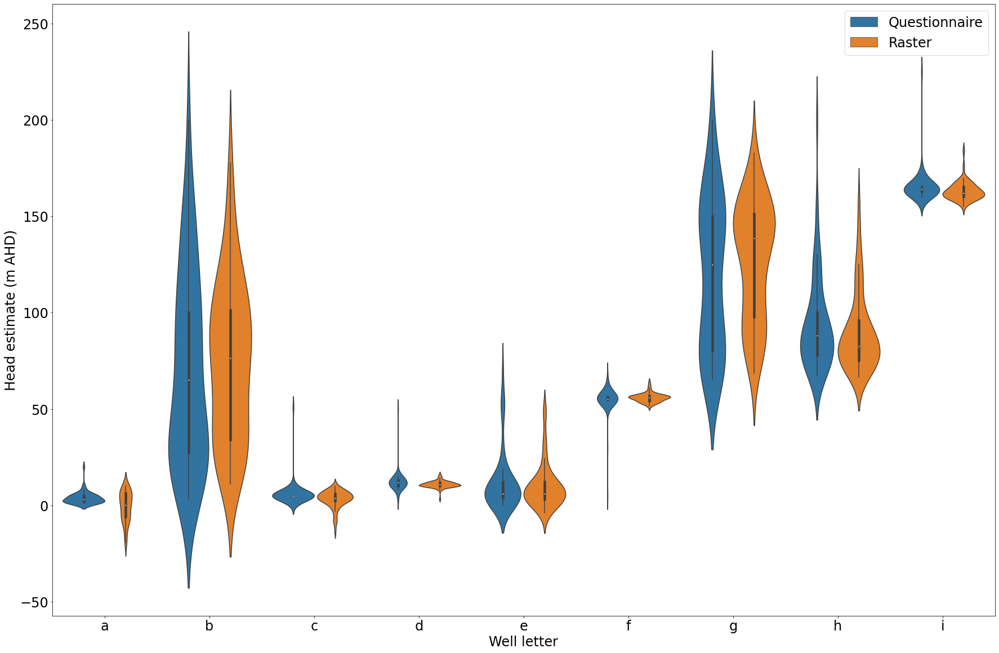

In [152]:
plt.figure(figsize=(30,20))
ax = sns.violinplot(x="Letter", y="value", hue="source", data=df_well_estimations_melt)    
#ax = sns.boxplot(x="Letter", y="value", hue="source", data=df_well_estimations_melt)    

plt.gca().tick_params(axis='both', which='major', labelsize=24)
plt.xlabel("Well letter", fontsize=24)
plt.ylabel("Head estimate (m AHD)", fontsize=24)

plt.legend(fontsize=24)
plt.show()


### Boxplot

In [153]:
#df_well_ixs_p1p2

In [154]:
1/len(df_well_ixs_p1p2)

0.1111111111111111

In [155]:
boxprops = {'linestyle': '-', 'linewidth': 2}


In [156]:
df_well_estimations_melt

,source,Letter,value
0,Questionnaire,a,5.000000
1,Questionnaire,a,1.000000
2,Questionnaire,a,3.000000
3,Questionnaire,a,7.000000
4,Questionnaire,a,2.000000
...,...,...,...
1192,Raster,i,164.984131
1193,Raster,i,165.618454
1194,Raster,i,161.417816
1195,Raster,i,168.316772


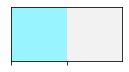

In [157]:
boxprops = {'linestyle': '-', 'linewidth': 2,
            'edgecolor':'k'}

rgbs = [(152/255, 245/255, 255/255),  (242/255, 242/255, 242/255)]

pal = sns.color_palette(rgbs)
sns.palplot(pal)


In [158]:
meanpointprops = {'marker': '>', 'markeredgecolor': 'k', 'markerfacecolor': 'k',
                 'markersize': '25'}

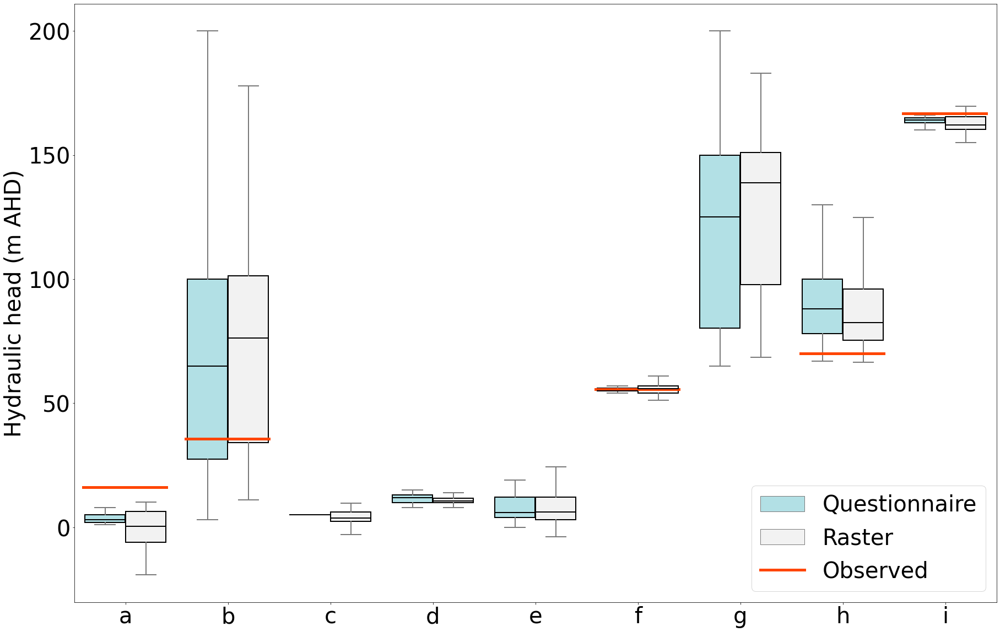

In [159]:
plt.figure(figsize=(30,20))
ax = sns.boxplot(x="Letter", y="value", 
                 hue="source", 
                 data=df_well_estimations_melt,
                notch=False, showcaps=True,
                palette=pal, 
                 showfliers=False,
                showmeans=False, boxprops=boxprops,
                medianprops=medianprops, 
                 meanprops=meanpointprops, width=.8, saturation=.5, linewidth=2
                )    

plt.gca().tick_params(axis='both', which='major', labelsize=40)
#plt.xlabel("Well letter", fontsize=40)
plt.ylabel("Hydraulic head (m AHD)", fontsize=40)


xs=np.linspace(0, 1, 10)
for i in range(len(df_well_ixs_p1p2)):
    x1 = xs[i] + .01
    x2 = xs[i] + .1
    y = df_well_ixs_p1p2.loc[df_well_ixs_p1p2.index[i],
                            'rswl']
    #print("%s: %2.2f mAHD, x=%2.2f" %(df_well_ixs_p1p2.index[i],y, x1))
    

    ax.axhline(y, x1, x2, ls='-', lw=5,color='orangered')
#plt.show()

plt.plot([-10,-10], [-10,10], ls='-', lw=5, color='orangered', label="Observed")
plt.xlim([-.5,8.5])

ax.set(xlabel=None)
plt.legend(fontsize=40, loc=4)


nm = os.path.join(figure_directory, "boxplot_rstr_survey")
plt.savefig(nm, dpi=300)

# Hypothesis testing: is the RMSE change with experience significant?

In [160]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

In [161]:
len(survey_df_0['RMSE_c'])

12

In [162]:
print("Calibration rmse mean for 0-3: %2.2f, n: %i"%(survey_df_0['RMSE_c'].mean(), 
                                                   len(survey_df_0['RMSE_c'])))
print("Calibration rmse mean for 4-10: %2.2f, n: %i"%(survey_df_4['RMSE_c'].mean(), 
                                                    len(survey_df_4['RMSE_c'])))
print("Calibration rmse mean for >10: %2.2f, n: %i"%(survey_df_10['RMSE_c'].mean(), 
                                                   len(survey_df_10['RMSE_c'])))

print("Prediction rmse mean for 0-3: %2.2f, n: %i"%(survey_df_0['RMSE_p'].mean(),
                                                   len(survey_df_0['RMSE_p'])))
print("Prediction rmse mean for 4-10: %2.2f, n: %i"%(survey_df_4['RMSE_p'].mean(),
                                                    len(survey_df_4['RMSE_p'])))
print("Prediction rmse mean for >10: %2.2f, n: %i"%(survey_df_10['RMSE_p'].mean(),
                                                   len(survey_df_10['RMSE_p'])))

Calibration rmse mean for 0-3: 13.31, n: 12
Calibration rmse mean for 4-10: 9.84, n: 13
Calibration rmse mean for >10: 8.81, n: 32
Prediction rmse mean for 0-3: 21.71, n: 12
Prediction rmse mean for 4-10: 19.84, n: 13
Prediction rmse mean for >10: 24.83, n: 32


### Create new dataframe with each parameter


In [163]:
#survey_df.columns

In [164]:
anova_df = survey_df.drop(columns={'Order', 'REF_R', 'REF', 'ID', 'a', 'b', 'c', 'd', 'e', 'f', 'g', 'h',
                                  'i', 'Comments', 'Approximately how long did the mapping take you?',
       'Did you have a prior preconceived idea of what the water table map should look like?',
       'Do you identify any areas where there were water level data points that you ignored or struggled to fit? (Please describe the area or use the grid reference numbers, for example A1)',
                                   'If yes to the previous question (that there were areas of the map difficult to fit), why was this so?',
       'What other information in addition to groundwater level point data did you use?',
       'What other information in addition to groundwater level point data did you use?2',
       'What other data would you choose to help with your water table mapping?',
       'When viewing the data and your final map, are there any locations that you think there are existing pumping wells? (If yes, please use the grid reference numbers, for example A1)',
                                   'What do you think is the dominant flow direction or directions? (Please state as a flow direction towards, for example SE would mean flow is from NW towards the SE)',
                                    'What do you identify as being your primary area of expertise?',
                                  'What is your usual platform for water table mapping? (Select as many as apply)',
       'What is your usual preferred technique(s) for water table mapping? (Select as many as apply)',
       'For the stream reach in grid cell F4 (upstream of point e) would you estimate it is a gaining or losing stream?'
                    
})

In [165]:
anova_df.columns

Index(['Were there any other areas of the map that were particularly difficult to draw contours for? (Please describe the area or use the grid reference numbers, for example A1)',
       'What is your highest level of education?',
       'How many years of experience do you have in this field and related areas?',
       'Have you done water table mapping before?',
       'Have you worked on the hydrogeology of the Willunga region before?',
       'RMSE_c', 'RMSE_p'],
      dtype='object')

In [166]:
anova_df = anova_df.drop(columns={anova_df.columns[0]})

In [167]:
anova_df = anova_df.rename(columns={'What is your highest level of education?': 'education',
                                   'How many years of experience do you have in this field and related areas?': 'experience_yrs',
                                   'Have you done water table mapping before?': 'experience_wt',
                                   'Have you worked on the hydrogeology of the Willunga region before?':
                                   'experience_will'})

In [168]:
#anova_df.head(10)

## Different ANOVA tool (2way?)

## Experience in years

In [169]:
model = ols('RMSE_c ~ C(experience_yrs)', data=anova_df).fit()
sm.stats.anova_lm(model, typ=2) 

,sum_sq,df,F,PR(>F)
C(experience_yrs),157.545674,2.0,2.644839,0.081569
Residual,1399.829627,47.0,NaN,NaN


## Experience in water table mapping

In [170]:
print("Experience in WT mapping, Calibration RMSE:")
print("YES")
print("n = %i" %anova_df[anova_df["experience_wt"]=="Yes"].count()["RMSE_c"])
print("mean: %2.2f" % np.nanmean(anova_df[anova_df["experience_wt"]=="Yes"]["RMSE_c"]))

print("NO")
print("n = %i" %anova_df[anova_df["experience_wt"]=="No"].count()["RMSE_c"])
print("mean: %2.2f" % np.nanmean(anova_df[anova_df["experience_wt"]=="No"]["RMSE_c"]))
print("* * *")
print("Experience in WT mapping, Predition RMSE:")
print("YES")
print("n = %i" %anova_df[anova_df["experience_wt"]=="Yes"].count()["RMSE_p"])
print("mean: %2.2f" % np.nanmean(anova_df[anova_df["experience_wt"]=="Yes"]["RMSE_p"]))

print("NO")
print("n = %i" %anova_df[anova_df["experience_wt"]=="No"].count()["RMSE_p"])
print("mean: %2.2f" % np.nanmean(anova_df[anova_df["experience_wt"]=="No"]["RMSE_p"]))

Experience in WT mapping, Calibration RMSE:
YES
n = 37
mean: 9.16
NO
n = 14
mean: 12.53
* * *
Experience in WT mapping, Predition RMSE:
YES
n = 37
mean: 23.09
NO
n = 14
mean: 21.92


In [171]:
model = ols('RMSE_c ~ C(experience_wt)', data=anova_df).fit()
sm.stats.anova_lm(model, typ=2) 

,sum_sq,df,F,PR(>F)
C(experience_wt),115.082446,1.0,3.907704,0.053707
Residual,1443.057081,49.0,NaN,NaN


## Experience working in Willunga

In [172]:
print("Experience in Willunga, Calibration RMSE:")
print("YES")
print("n = %i" %anova_df[anova_df["experience_will"]=="Yes"].count()["RMSE_c"])
print("mean: %2.2f" % np.nanmean(anova_df[anova_df["experience_will"]=="Yes"]["RMSE_c"]))

print("NO")
print("n = %i" %anova_df[anova_df["experience_will"]=="No"].count()["RMSE_c"])
print("mean: %2.2f" % np.nanmean(anova_df[anova_df["experience_will"]=="No"]["RMSE_c"]))
print("* * *")
print("Experience in Willunga, Predition RMSE:")
print("YES")
print("n = %i" %anova_df[anova_df["experience_will"]=="Yes"].count()["RMSE_p"])
print("mean: %2.2f" % np.nanmean(anova_df[anova_df["experience_will"]=="Yes"]["RMSE_p"]))

print("NO")
print("n = %i" %anova_df[anova_df["experience_will"]=="No"].count()["RMSE_p"])
print("mean: %2.2f" % np.nanmean(anova_df[anova_df["experience_will"]=="No"]["RMSE_p"]))

Experience in Willunga, Calibration RMSE:
YES
n = 7
mean: 9.61
NO
n = 44
mean: 10.16
* * *
Experience in Willunga, Predition RMSE:
YES
n = 7
mean: 25.87
NO
n = 44
mean: 22.28


In [173]:
model = ols('RMSE_c ~ C(experience_will)', data=anova_df).fit()
sm.stats.anova_lm(model, typ=2) 

,sum_sq,df,F,PR(>F)
C(experience_will),1.838112,1.0,0.057873,0.810894
Residual,1556.301415,49.0,NaN,NaN


In [174]:
# Can delete - shows F statistic calculation below.
# F = (sum_sq/df)[for the C]/(sum_sq/df[for the resid])
# df for sample is number of categories -1 (=2)
# df for the residual is the number of samples -1 (=46)
(227.280145/3)/(1330.850182/46)

2.6185984496738293

In [175]:
model = ols('RMSE_c ~ C(education)', data=anova_df).fit()
sm.stats.anova_lm(model, typ=2) 

,sum_sq,df,F,PR(>F)
C(education),227.280145,3.0,2.618598,0.062095
Residual,1330.850182,46.0,NaN,NaN


## Prediction ANOVA

In [176]:
model = ols('RMSE_p ~ C(experience_yrs)', data=anova_df).fit()
sm.stats.anova_lm(model, typ=2) 

,sum_sq,df,F,PR(>F)
C(experience_yrs),233.364888,2.0,0.536671,0.588232
Residual,10218.696435,47.0,NaN,NaN


In [177]:
model = ols('RMSE_p ~ C(experience_wt)', data=anova_df).fit()
sm.stats.anova_lm(model, typ=2) 

,sum_sq,df,F,PR(>F)
C(experience_wt),14.034695,1.0,0.0658,0.798627
Residual,10451.400281,49.0,NaN,NaN


In [178]:
model = ols('RMSE_p ~ C(experience_will)', data=anova_df).fit()
sm.stats.anova_lm(model, typ=2) 

,sum_sq,df,F,PR(>F)
C(experience_will),77.627851,1.0,0.366176,0.547889
Residual,10387.807125,49.0,NaN,NaN


In [179]:
model = ols('RMSE_p ~ C(education)', data=anova_df).fit()
sm.stats.anova_lm(model, typ=2) 

,sum_sq,df,F,PR(>F)
C(education),1316.752632,3.0,2.24212,0.095994
Residual,9004.962158,46.0,NaN,NaN


## Perform 1 way ANOVA (different way)

In [180]:
rmse_c_0y = survey_df_0['RMSE_c'].values.tolist()
rmse_c_4y = survey_df_4['RMSE_c'].values.tolist()
rmse_c_10y = survey_df_10['RMSE_c'].values.tolist()

rmse_p_0y = survey_df_0['RMSE_p'].values.tolist()
rmse_p_4y = survey_df_4['RMSE_p'].values.tolist()
rmse_p_10y = survey_df_10['RMSE_p'].values.tolist()

### Remove nan values

In [181]:
rmse_c_0y_1 = []
rmse_c_4y_1 = []
rmse_c_10y_1 = []

for i in range(len(rmse_c_0y)):

    if rmse_c_0y[i]>0:
        rmse_c_0y_1.append(rmse_c_0y[i])
        
    else:
        pass
        
for i in range(len(rmse_c_4y)):
    #print(rmse_c_0y[i])

    if rmse_c_4y[i]>0:
        #print(True)
        rmse_c_4y_1.append(rmse_c_4y[i])
        
    else:
        pass
        
for i in range(len(rmse_c_10y)):
    #print(rmse_c_0y[i])

    if rmse_c_10y[i]>0:
        #print(True)
        rmse_c_10y_1.append(rmse_c_10y[i])
        
    else:
        pass


### Prediction rmse

In [182]:
rmse_p_0y_1 = []
for i in range(len(rmse_p_0y)):

    if rmse_p_0y[i]>0:
        rmse_p_0y_1.append(rmse_p_0y[i])
        
    else:
        pass
    
rmse_p_4y_1 = []
for i in range(len(rmse_p_4y)):

    if rmse_p_4y[i]>0:
        rmse_p_4y_1.append(rmse_p_4y[i])
        
    else:
        pass
    
rmse_p_10y_1 = []
for i in range(len(rmse_p_10y)):

    if rmse_p_10y[i]>0:
        rmse_p_10y_1.append(rmse_p_10y[i])
        
    else:
        pass

## 1-way ANOVA with combining 4+ years experience

In [183]:
stats.f_oneway(rmse_c_0y_1, rmse_c_4y_1+rmse_c_10y_1)

F_onewayResult(statistic=5.050363575615676, pvalue=0.02925382947173401)

# Printing results for tables, calibration data

In [184]:

print("Mean, n RMSE C 0-3y:")
print(np.mean(rmse_c_0y_1))
print(len(rmse_c_0y_1))

print("Mean, n RMSE C 4-10y:")
print(np.mean(rmse_c_4y_1))
print(len(rmse_c_4y_1))

print("Mean, n RMSE C 10+y:")
print(np.mean(rmse_c_10y_1))
print(len(rmse_c_10y_1))

print("Mean, n RMSE C 4+y:")
print(np.mean(rmse_c_4y_1+rmse_c_10y_1))
print(len(rmse_c_4y_1+rmse_c_10y_1))

Mean, n RMSE C 0-3y:
13.311202060419534
11
Mean, n RMSE C 4-10y:
9.844315525153204
13
Mean, n RMSE C 10+y:
8.80928728517491
26
Mean, n RMSE C 4+y:
9.15429669850101
39


# Printing results for tables, prediction data

In [185]:
print("Mean, n RMSE P 0-3y:")
print(np.mean(rmse_p_0y_1))
print(len(rmse_p_0y_1))

print("Mean, n RMSE P 4-10y:")
print(np.mean(rmse_p_4y_1))
print(len(rmse_p_4y_1))

print("Mean, n RMSE P 10+y:")
print(np.mean(rmse_p_10y_1))
print(len(rmse_p_10y_1))

print("Mean, n RMSE P 4+y:")
print(np.mean(rmse_p_4y_1+rmse_p_10y_1))
print(len(rmse_p_4y_1+rmse_p_10y_1))

Mean, n RMSE P 0-3y:
21.70640023614391
11
Mean, n RMSE P 4-10y:
19.844286951414297
13
Mean, n RMSE P 10+y:
24.82614935026732
26
Mean, n RMSE P 4+y:
23.165528550649643
39


## 1 way ANOVA for predictions with combining 4+ years

In [186]:
F, p = stats.f_oneway(rmse_p_0y_1, rmse_p_4y_1+rmse_p_10y_1)
print("F: %f, p: %f" %(F, p))

F: 0.084038, p: 0.773147


# More spatial analysis - made into a function

Play with the mean array for now

In [187]:
def spatial_wt(wt_array):
    
    # Gradient of water table
    gradient_wt = np.gradient(wt_array)
    nrow_a, ncol_a = wt_array.shape 
    
    x_a = np.arange(0, ncol_a)
    y_a = np.arange(0, nrow_a)
    xi_a, yi_a = np.meshgrid(x_a, y_a)
    
    # Version of gradients that are scaled, for the quiver plot
    
    skipcells = 5
    X_a_sc = xi_a[::skipcells, ::skipcells]
    Y_a_sc = yi_a[::skipcells, ::skipcells]
    x_mult = 0.05
    y_mult = 0.05
    
    U_a_sc = x_mult*(gradient_wt[1][::skipcells, ::skipcells])
    V_a_sc = y_mult*(gradient_wt[0][::skipcells, ::skipcells])
    
    
    # Version of gradients that are not scaled
    
    X_a = xi_a
    Y_a = yi_a
    
    U_a = gradient_wt[1]
    V_a = gradient_wt[0]
    
    
    return gradient_wt, X_a_sc, Y_a_sc, U_a_sc, V_a_sc, X_a, Y_a, U_a, V_a

In [188]:
gradient_wt, X_a_sc, Y_a_sc, U_a_sc, V_a_sc, X_a, Y_a, U_a, V_a = spatial_wt(mean_array)

## Calculate flow direction orientations and gradient magnitudes

X_a = X coordinates of arrow locations<br>
Y_a = Y coordinates of arrow locations<br>
U_a = X direction components of arrow vectors<br>
V_a = Y direction components of arrow vectors<br>
  

In [189]:
def flow_calcs(U_a, V_a):
    
    flow_orientations = []
    flow_lengths = []

    for i in range(len(U_a.flatten())):
        xval = -U_a.flatten()[i]
        yval = -V_a.flatten()[i]

        if math.isnan(xval) == True or math.isnan(yval) == True:
            pass

        else:
            #print(xval, yval)

            flow_length = np.sqrt(xval**2 + yval**2)
            flow_lengths.append(flow_length)

            # First case: 0-90 degrees:
            if xval>0 and yval>0:
                orient = math.degrees(math.atan(abs(xval)/abs(yval)))

            elif xval>0 and yval<0:
                orient = 90 + 90 - math.degrees(math.atan(abs(xval)/abs(yval)))
                #plt.plot([0, xval], [0, -yval], c='k')

            elif xval<0 and yval<0:
                orient = 180 +  math.degrees(math.atan(abs(xval)/abs(yval)))

            elif xval<0 and yval>0:
                orient = 270+90-math.degrees(math.atan(abs(xval)/abs(yval)))

            else:
                pass

            flow_orientations.append(orient)
        
    return flow_orientations, flow_lengths

In [190]:
flow_orientations, flow_lengths = flow_calcs(U_a, V_a)

 ## Make Rose plot

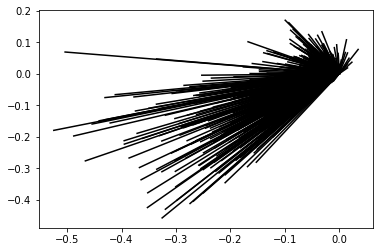

In [191]:
plt.plot()


for i in range(len(U_a_sc.flatten())):
    xval = -U_a_sc.flatten()[i]
    yval = -V_a_sc.flatten()[i]
    

    if math.isnan(xval) == True or math.isnan(yval) == True :
        pass

    else:
            
        plt.plot([0, xval], [0, yval], c='k')


In [192]:
max(flow_orientations)

359.966570242009

In [193]:
figure_directory

'C:\\Users\\mar886\\WaterTableProject\\Willunga\\willunga_wt\\figures\\paper'

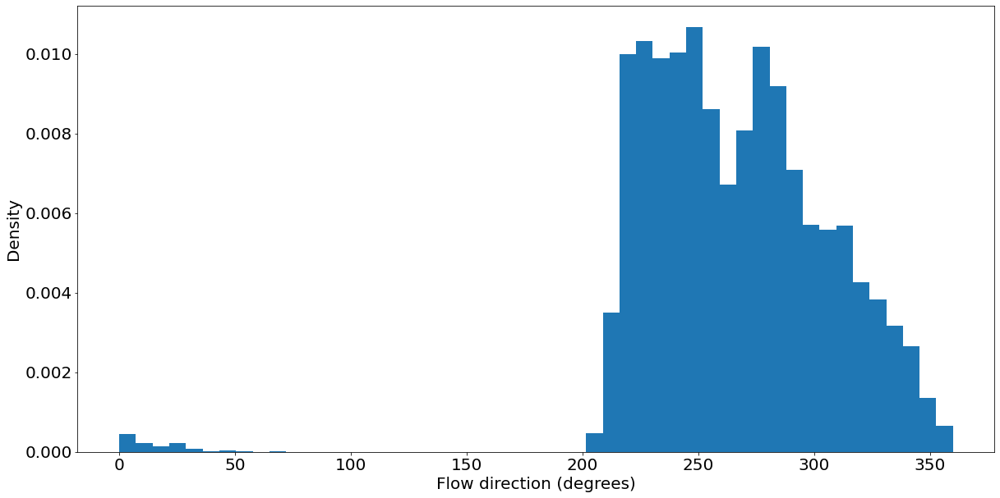

In [194]:
plt.figure(figsize=(20,10))
plt.hist(flow_orientations, bins=50, density=True)
plt.xlabel("Flow direction (degrees)", fontsize=20)
plt.ylabel("Density", fontsize=20)
plt.gca().tick_params(axis='both', which='major', labelsize=20)

nm = os.path.join(figure_directory, "hist_flow_directions")
plt.savefig(nm, dpi=300)

## Histogram of flow lengths - but this is confusing concept, not actual flow path lengths, to do with the gradient values. Just the magnitude of the gradient

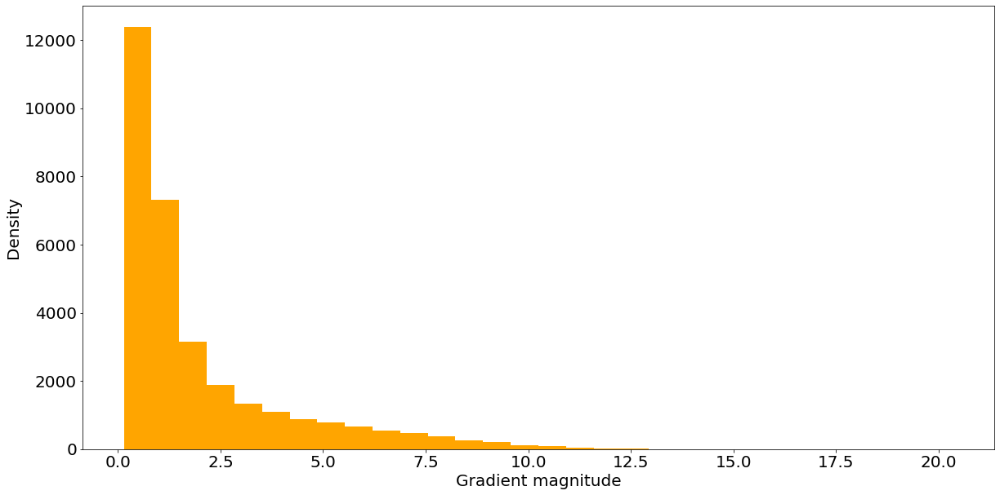

In [195]:
plt.figure(figsize=(20,10))
plt.hist(flow_lengths, bins=30, color='orange')
plt.xlabel("Gradient magnitude", fontsize=20)
plt.ylabel("Density", fontsize=20)
plt.gca().tick_params(axis='both', which='major', labelsize=20)

nm = os.path.join(figure_directory, "hist_gradient_magn")
plt.savefig(nm, dpi=300)

# Spatial figures

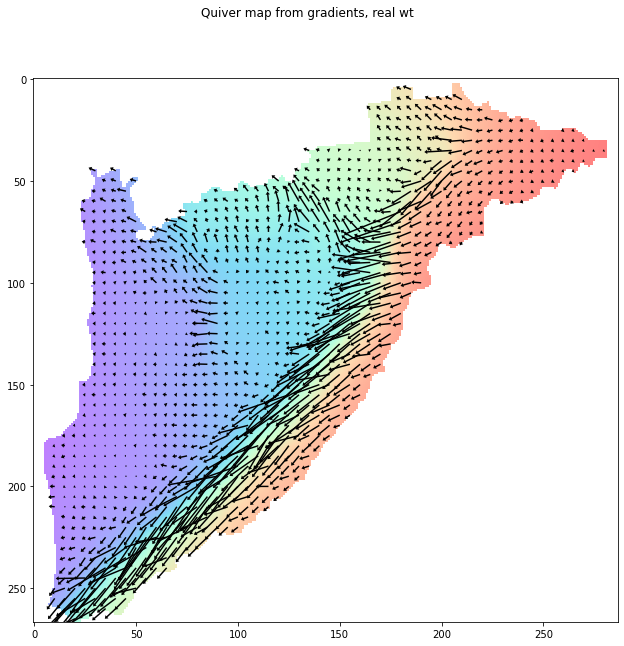

In [196]:
plt.figure(figsize=(20,10))
plt.suptitle("Quiver map from gradients, real wt")
plt.imshow(mean_array, alpha=0.5, cmap=wt_cmap)

plt.quiver(X_a_sc, Y_a_sc, -U_a_sc, -V_a_sc, 
           color='k', scale=5, headwidth=3,
           headlength=2,headaxislength=2, width=0.0025)

nm = os.path.join(figure_directory, "quiver_mean")
plt.savefig(nm, dpi=300)

## Plot streamplot

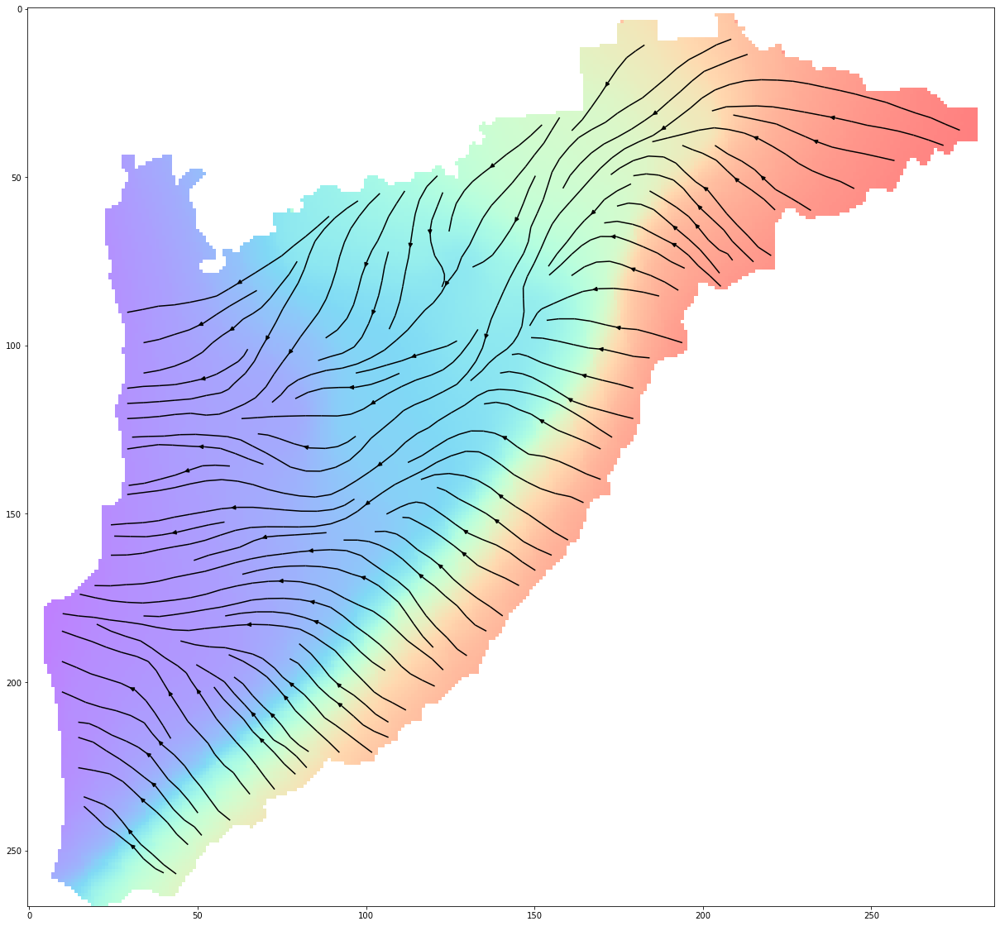

In [197]:
fig1, ax1 = plt.subplots(1, figsize=(30,20))
ax1.imshow(mean_array, alpha=0.5, cmap=wt_cmap)
ax1.streamplot(X_a, Y_a, -U_a, -V_a, density=2, color="k")
nm = os.path.join(figure_directory, "streamplot_mean")
plt.savefig(nm, dpi=300)

# Spatial plots per type

In [198]:
interesting_ixs

[0, 53, 15, 56]

In [199]:
# Maps used for types
for i in interesting_ixs:
    print(names_list[i])

001.out
R01.out
026.out
SJ01.out


In [200]:
for map_i in range(len(interesting_ixs)):

    gradient_wt, X_a_sc, Y_a_sc, U_a_sc, V_a_sc, X_a, Y_a, U_a, V_a = spatial_wt(wt_array_stack[interesting_ixs[map_i]])
    flow_orientations, flow_lengths = flow_calcs(U_a, V_a)
    
    # hist flow directions
    
    plt.figure(figsize=(20,10))
    plt.hist(flow_orientations, bins=50, density=True)
    plt.xlabel("Flow direction (degrees)", fontsize=20)
    plt.ylabel("Density", fontsize=20)
    plt.gca().tick_params(axis='both', which='major', labelsize=20)

    nm = os.path.join(figure_directory, "hist_flow_directions_int_%i"%map_i)
    plt.savefig(nm, dpi=300)
    
    # Hist flow lengths/mags
    
    plt.figure(figsize=(20,10))
    plt.hist(flow_lengths, bins=30, color='orange')
    plt.xlabel("Gradient magnitude", fontsize=20)
    plt.ylabel("Density", fontsize=20)
    plt.gca().tick_params(axis='both', which='major', labelsize=20)

    nm = os.path.join(figure_directory, "hist_gradient_magn_int_%i"%map_i)
    plt.savefig(nm, dpi=300)
                      
                      # Streamplot
                      
    fig1, ax1 = plt.subplots(1, figsize=(30,20))
    ax1.imshow(wt_array_stack[interesting_ixs[map_i]], alpha=0.5, cmap=wt_cmap)
    ax1.streamplot(X_a, Y_a, -U_a, -V_a, density=2, color="k")
    nm = os.path.join(figure_directory, "streamplot_mean_int_%i"%map_i)
    plt.savefig(nm, dpi=300)
    
    plt.close('all')


In [201]:
interesting_ixs

[0, 53, 15, 56]

In [202]:
np.nanmax(wt_array_stack[56])

265.9341125488281

In [203]:
r"$\mu$ = %i"%np.nanmean(flow_orientations)

'$\\mu$ = 247'

In [204]:
# working well:
gs = gridspec.GridSpec(4, 2, figure = fig,
                       wspace=0.1, hspace=0.1,
                       width_ratios=[1, 1], height_ratios=[.5, 2, .5, 2])

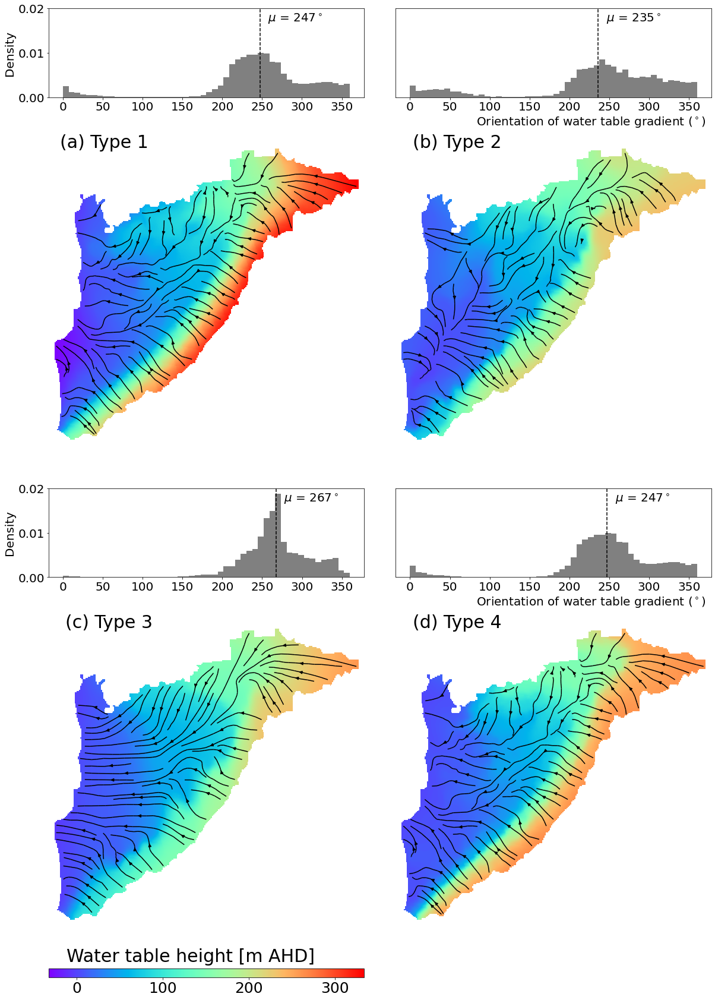

In [205]:
density_plot = 1.5 #2
vminplot = -33
vmaxplot = 334
alpha_wt=1
letfs = 30

fig=plt.figure(figsize=(20,30))
gs = gridspec.GridSpec(5, 2, figure = fig,
                       wspace=0.1, hspace=0.1,
                       width_ratios=[1, 1], height_ratios=[.5, 2, .5, 2, .05])

# First  plot - histogram of flow directions TYPE # 1 - - - - - - - - - - - - - - - - - - - - - 

ix = interesting_ixs[0]

gradient_wt, X_a_sc, Y_a_sc, U_a_sc, V_a_sc, X_a, Y_a, U_a, V_a = spatial_wt(wt_array_stack[i])
flow_orientations, flow_lengths = flow_calcs(U_a, V_a)
#
ax1= plt.subplot(gs[0]) 
#
ax1.hist(flow_orientations, bins=50, density=True, color="0.5")
plt.ylabel("Density", fontsize=20)
ax1.tick_params(axis='both', which='major', labelsize=20)

plt.ylim([0,.02])

plt.axvline(np.nanmean(flow_orientations), ls='--', color='k')
plt.text(np.nanmean(flow_orientations)+10, 0.017, r"$\mu$ = %i$^\circ$"%np.nanmean(flow_orientations), fontsize=20)

#plt.text(10, .017, "(a)", fontsize=20)

# Second plot - streamplot TYPE # 1 - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
#
ax2 = plt.subplot(gs[2]) 
#
ax2.imshow(wt_array_stack[interesting_ixs[ix]], alpha=alpha_wt, cmap=wt_cmap, vmin=vminplot, vmax=vmaxplot)
ax2.streamplot(X_a, Y_a, -U_a, -V_a, density=density_plot, color="k")

ax2.get_xaxis().set_visible(visibility)
ax2.get_yaxis().set_visible(visibility)

ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.spines['bottom'].set_visible(False)
ax2.spines['left'].set_visible(False)

plt.text(10, .9, "(a) Type 1", fontsize=letfs)


# Third  plot - histogram of flow directions TYPE # 2 - - - - - - - - - - - - - - - - - - - - - 

ix = interesting_ixs[1]

gradient_wt, X_a_sc, Y_a_sc, U_a_sc, V_a_sc, X_a, Y_a, U_a, V_a = spatial_wt(wt_array_stack[ix])
flow_orientations, flow_lengths = flow_calcs(U_a, V_a)
#
ax3= plt.subplot(gs[1]) 
#
ax3.hist(flow_orientations, bins=50, density=True, color="0.5")
#plt.xlabel("Orientation of water table gradient (Degrees)", fontsize=14)
plt.ylabel("Density", fontsize=20)
ax3.tick_params(axis='both', which='major', labelsize=20)
plt.xlabel("                    Orientation of water table gradient ($^\circ$)", fontsize=20)


plt.ylim([0,.02])

ax3.get_yaxis().set_visible(False)

plt.axvline(np.nanmean(flow_orientations), ls='--', color='k')
plt.text(np.nanmean(flow_orientations)+10, 0.017, r"$\mu$ = %i$^\circ$"%np.nanmean(flow_orientations), fontsize=20)

#plt.text(15, .017, "(b)", fontsize=20)

# Fourth plot - streamplot TYPE # 2 - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
#
ax4 = plt.subplot(gs[3]) 
#
ax4.imshow(wt_array_stack[ix], alpha=alpha_wt, cmap=wt_cmap, vmin=vminplot, vmax=vmaxplot)
ax4.streamplot(X_a, Y_a, -U_a, -V_a, density=density_plot, color="k")

ax4.get_xaxis().set_visible(visibility)
ax4.get_yaxis().set_visible(visibility)

ax4.spines['top'].set_visible(False)
ax4.spines['right'].set_visible(False)
ax4.spines['bottom'].set_visible(False)
ax4.spines['left'].set_visible(False)

plt.text(15, .9, "(b) Type 2", fontsize=letfs)


# Fifth  plot - histogram of flow directions TYPE # 3 - - - - - - - - - - - - - - - - - - - - - 

ix = interesting_ixs[2]

gradient_wt, X_a_sc, Y_a_sc, U_a_sc, V_a_sc, X_a, Y_a, U_a, V_a = spatial_wt(wt_array_stack[ix])
flow_orientations, flow_lengths = flow_calcs(U_a, V_a)
#
ax5= plt.subplot(gs[4]) 
#
ax5.hist(flow_orientations, bins=50, density=True, color="0.5")
#plt.xlabel("Flow direction (degrees)", fontsize=20)
plt.ylabel("Density", fontsize=20)
ax5.tick_params(axis='both', which='major', labelsize=20)

plt.ylim([0,.02])

plt.axvline(np.nanmean(flow_orientations), ls='--', color='k')
plt.text(np.nanmean(flow_orientations)+10, 0.017, r"$\mu$ = %i$^\circ$"%np.nanmean(flow_orientations), fontsize=20)

#plt.text(10, .017, "(e)", fontsize=20)


# Sixth plot - streamplot TYPE # 3 - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
#
ax6 = plt.subplot(gs[6]) 
#
ax6.imshow(wt_array_stack[ix], alpha=alpha_wt, cmap=wt_cmap, vmin=vminplot, vmax=vmaxplot)
ax6.streamplot(X_a, Y_a, -U_a, -V_a, density=density_plot, color="k")

ax6.get_xaxis().set_visible(visibility)
ax6.get_yaxis().set_visible(visibility)

ax6.spines['top'].set_visible(False)
ax6.spines['right'].set_visible(False)
ax6.spines['bottom'].set_visible(False)
ax6.spines['left'].set_visible(False)

plt.text(15, .9, "(c) Type 3", fontsize=letfs)


# Seventh  plot - histogram of flow directions TYPE # 4 - - - - - - - - - - - - - - - - - - - - - 

ix = interesting_ixs[3]

gradient_wt, X_a_sc, Y_a_sc, U_a_sc, V_a_sc, X_a, Y_a, U_a, V_a = spatial_wt(wt_array_stack[ix])
flow_orientations, flow_lengths = flow_calcs(U_a, V_a)
#
ax7= plt.subplot(gs[5]) 
#
ax7.hist(flow_orientations, bins=50, density=True, color="0.5")
plt.xlabel("                    Orientation of water table gradient ($^\circ$)", fontsize=20)
plt.ylabel("Density", fontsize=20)
ax7.tick_params(axis='both', which='major', labelsize=20)

plt.ylim([0,.02])

ax7.get_yaxis().set_visible(False)

plt.axvline(np.nanmean(flow_orientations), ls='--', color='k')
plt.text(np.nanmean(flow_orientations)+10, 0.017, r"$\mu$ = %i$^\circ$"%np.nanmean(flow_orientations), fontsize=20)

#plt.text(10, .017, "(f)", fontsize=20)


# Eighth plot - streamplot TYPE # 4 - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
#
ax8 = plt.subplot(gs[7]) 
#
im = ax8.imshow(wt_array_stack[ix], alpha=alpha_wt, cmap=wt_cmap, vmin=vminplot, vmax=vmaxplot)
ax8.streamplot(X_a, Y_a, -U_a, -V_a, density=density_plot, color="k")

ax8.get_xaxis().set_visible(visibility)
ax8.get_yaxis().set_visible(visibility)

ax8.spines['top'].set_visible(False)
ax8.spines['right'].set_visible(False)
ax8.spines['bottom'].set_visible(False)
ax8.spines['left'].set_visible(False)

plt.text(15, .9, "(d) Type 4", fontsize=letfs)

#---------------
# COLOUR BAR
ax9 = plt.subplot(gs[8])     

# Colourbar for the residuals
cmap = mpl.cm.ScalarMappable(
      norm = mcolors.Normalize(vminplot, vmaxplot), 
      cmap = plt.get_cmap(wt_cmap))

cmap.set_array([])
cb = fig.colorbar(cmap,  cax=ax9, orientation="horizontal")
cb.set_label("Water table height [m AHD]", labelpad=-80, x=.45, y=2000, fontsize=letfs)
cb.ax.tick_params(labelsize=25)  
#axes.plot(x,y, "kx", alpha=1, markersize=10, label="Hydraulic head measurement")    
#plt.legend(frameon=False, fontsize=18, loc=4)

# ------------------


nm = os.path.join(figure_directory, "four_int_flow")
plt.savefig(nm, dpi=300)

# Make a histogram of flow for every raster, just to see what it looks like

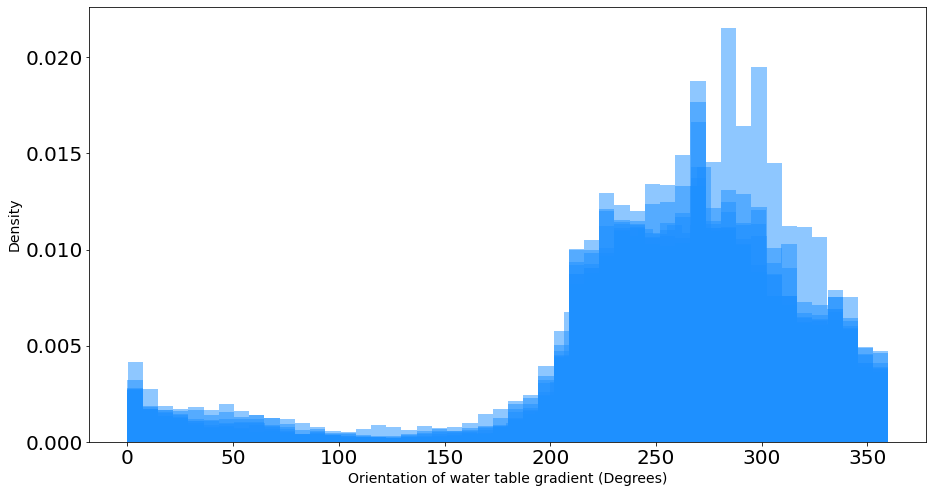

In [206]:
fig = plt.figure(figsize=(15,8))

ax1 = plt.subplot(111)

for i in range(len(wt_array_stack)):

    gradient_wt, X_a_sc, Y_a_sc, U_a_sc, V_a_sc, X_a, Y_a, U_a, V_a = spatial_wt(wt_array_stack[i])
    flow_orientations, flow_lengths = flow_calcs(U_a, V_a)
    #
    #
    ax1.hist(flow_orientations, bins=50, density=True, color="dodgerblue", alpha=0.5)
    plt.xlabel("Orientation of water table gradient (Degrees)", fontsize=14)
    plt.ylabel("Density", fontsize=14)
    ax1.tick_params(axis='both', which='major', labelsize=20)

    #plt.ylim([0,.02])

    #plt.axvline(np.nanmean(flow_orientations), ls='--', color='k')
    
nm = os.path.join(figure_directory, "hist_all_flow")
plt.savefig(nm, dpi=300)

# Plot survey bar plot for techniques

In [207]:
pref_technique_optns = ["Linear \ngeostatistics", "Manual", "Inverse \nweighting",
                       "Numerical \nmodelling", "Data driven \n(machine learning)",
                       "Splines", "Non-linear \ngeostatistics", "Unsure \nor None"]

pref_technique_responses = [26, 20, 11, 11, 4, 1, 2, 9]

In [208]:
usual_platform_optns = ["ArcGIS or \nQGIS", "Manual", "Surfer", "Python \nor R code",
                       "Groundwater \nmodelling GUIs", "Never done it"]

usual_platform_responses = [18, 18, 11, 12, 9, 10]

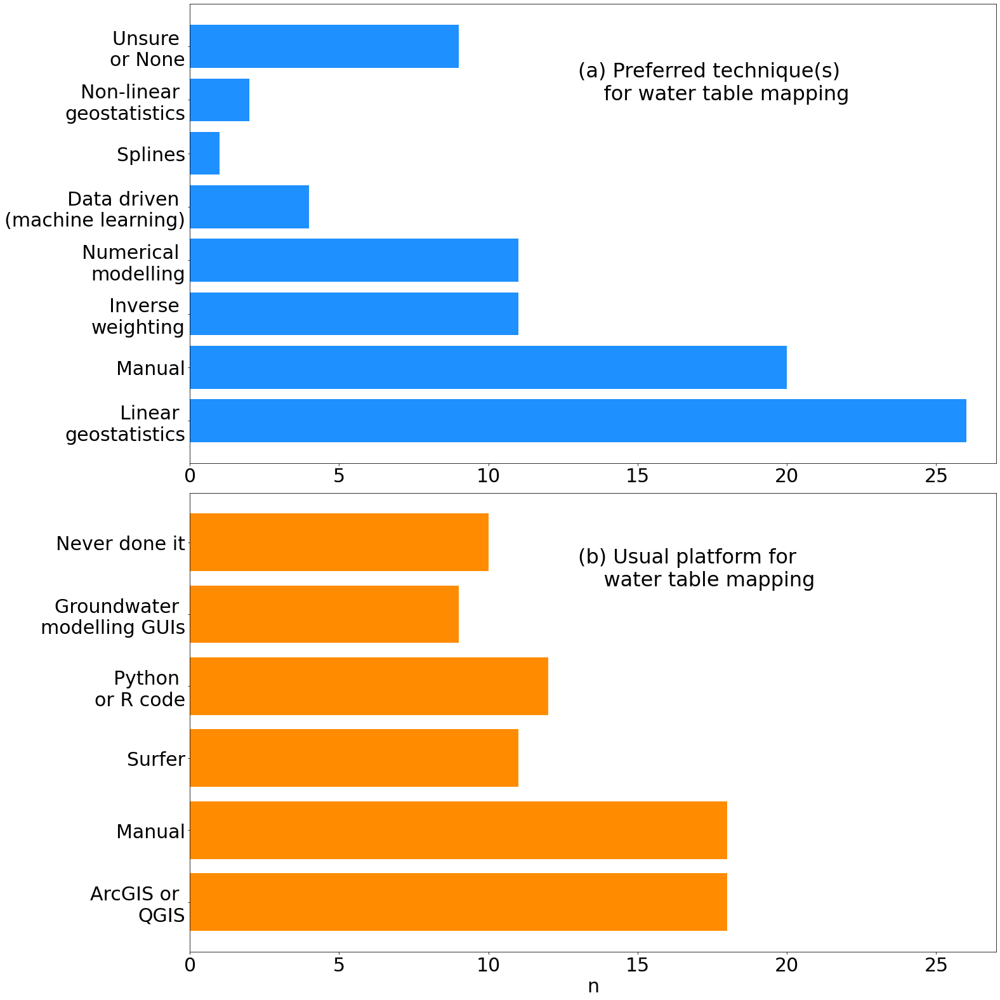

In [209]:
fig = plt.figure(figsize=(22,22))
ax = plt.subplot(211)
ax.barh(pref_technique_optns, pref_technique_responses, color="dodgerblue")
#plt.xticks(rotation=45)
#plt.xlabel("n")
plt.xlim([0,27])
ax.tick_params(axis='both', which='major', labelsize=30)
plt.text(13, 6, "(a) Preferred technique(s) \n    for water table mapping", fontsize=32)

ax1 = plt.subplot(212)
ax1.barh(usual_platform_optns, usual_platform_responses, color="darkorange")
plt.xlabel("n", fontsize=30)
plt.xlim([0,27])
ax1.tick_params(axis='both', which='major', labelsize=30)
plt.text(13, 4.4, "(b) Usual platform for \n    water table mapping", fontsize=32)

    
nm = os.path.join(figure_directory, "hist_techniques")
plt.savefig(nm, dpi=300)

plt.tight_layout()

### Same figure but with different sized subplots

In [210]:
figure_directory

'C:\\Users\\mar886\\WaterTableProject\\Willunga\\willunga_wt\\figures\\paper'

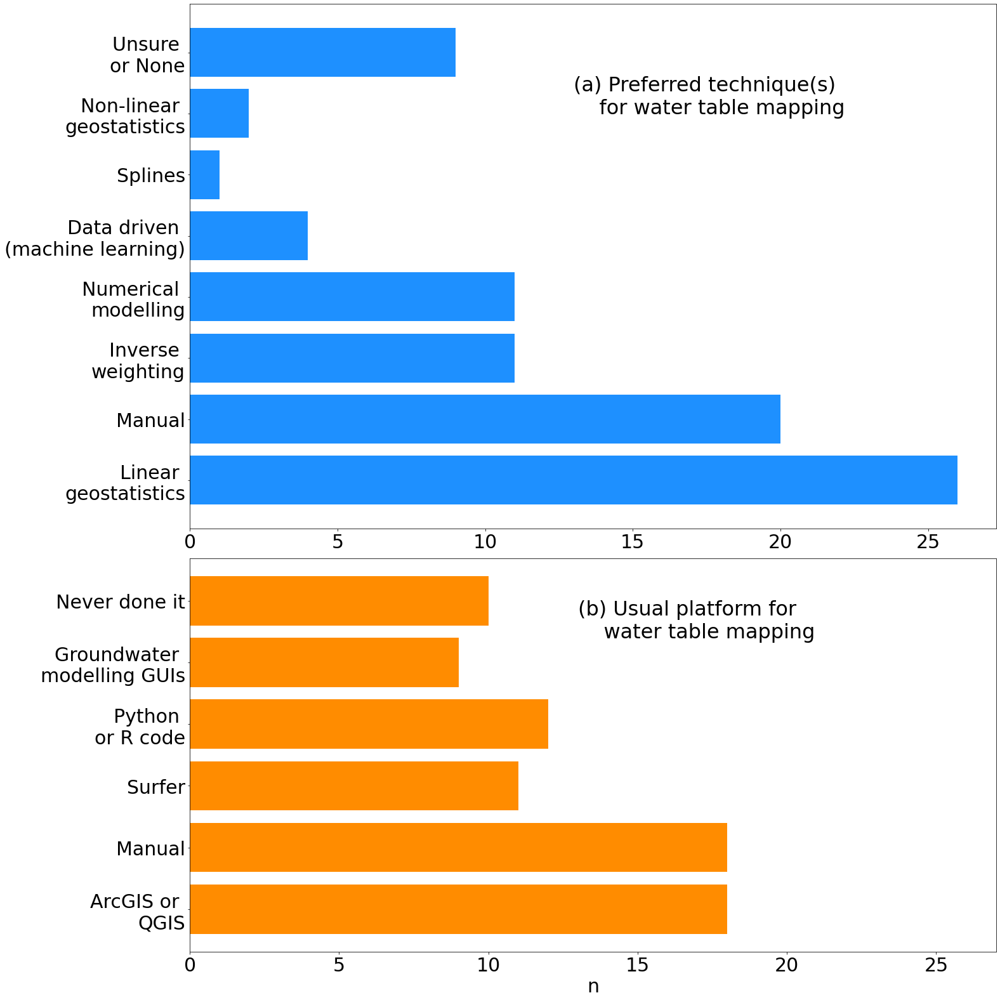

In [211]:
fig, (ax, ax1) = plt.subplots(2, 1, figsize=(22,22), gridspec_kw={'height_ratios': [8, 6]})

ax.barh(pref_technique_optns, pref_technique_responses, color="dodgerblue")
#plt.xticks(rotation=45)
#plt.xlabel("n")
plt.xlim([0,27])
ax.tick_params(axis='both', which='major', labelsize=30)
ax.text(13, 6, "(a) Preferred technique(s) \n    for water table mapping", fontsize=32)

ax1 = plt.subplot(212)
ax1.barh(usual_platform_optns, usual_platform_responses, color="darkorange")
plt.xlabel("n", fontsize=30)
plt.xlim([0,27])
ax1.tick_params(axis='both', which='major', labelsize=30)
ax1.text(13, 4.4, "(b) Usual platform for \n    water table mapping", fontsize=32)

fig.subplots_adjust(left=0.2)
plt.tight_layout()
  
nm = os.path.join(figure_directory, "hist_techniques")
plt.savefig(nm, dpi=300)



In [212]:
# What other data would you choose to help with your water table mapping?

extra_data_labels = ["Chemistry", "Water use", "Vegetation and \nland cover", "Bore information", 
                    "Geology", "Geophysics", "Surface water", "Hydrogeology", "Topography", "Climate"]

extra_data_values = [6, 6, 7, 6, 14, 1, 10, 8, 2, 2]

In [213]:
explode = [0.02] * (len(extra_data_values))


In [214]:
figure_directory

'C:\\Users\\mar886\\WaterTableProject\\Willunga\\willunga_wt\\figures\\paper'

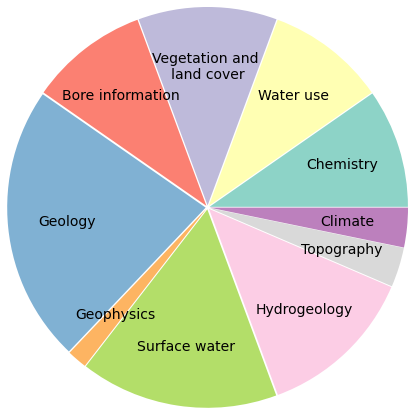

In [215]:
import seaborn as sns 


fig, ax = plt.subplots(figsize=(7,7))
patches, texts = ax.pie(extra_data_values, labels=extra_data_labels, explode=explode,
      radius=2, labeldistance=0.7, colors = sns.color_palette('Set3'),
      textprops=dict(color="k", fontsize=14))

for text in texts:
    text.set_horizontalalignment('center')
    
plt.tight_layout()
        
nm = os.path.join(figure_directory, "other_data")
plt.savefig(nm, dpi=300)

In [216]:
print(texts)

[Text(1.3548777479397136, 0.4250956223460899, 'Chemistry'), Text(0.8691905257403478, 1.1229015228252286, 'Water use'), Text(6.647499756686492e-08, 1.4199999999999984, 'Vegetation and \nland cover'), Text(-0.8691904206067158, 1.122901604204714, 'Bore information'), Text(-1.4127144531006939, -0.1436588806875759, 'Geology'), Text(-0.9249490540022295, -1.0774364238786345, 'Geophysics'), Text(-0.2150276348229055, -1.4036249913215664, 'Surface water'), Text(0.9783328572324727, -1.0292059174234016, 'Hydrogeology'), Text(1.3548776683390407, -0.42509587605170196, 'Topography'), Text(1.412714412749693, -0.14365927749118987, 'Climate')]


# Get average water level for normalised root mean square error

In [217]:
np.nanmean(df_well_ixs['rswl'])

81.63537313432835

In [218]:
nrmse = (np.mean(rmse_per_map) / np.nanmean(df_well_ixs['rswl']))*100

print("NRMSE = %2.2f percent" %nrmse)

NRMSE = 12.84 percent


# Get range of water levels for scaled root mean square error

In [221]:
rng = np.nanmax(df_well_ixs['rswl']) - np.nanmin(df_well_ixs['rswl'])
print(rng)

208.26000000000002


In [225]:
srmse = np.mean(rmse_per_map) * 100/rng

print(srmse)

5.0332136860907895
